# ENCUESTA DE CURSADA
## Segundo Cuatrimestre de 2021
### Departamento de Computación FIUBA

Se recomienda ejecutar este notebook con [jupyterlab](https://jupyterlab.readthedocs.io/en/stable/).

Código disponible en [github.com/CrossNox/FIUBA-encuesta-depto-computacion](https://github.com/CrossNox/FIUBA-encuesta-depto-computacion).

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style='darkgrid');
import sys
from IPython.display import display, Markdown
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from textwrap import wrap

pd.options.display.max_colwidth = None
pd.set_option('display.max_rows', None)

In [2]:
comp = pd.read_csv("../datasets/2021c2/Encuesta de Cursos Departamento de Computación 2021 2C (respuestas) - Respuestas de formulario 1.csv")

# Análisis de respuestas

## Total de Encuestas Procesadas

In [3]:
comp.pipe(len)

784

## Hay duplicados?

In [4]:
comp.duplicated().any()

False

## Encoding de preguntas de opción múltiple

In [5]:
map_opinion = {"Excelente": 5, "Muy Bueno": 4, "Bueno": 3, "Regular": 2, "Malo": 1}
map_sino = {"Sí": 5, "No": 0}
map_temas = {
    "Muy Interesantes": 5,
    "Interesantes": 4,
    "Poco Interesantes": 2,
    "Nada Interesantes": 1,
}
map_clases_teoricas = {
    "Excelentes": 5,
    "Muy Buenas": 4,
    "Buenas": 3,
    "Regulares": 2,
    "Malas": 1,
    "No hay clases teóricas": np.nan,
    "No hay clase teóricas": np.nan,
}
map_clases_practicas = {
    "Excelentes": 5,
    "Muy Buenas": 4,
    "Buenas": 3,
    "Regulares": 2,
    "Malas": 1,
    "No Hay Clases Prácticas": np.NaN,
}
map_dificultad_curso = {
    "Muy Facil": 5,
    "Muy Fácil": 5,
    "Facil": 4,
    "Fácil": 4,
    "Normal": 3,
    "Dificil": 2,
    "Difícil": 2,
    "Muy Dificil": 1,
    "Muy Difícil": 1,
}
map_dificultad_tp = {
    "Muy dificil": 1,
    "Muy difícil": 1,
    "Dificil": 2,
    "Difícil": 2,
    "Normal": 3,
    "Fácil": 4,
    "Facil": 4,
    "Muy Fácil": 5,
    "Muy fácil": 5,
    "Muy Facil": 5,
    "No hay TP": np.NaN,
}

comp.replace(
    {
        "Opinión General Sobre el Curso": map_opinion,
        "¿Aprobó la Cursada?": map_sino,
        "¿Cómo te Resultaron los Temas de la Materia?": map_temas,
        "¿Los Temas de la Materia Están Actualizados?": map_sino,
        "Nivel de las Clases Teóricas del Curso": map_clases_teoricas,
        "Nivel de las Clases Prácticas del Curso": map_clases_practicas,
        "Dificultad del Curso": map_dificultad_curso,
        "Dificultad del TP": map_dificultad_tp,
    },
    inplace=True,
)

cols_sino = ["¿Aprobó la Cursada?", "¿Los Temas de la Materia Están Actualizados?"]

#comp['¿Aprobó la Cursada?'] = comp['¿Aprobó la Cursada?'].astype('category')
#comp['¿Los Temas de la Materia Están Actualizados?'] = comp['¿Los Temas de la Materia Están Actualizados?'].astype('category')

In [6]:
comp['Promedio nivel teóricas y prácticas'] = (comp["Nivel de las Clases Teóricas del Curso"] + comp["Nivel de las Clases Prácticas del Curso"]) / 2

## Opinión general del curso

In [7]:
def reverse_map(m):
    return {v:k for k,v in m.items()}

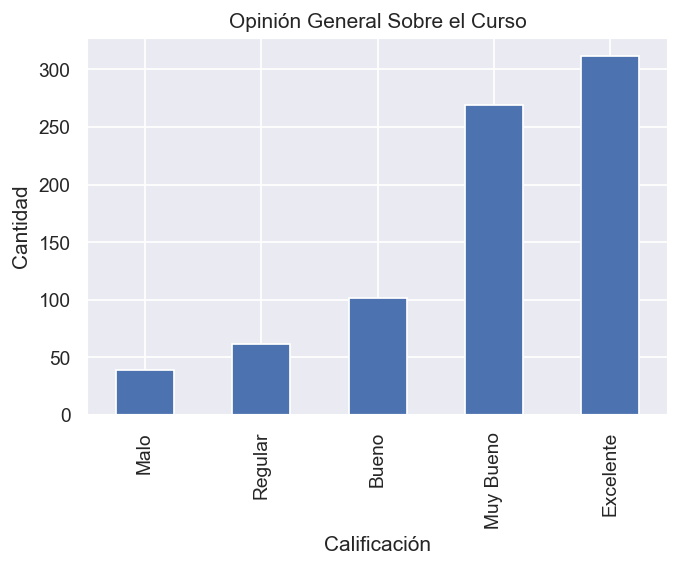

In [8]:
plt.figure(dpi=125)
plt.title('Opinión General Sobre el Curso')
ax = comp['Opinión General Sobre el Curso'].value_counts().sort_index().plot(kind='bar')
ax.set_xticklabels([reverse_map(map_opinion)[int(x.get_text())] for x in ax.get_xticklabels()])
plt.xlabel("Calificación")
plt.ylabel("Cantidad")
plt.show()

## Cantidad de Encuestados por Curso
Cantidad de encuestas completadas por cada Curso.

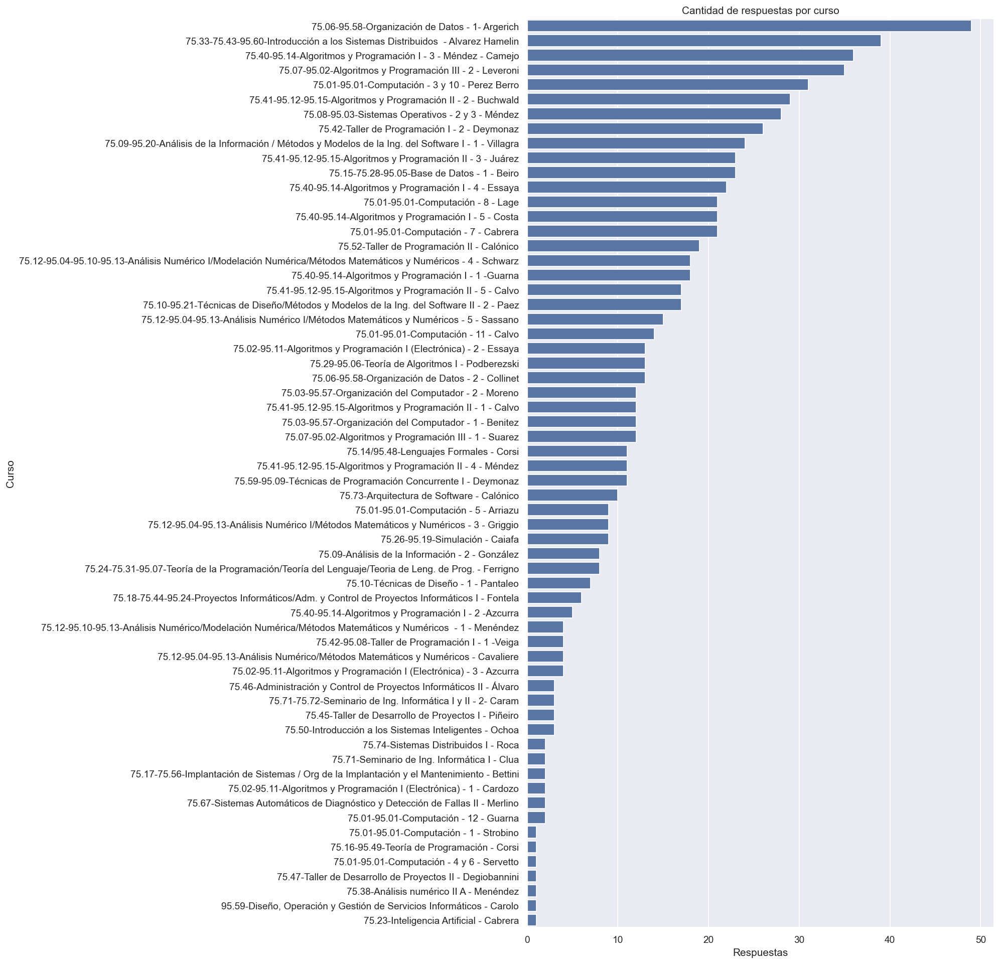

In [9]:
plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

data = comp['Elige el curso'].value_counts().sort_values(ascending=False)
ax = sns.barplot(x=data.values, y=data.index, color='b')

plt.title("Cantidad de respuestas por curso")
plt.xlabel("Respuestas")
plt.ylabel("Curso")

plt.show()

## Varianza de la Opinión por Curso
Este gráfico muestra la variabilidad de la pregunta "Opinión General Sobre el Curso", a menor valor mas consistentes los resultados de la encuesta. Los valores mayores muestran disparidad de resultados en cuanto a la opinión general sobre el curso.

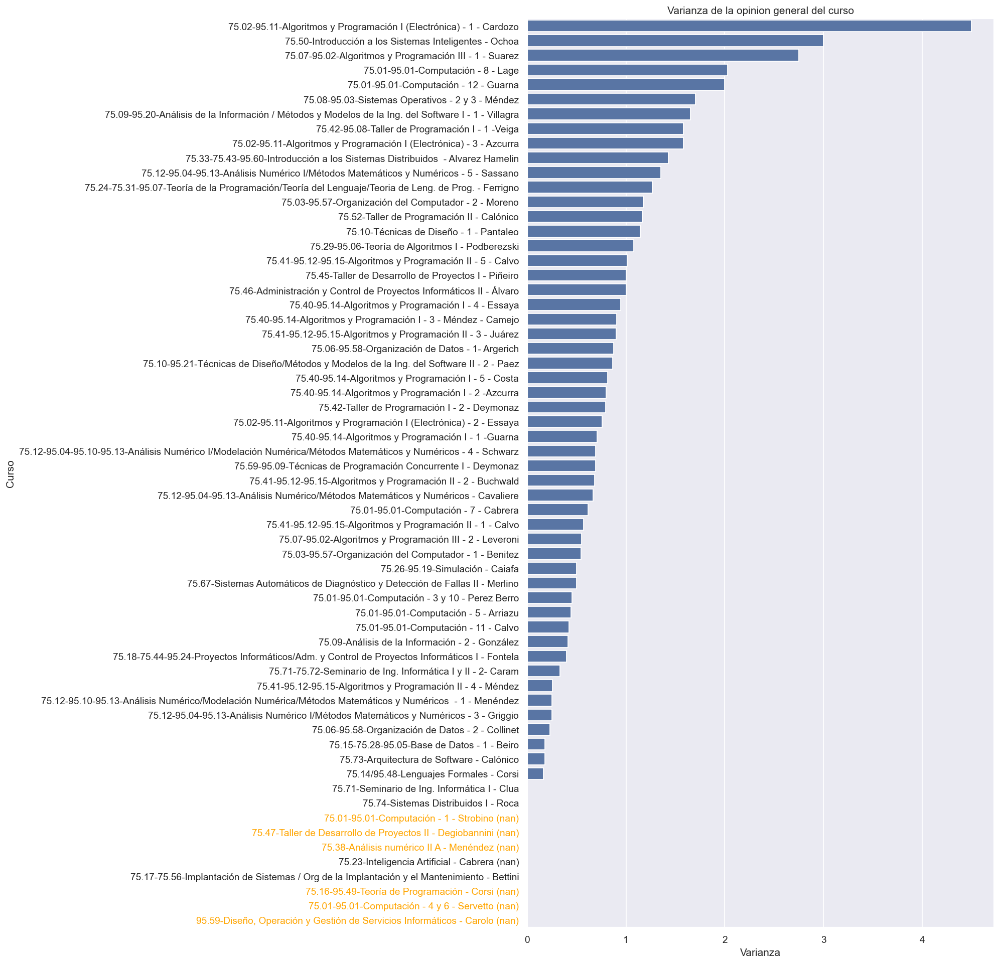

In [10]:
plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

var_curso = comp.groupby('Elige el curso')['Opinión General Sobre el Curso'].var()
nan_var = var_curso[var_curso.isna()].index.tolist()

data = var_curso.fillna(0).sort_values(ascending=False)

ax = sns.barplot(x=data.values, y=data.index, color='b')

ax.set_yticklabels([x if x.get_text() not in nan_var else f"{x.get_text()} (nan)" for x in ax.get_yticklabels()])

for yticklabel in ax.get_yticklabels():
    if yticklabel.get_text().rstrip(" (na)") in nan_var:
        yticklabel.set_color("orange")
    
plt.title("Varianza de la opinion general del curso")
plt.xlabel("Varianza")
plt.ylabel("Curso")

plt.show()

## Comparativa de promedios por pregunta
Esta matriz muestra el promedio de calificaciones para cada pregunta de la encuesta para los cursos que tienen 5 o mas encuestas. Orden alfabético por curso.

In [11]:
num_cols = ['Opinión General Sobre el Curso',
 '¿Aprobó la Cursada?',
 '¿Cómo te Resultaron los Temas de la Materia?',
 '¿Los Temas de la Materia Están Actualizados?',
 'Nivel de las Clases Teóricas del Curso',
 'Nivel de las Clases Prácticas del Curso',
 'Dificultad del Curso',
 'Dificultad del TP',
 'Promedio nivel teóricas y prácticas']

In [12]:
cursos_5p_respuestas = comp['Elige el curso'].value_counts().where(lambda x: x >= 5).dropna().index.tolist()
comp_5p = comp[comp['Elige el curso'].isin(cursos_5p_respuestas)].sort_values(by='Elige el curso')
comp_5p_mean = comp_5p.groupby('Elige el curso')[num_cols].mean()

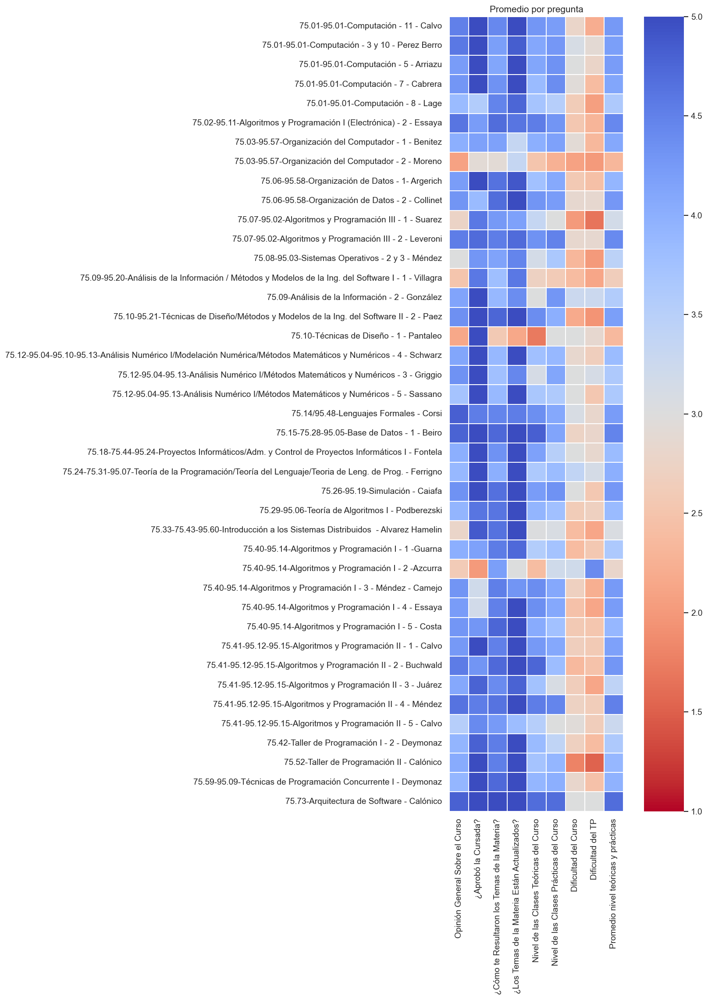

In [13]:
plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

sns.heatmap(data=comp_5p_mean, cmap='coolwarm_r',linewidths=.2, square=True, vmin=1, vmax=5)
plt.ylabel("")
plt.title("Promedio por pregunta")
plt.show()

## Histograma de promedios por pregunta
Por cada curso se calcula el promedio de cada pregunta numérica y luego se hace un histograma de esos promedios.

### Histograma de promedios de Opinión General Sobre el Curso

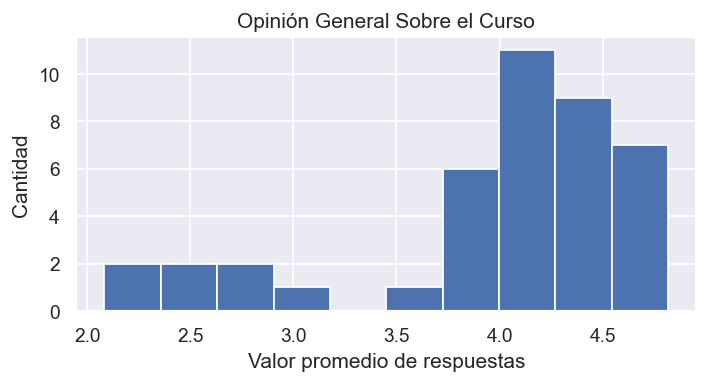

### Histograma de promedios de ¿Aprobó la Cursada?

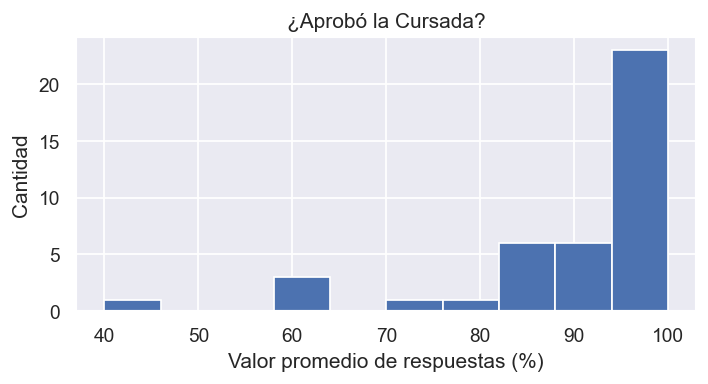

### Histograma de promedios de ¿Cómo te Resultaron los Temas de la Materia?

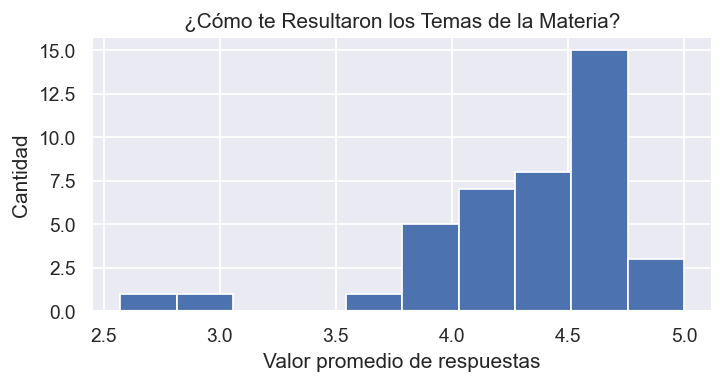

### Histograma de promedios de ¿Los Temas de la Materia Están Actualizados?

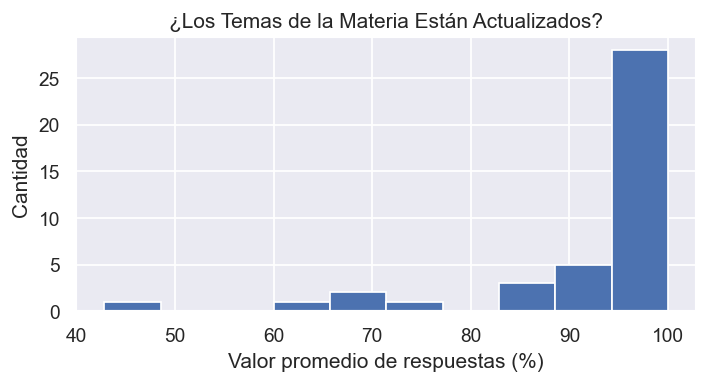

### Histograma de promedios de Nivel de las Clases Teóricas del Curso

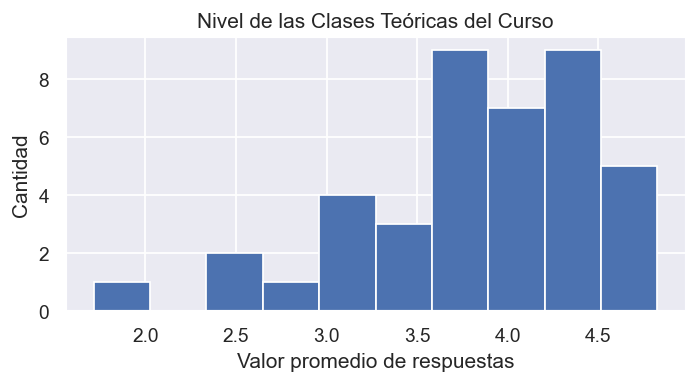

### Histograma de promedios de Nivel de las Clases Prácticas del Curso

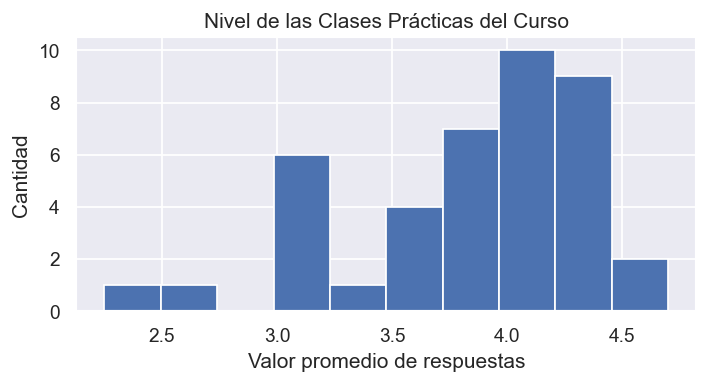

### Histograma de promedios de Dificultad del Curso

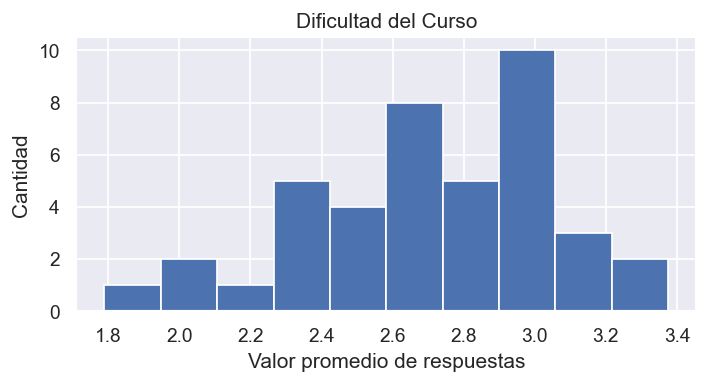

### Histograma de promedios de Dificultad del TP

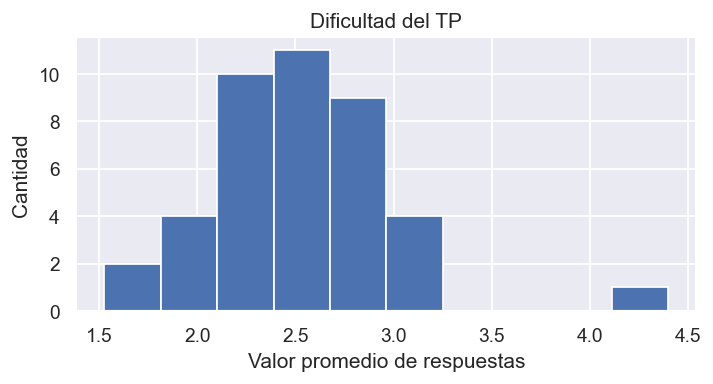

### Histograma de promedios de Promedio nivel teóricas y prácticas

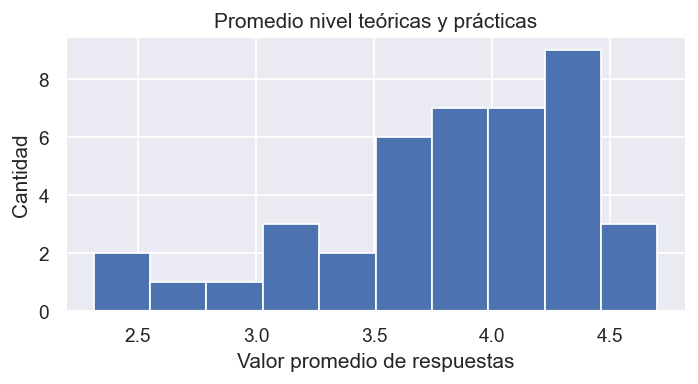

In [14]:
for col in num_cols:
    
    display(Markdown(f"### Histograma de promedios de {col}"))
    fig = plt.figure(dpi=125, figsize=(6.4, 2.9))
    
    values = comp_5p_mean[col].copy()
    if col in cols_sino:
        values *= 20
    
    plt.hist(values, bins=10)
    plt.title(col)
    plt.ylabel("Cantidad")
    
    xlabel = "Valor promedio de respuestas"
    if col in cols_sino:
        xlabel = f"{xlabel} (%)"
    
    plt.xlabel(xlabel)
    plt.show()

## Ranking de cursos por promedio

### Opinión General Sobre el Curso

Se analizan los promedios por curso de Opinión General Sobre el Curso. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

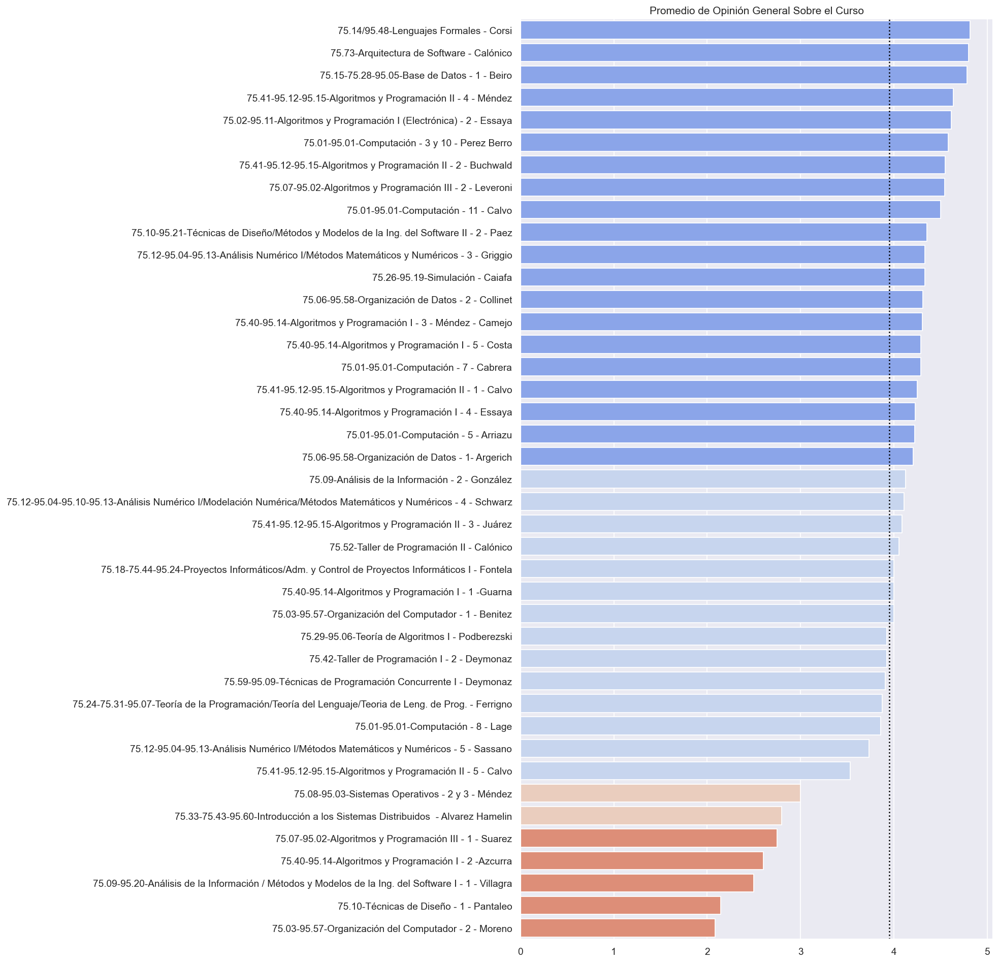

### ¿Aprobó la Cursada?

Se analizan los promedios por curso de ¿Aprobó la Cursada?. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

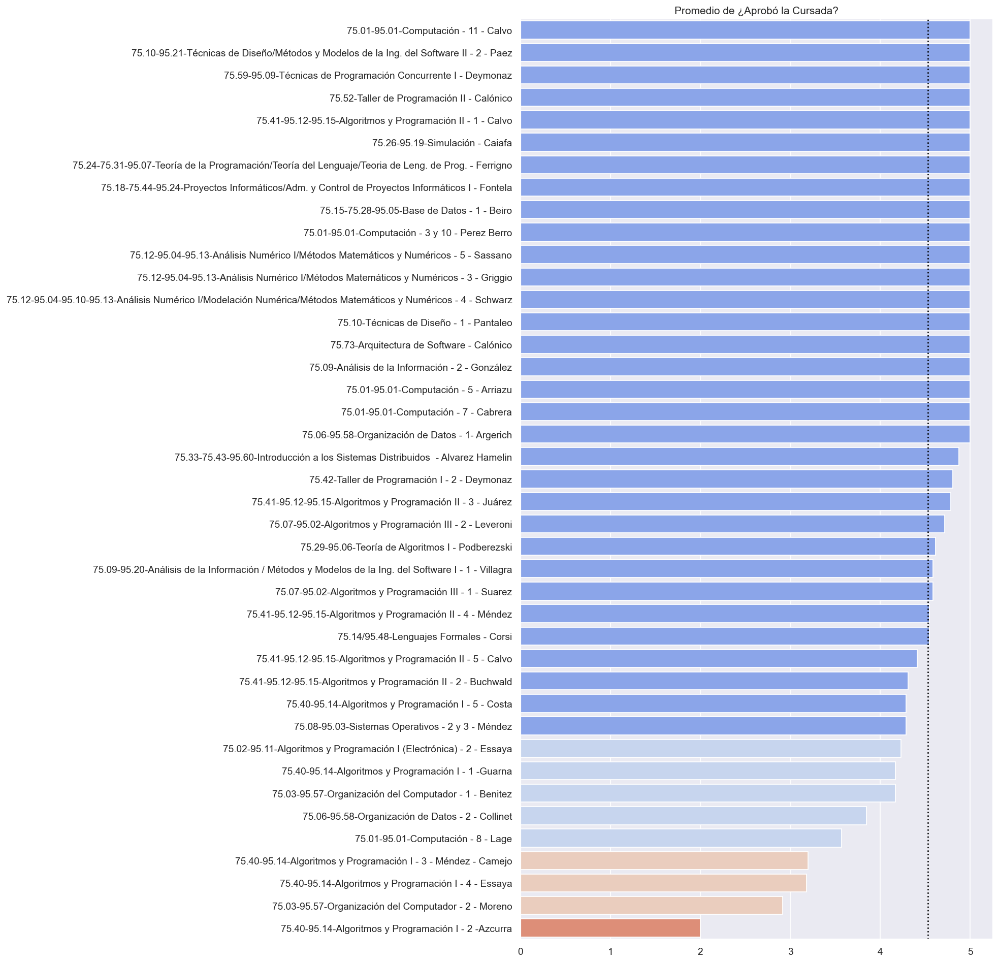

### ¿Cómo te Resultaron los Temas de la Materia?

Se analizan los promedios por curso de ¿Cómo te Resultaron los Temas de la Materia?. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

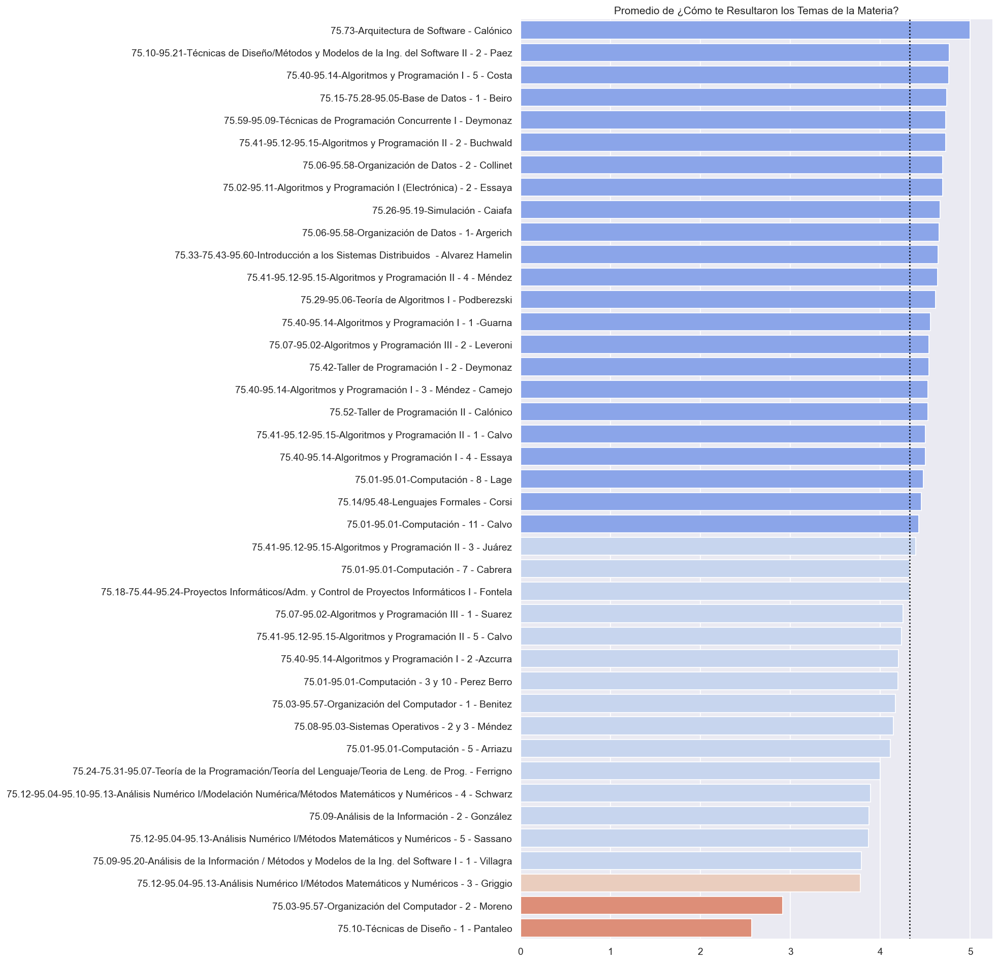

### ¿Los Temas de la Materia Están Actualizados?

Se analizan los promedios por curso de ¿Los Temas de la Materia Están Actualizados?. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

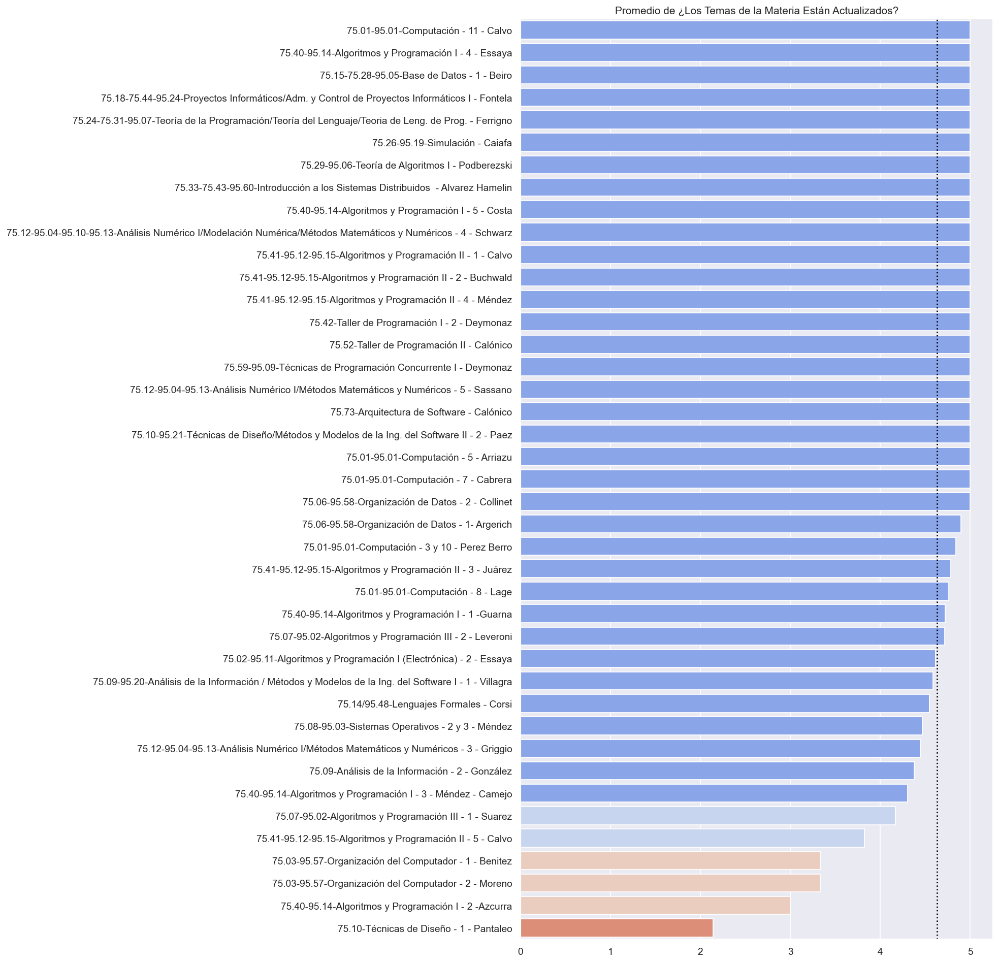

### Nivel de las Clases Teóricas del Curso

Se analizan los promedios por curso de Nivel de las Clases Teóricas del Curso. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

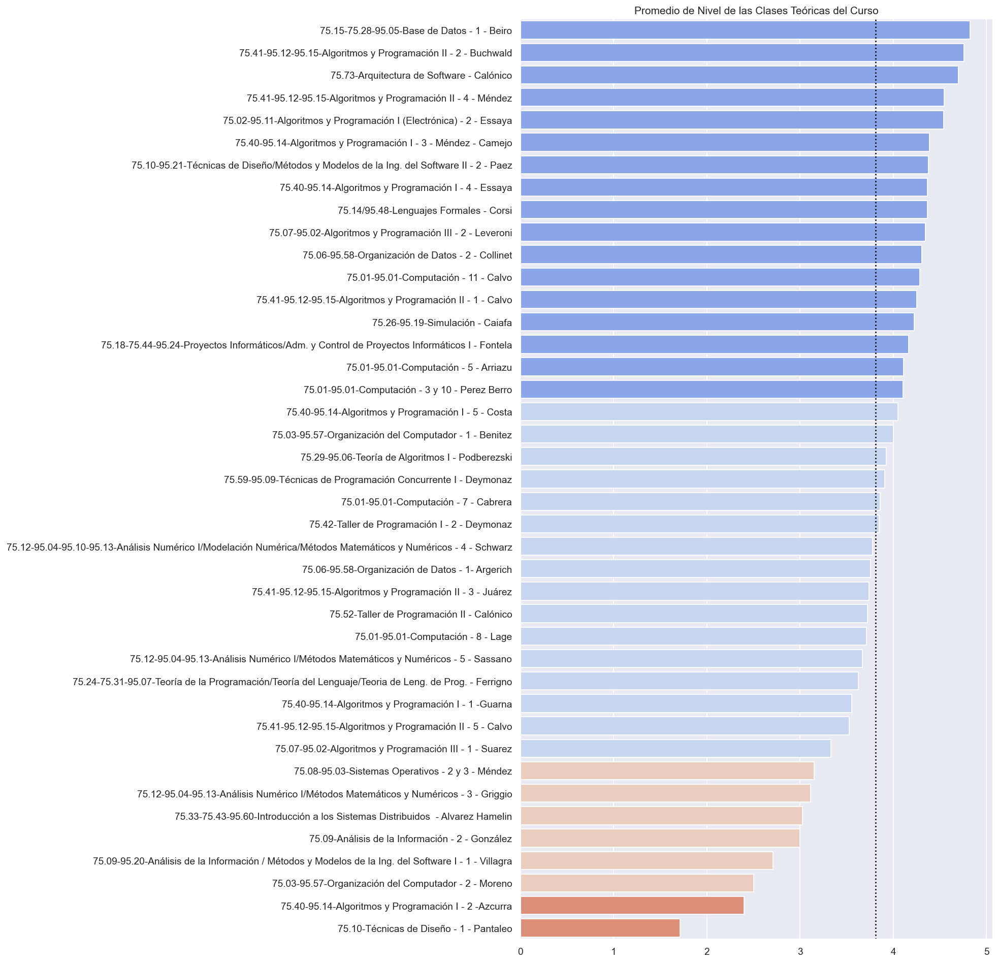

### Nivel de las Clases Prácticas del Curso

Se analizan los promedios por curso de Nivel de las Clases Prácticas del Curso. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

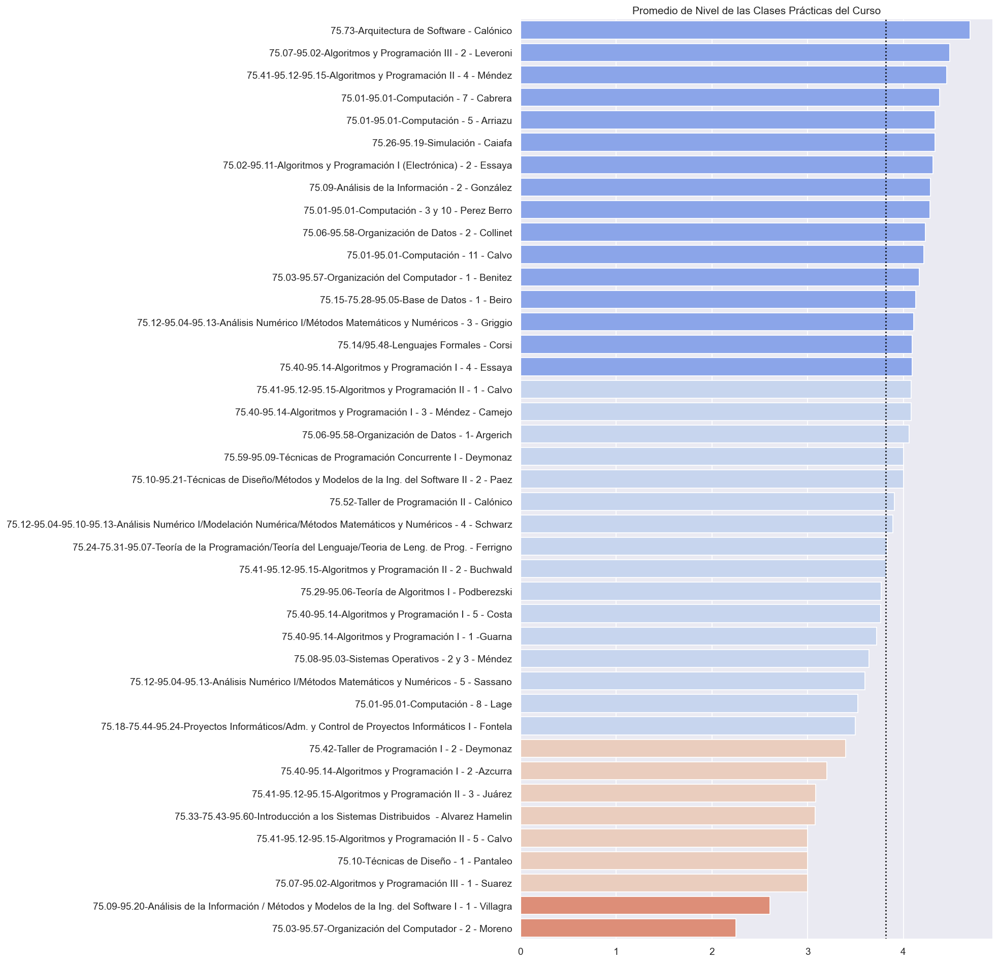

### Dificultad del Curso

Se analizan los promedios por curso de Dificultad del Curso. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

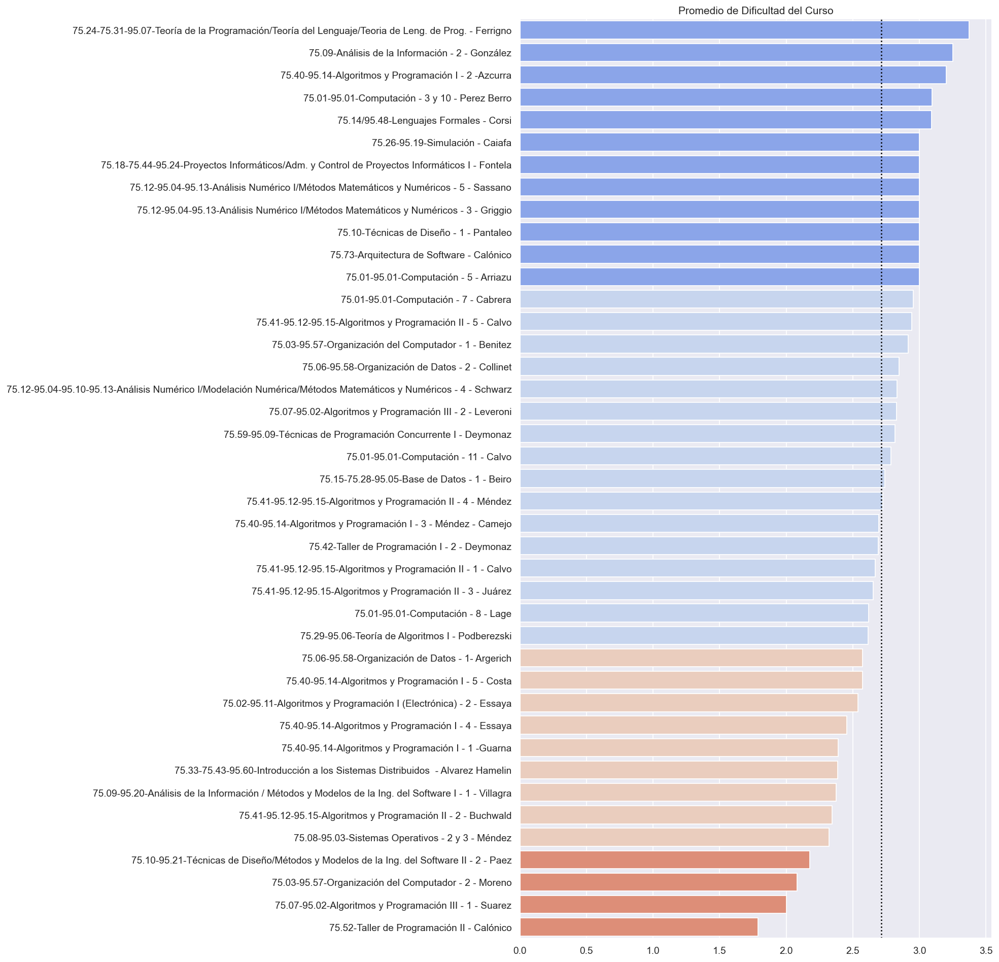

### Dificultad del TP

Se analizan los promedios por curso de Dificultad del TP. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

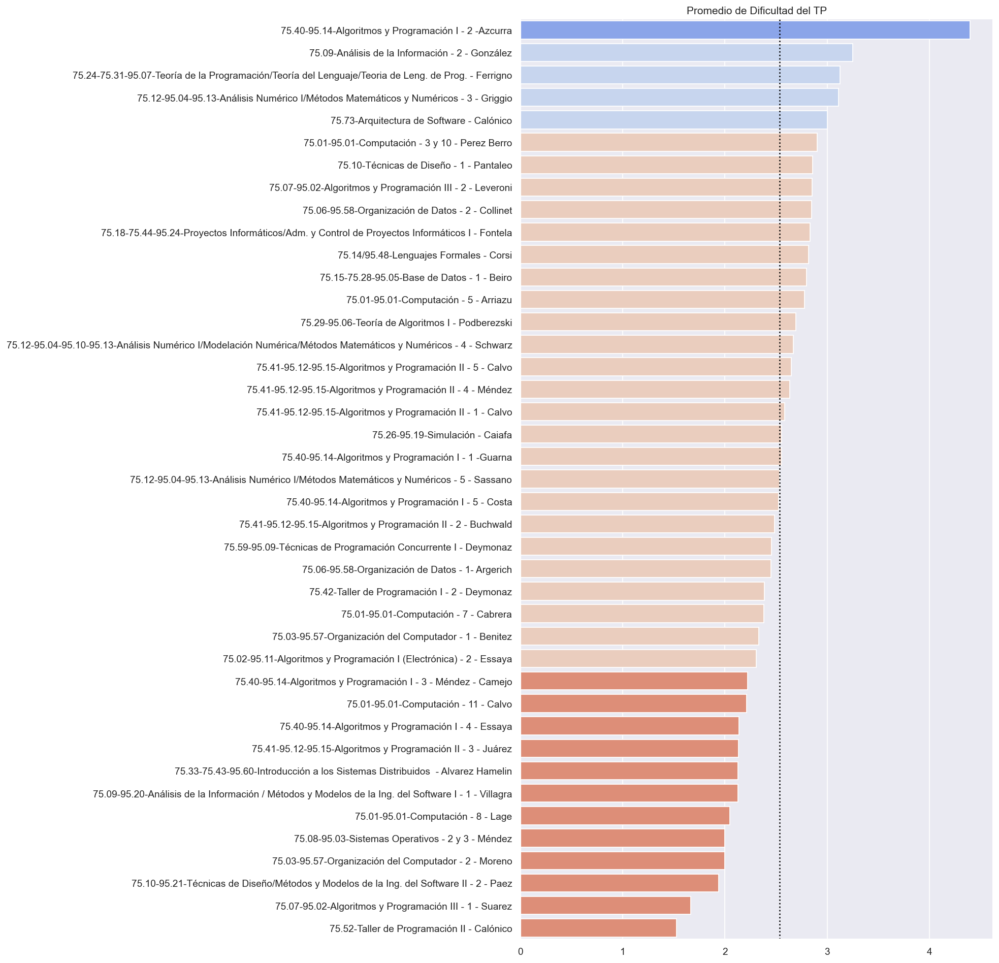

### Promedio nivel teóricas y prácticas

Se analizan los promedios por curso de Promedio nivel teóricas y prácticas. Se dividen en 4 contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores.

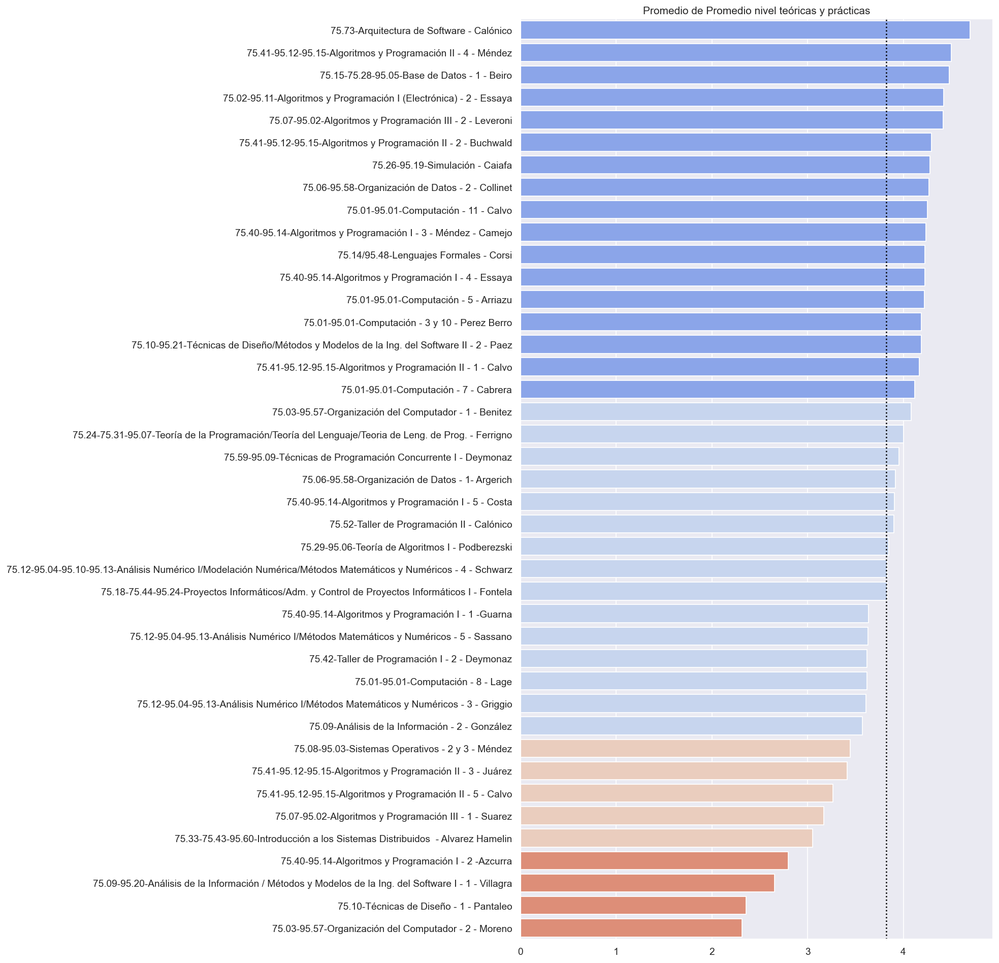

In [15]:
n_bins = 4

for col in num_cols:
    
    display(Markdown(f"### {col}"))
    display(Markdown(f"Se analizan los promedios por curso de {col}. Se dividen en {n_bins} contenedores entre los valores mínimo y máximo. La línea vertical en negro indica el promedio de los valores."))
    
    values = comp_5p_mean[col].sort_values(ascending=False)

    c = pd.cut(
        values,
        bins=n_bins,
        labels=sns.color_palette('coolwarm_r', n_colors=n_bins),
    )

    plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))
    ax = sns.barplot(x=values.values, y=values.index, palette=c.values)
    #ax = values.plot(kind='barh', color=c.values)

    ax.axvline(values.mean(), linestyle=":", color='black')

    plt.title(f"Promedio de {col}")
    plt.ylabel("")
    plt.show()

## Correlacion Entre Variables

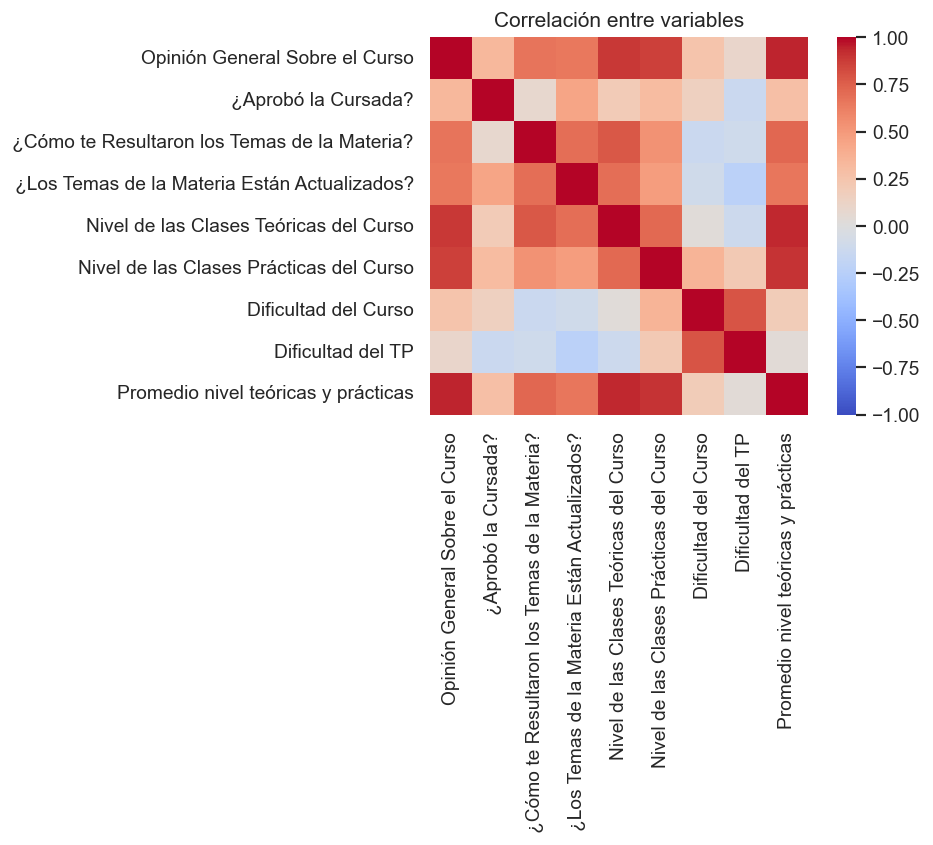

In [16]:
plt.figure(dpi=125)
sns.heatmap(comp_5p_mean[num_cols].corr(), square=True, vmin=-1, vmax=1, cmap='coolwarm')
plt.title("Correlación entre variables")
plt.show()

## Diferencia Entre Nivel de Clases Teóricas y Prácticas
- Hacia la derecha: Las clases teóricas son mejores que las prácticas.  
- En el centro: Poca o Ninguna diferencia.  
- Hacia la izquierda: Las clases prácticas son mejores que las teóricas.  

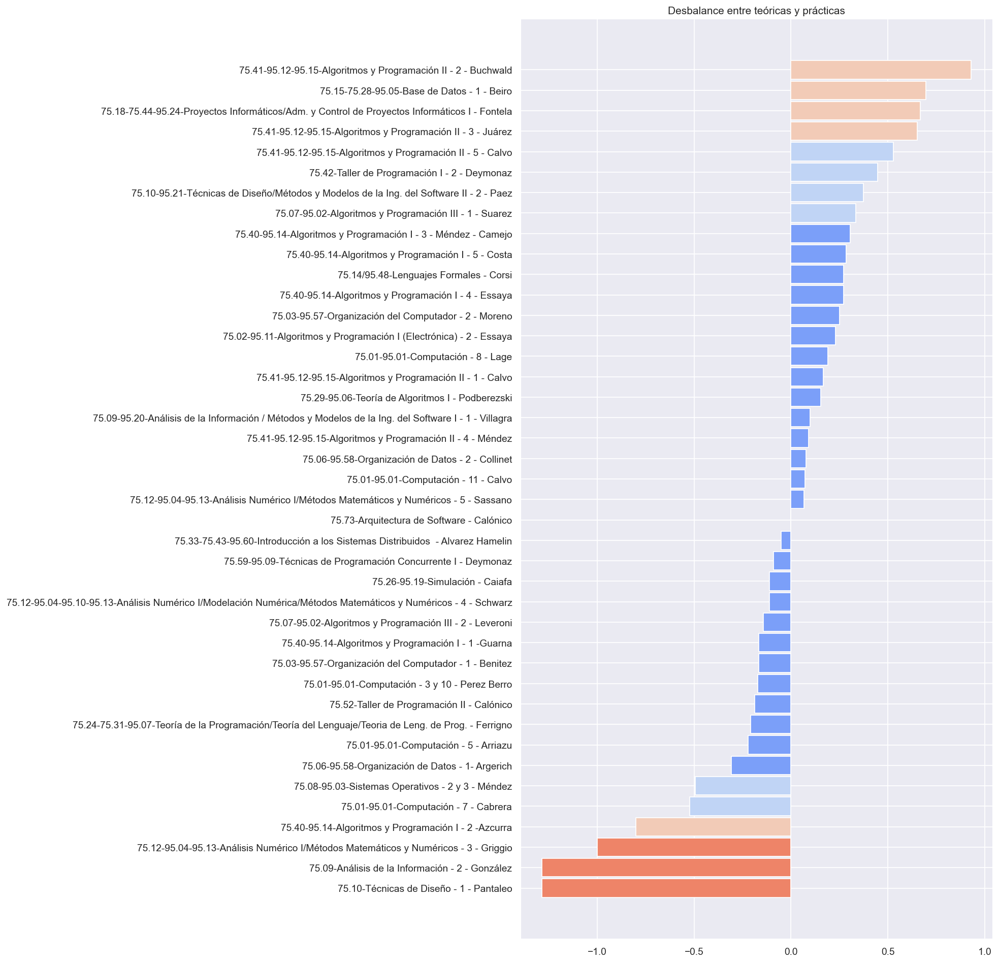

In [17]:
diff_teo_prac = (comp_5p_mean['Nivel de las Clases Teóricas del Curso'] - comp_5p_mean['Nivel de las Clases Prácticas del Curso']).sort_values()

plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

c = pd.cut(
    diff_teo_prac.abs(),
    bins=4,
    labels=sns.color_palette('coolwarm', n_colors=4),
)

plt.barh(diff_teo_prac.index, diff_teo_prac.values, color=c, height=0.9)

plt.title("Desbalance entre teóricas y prácticas")
plt.ylabel("")
plt.xlabel("")

plt.show()

## Emails

¿Cuánta gente completa el mail?

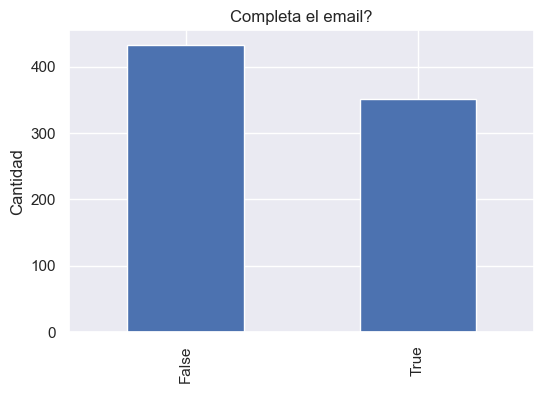

In [18]:
plt.figure(dpi=100)
(~comp['Email (opcional)'].isna()).value_counts().plot(kind='bar')
plt.title("Completa el email?")
plt.ylabel("Cantidad")
plt.show()

¿Hay emails duplicados?

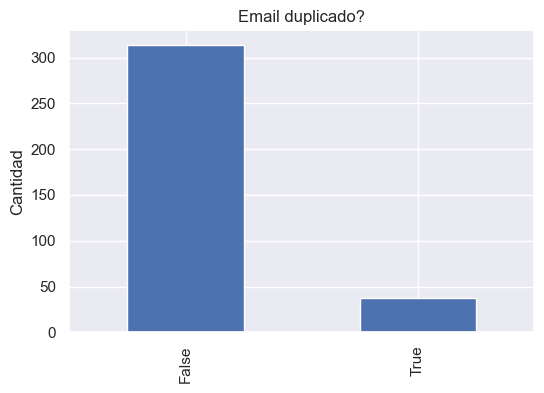

In [19]:
plt.figure(dpi=100)
comp['Email (opcional)'].dropna().duplicated().value_counts().plot(kind='bar')
plt.title("Email duplicado?")
plt.ylabel("Cantidad")
plt.show()

Quienes completaron el mail, ¿Permiten que se comparta al docente?

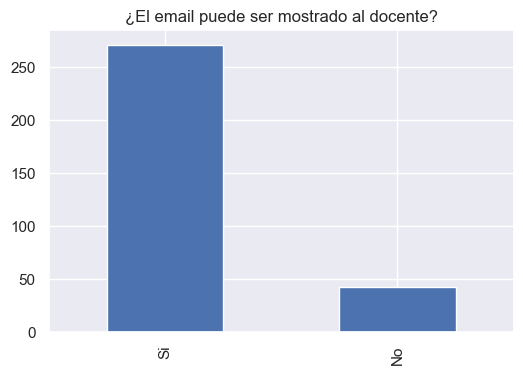

In [20]:
plt.figure(dpi=100)
comp[~comp['Email (opcional)'].isna()].drop_duplicates(subset=['Email (opcional)'])['¿El email puede ser mostrado al docente?'].value_counts().plot(kind='bar')
plt.title("¿El email puede ser mostrado al docente?")
plt.show()

# Comentarios por Curso

In [21]:
def procesar_comentario(c):
    lineas = c.split("\n")
    return "\n".join([f"{l}" for l in lineas])

for curso in comp['Elige el curso'].unique():
    display(Markdown(f"## Curso {curso}"))
    com = comp[comp['Elige el curso'] == curso]['¿Tenés algún otro comentario o sugerencia sobre el curso y la cursada virtual de este cuatrimestre?'].dropna()
    if com.empty:
        display(Markdown("_No hay comentarios_"))
    else:
        todos_los_comentarios = com.values.tolist()
        for comentario in todos_los_comentarios:
            if comentario == "":
                continue
            display(Markdown(f"- {procesar_comentario(comentario)}\n\n"))

## Curso 75.29-95.06-Teoría de Algoritmos I - Podberezski

- Las playlists de vídeos teóricos para cada semana me parecieron demasiado extensas, muchas veces no pude ver todos los vídeos o debí mirarlos a las apuradas. Como comente antes la defensa del tp me pareció demasiado complicada para lo que esperaba, creo que podría bajarse un poco la dificultad considerando que el alumno ya realizo los tps.



- No puedo comentar mucho de las clases sincrónicas ya que no fui a casi ninguna. Pero los videos están dentro de todo bien, un poco largos en algunas partes y algunos un poco densos. Estaría bueno tener algunos un poco mas orientados a la practica, algunas resoluciones de ejercicios en video para comprender como encararlos en algunos casos y que se espera de una resolución.



- sin discreta como correlativa, se lleno demasiado de gente. necesitan mas profesores/ayudantes. O limitar la participacion.. capaz si hicieran alguna metodologia mas facil para evaluar o tps mas cortos, etc se vuelva mas viable.



- Creo que la virtualidad es un buen punto para esta materia, ademas de que es una materia optativa que se puede realizar sin muchas correlativas y muchos estudiantes la quieren hacer, pero choca con los horarios de otras materias y en la cátedra son conscientes, por lo que graban las clases y es un beneficio.
Si me gustaría que se revean los videos teóricos que se dan, ya que son demasiados por semana, se pierde el foco por donde hay que entender un tema y como preparar un ejercicio de cierto tema para el final.



- Consideren mantenerse virtual. Este cuatri tuvieron mas de 100 alumnos inscriptos, cosa que seria imposible en manera presencial. Para mi estan a la altura de manejar esa cantidad de alumnos y esta bueno que todo ese alumnado tenga la posibilidad de cursar esta materia que la verdad esta buena.



- No



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 5 - Calvo

- Si van a dar una cursada virtual, MÍNIMAMENTE, intenten abrir los condicionales y no trabar siempre cuando uno se quiere cambiar, rechazar un pedido a 3 cursos y dejarme en un curso al cual no podía asistir por superposición horaria, es ridículo, como siempre esta facultad y más específicamente, este departamento de cuarta, siendo la misma porquería todos los años, con gusto me quiero ir a otra universidad donde no esté lleno de gente estúpida 



- El tiempo de respuesta a los mensajes propios a la profesora 



- Mucho material accesible.Muchotiempo par aconsultas. Muy recomendables



- Muy buen equipo docente



- Todo muy bueno. 



- Me senti muy a gusto de cursarla virtual, espero que se pueda seguir asi ya que ahorro tiempo de viaje.



- los docentes de teoria y practica saben mucho. muy buena disposicion 



- no



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 3 - Juárez

- Que usen discord y estén mucho más pendientes de las preguntas de Slack, sino se hace MUY difícil. Establezcan un criterio para promocionar. En la primer clase el profesor dice que se promocionaba con el 90% de todos los puntos y ahora dice que solo el top 5. Esto no puede pasar o 90% o top 5, no hay que desdecirse. 



- me gustaria modalidad presencial y virtual



- buen curso



- Las clases las siento comodas pero incompletas, sobretodo a medida que avanza la cursada. creo que deberian darle mucho mas enfasis a cosas importantes que se evaluan en los tps. Hubo muchas clases de una ayudante que no nombrare que nos resultaron muy confusas e incompletas para la mayoria. Tampoco estoy de acuerdo con la forma de corregir de ciertos docentes. Como una critica realmente constructiva pienso que una guia de ejercicios un poco mas acorde a los trabajos practicos y temas de la cursada serian de muchisima ayuda, incluso el RPL me parece una herramienta muy util para ir incorporando los conceptos de a poco y practicando. Senti que llegaba muy "vacio" a los tps.



- Que hayan clases presenciales.



- Hubo un par de clases de algunos ayudantes que no estuvieron muy claras, como si no hubiesen sido preparadas de antemano, entiendo que son ayudantes y lo hacen de buena voluntad y aprecio el esfuerzo que hacen, pero es dificil despues tener que entender el tema de dichas explicaciones haciendo que opte por buscar el tema en internet directamente, (se que no es raro buscar cosas en internet en el ambito de la programacion pero no creo que sea el enfoque que se busque en la catedra al menos para las clases).



- Cursada virtual deberia aplicarse para siempre, ya que los meritos son muchisimo mas que los demeritos. 



- .



- Excelente curso, muy buenos profesores, responden rapido y muy claro la explicación. Destaco a Frank Patiño, excelente profesor, siempre contestando dudas en cualquier momento y se tomaba el tiempo de analizar profundamente el problema.



- .



## Curso 75.42-Taller de Programación I - 2 - Deymonaz

- Excelente, una sola critica,
Me parece que hubo problemas de comunicacion.
eg. en las primeras semanas advertimos que fallaba el pipeline en github porque le faltaba un paquete. Nuestro corrector dijo que iba a preguntar y eso fue lo ultimo que supimos del tema. Nunca se arreglo.



- Quizas podría plantearse la posibilidad de algún tp individual cortito antes del tp grupal, o pedir la entrega de algunos de los problemas de la guía, esto a fin de que cuando comience el tp grupal todos los integrantes tengan mas o menos el mismo conocimiento del lenguaje, paso que mientras algunos habíamos hecho toda la guía y practicado, otros no habían tocado aun el lenguaje por lo que el comienzo del tp se hizo mas cuesta arriba.



- Para este curso en particular, seria bueno que los ayudantes tuvieran mejor formación de los contenidos de la materia, para poder ayudar a los grupos con mejor efectividad



- Que se enseñen/utilicen otras herramientas para la parte de la interfaz gráfica que las que se usaron. Que se le dedique un poco más de tiempo a algunos temas en particular, como threads o sockets.



- .



- Me pareció una cursada mucho más adaptada a un taller considerando las alternativas disponibles. La virtualidad no generó problemas y más allá de la modalidad, el ritmo de cursada me pareció menos hostil, sin dejar de ser exigente: Me resultó sencillo incorporar a la rutina el trabajo en las guías prácticas. Además éstas fueron útiles para el TP (tanto para entrar en calor con el lenguaje como para utilizar código hecho en ellas directamente).



- No más que lo que señale en el punto anterior, muchos temas muy interesantes y bien explicados, pero faltan más ejemplos e implementaciones, sobre todo porque Rust es un lenguaje dificil al principio y que hay POCA información en internet (incluso en la documentación oficial!). Salvo por eso, excelente.



- Lo que no me gusto en particular es que nos dijeron, o nos dieron a entender, que una vez aprobado el TP en diciembre tras la presentación final ya era suficiente. De hecho en la presentación del TP nos felicitaron por haber terminado el TP.  Sin embargo el 31 de diciembre nos mandan un mail general al curso  pidiendo nuevas cosas para el TP a presentar en fecha de final. No me pareció correcto ni la forma. Hay cuestiones que por tema de organización se avisan antes. Tampoco felicitas antes si en realidad no es el final del TP y hay que seguir trabajando. Sentí que un poco nos mandaron mas cosas de prepo cuando todos asumimos que ya estaba finalizado.



- La materia, a grandes rasgos, me parecio bien dada, mas que nada por las clases de Lafroce y Kelman. Los ejercicios para practicar lo que ibamos viendo en las primeras semanas me parecieron interesantes y una buena forma de progresar mientras uno va consultando a los profesores (un detalle para aclarar, es que la mayoria de aclaraciones de los ejercicios, eran principalmente realizadas por Lafroce y Di Pietro, de los demas, con los demas no habia mucha comunicación). El trabajo práctico fue un tema aparte, cuando se inicio con el mismo, dejamos de tener una comunicación general y paso a ser algo mas relacionado a las consultas que teniamos con nuestros profesores a cargo. En el momento de evaluación de acompañamiento del TP fue bastante regular, el profesor nos iba diciendo que es con lo que tendriamos que seguir en cada semana, pero poco mas, nunca tuvimos un análisis ni devolución del código que estuvimos escribiendo, ni cuando llego la exposición del TP.



- El MLI lo hizo de nuevo: creo un curso paralelo para que la gente pase Taller sin aprender nada.

Si bien esto es verdad, tambien es verdad que el curso viejo es un desproposito. Pero no vengo a hablar mal de Veiga, vengo a decirte la verdad de la milanesa del curso de Deimonazz. Esta supuesta super materia del nuevo siglo.

Los ayudantes no saben los temas, cada vez que preguntas nadie contesta, Bono no responde (de este tipo vamos a hablar en un rato), Deimonazz fuera de la clase no responde NI UNA pregunta, los pobes colaboradores hacen menos que Bono. Ahora bien, te preguntaras quienes laburan en taller? Bueno, Uri y Lafroce. Uri se encarga del todo tema administrativo y planificacion de la materia, mientras que Barba mantiene TODO lo relacionado a temas de la materia, es el unico que responde temas, es el unico que siempre esta atento, es el unico que sabe los temas de la materia, y es el unico que da clases que sirven realmente. Y lo peor es que es ninguneado, Deimonazz cada tanto pasa a lamerle las botas a sus otros ayudantes como Bono, diciendo “estan en grandes manos” (spoiler, no, son las manos de un distendido). Bono incluso da clases con material de Barba haciendo la clase pobre porque intenta leer lo que hizo Barba el cuatri pasado, Pablo pierde tiempo de la materia explicando cosas que no vienen a cuento de la materia (ejemplo, dar una introduccion de Redes completamente innecesaria para lo que es la materia).

Ahora, volviendo con Bono, que palabras del MLI es “calidad para no tener quintas, el experto de la UTN, un profesional” este tipo no sabe NADA del temario, NADA. Sabra programar en Rust para los proyectos de Carrone (no nos mintamos, esta aca por eso), pero no sabe nada de UX, concurrencia, ni nada. Toda duda que le hagas del TP no te la responde, a lo sumo vendra a la proxima planning dandote un consejo super genérico cuando Barba ya te respondió hace 4 días. 

Finalmente cuando presentas el TP, pasa lo siguiente, entra gente que no es de Fiuba a la meet PRIVADA, no se presentan, estan con camara apagada algunos y te empiezan a preguntar cosas como si tuvieran el poder de ponerte nota. Yo asumo que son Carrone (efectivamente porque podes ver su nombre) y el otro chico es otro empleado suyo. Despues los mismos docentes no dicen nada durante la presentacion, asumo que ni le dan importancia, estaran en otra cosa.

Mas alla de esto no se… hay un final completamente al pedo (igual que en el otro curso) pero de “desarrollo web”… esta materia es de hacer un proyecto, o es de creerte que sos un ingeniero de software haciendo una ABM web en Rust? Ah y el final son los miercoles (horario fuera de la materia dado que son los lunes), ah pero como es el curso del MLI no pasa nada.



- No



- La instancia de final es rara en el sentido en que la cursada fue una entrega constante sobre un tema que al final se expone, y el final fue un agregado con un tema en específico que sumaba a lo anterior hecho. Estaria bueno la posibilidad de promoción ya que el trabajo practico lo amerita.



- Creo que el trabajo práctico es muy grande y siendo rust un lenguaje con el que la mayoría no está familiarizado hubiera estado bueno tener más ejemplos prácticos que nos sirvan de guía para el TP.



## Curso 75.40-95.14-Algoritmos y Programación I - 4 - Essaya

- La unica crítica que se podria hacer es en el tiempo de corrección de ciertos trabajos prácticos, los cuales se extendian y a veces complicaba los plazos de entrega (aunque hay q valorar que los profesores se daban cuenta de esto y te daban tiempo extra)



- Considero que las materias relacionadas a computacion deberían seguir siendo cursadas/evaluadas virtualmente



- Aunque la catedra se haya adaptado muy bien a la virtualidad, no me gustaria q la cursada se mantenga de esta forma. 



- Las clases practicas se hacian muy pesadas. Por mas que el profesor intente interactuar y sea dinamico se hace muy dificl seguir a alguien escribir codigo durante dos horas. Y mas siendo virtualmente que te distraes muy facilmente.



- estaria bueno que los que saben se cayen un poco por que para los que no sabemos es horrible dan todo por sabido, en la teorica estaria bueno que no valla a 100 estaria bueno que vaya a 80, asi lo que no sabemos nada, podemos comprender mejor 



- Sobre este cuatrimestre lo único que destaco de forma negativa es el tiempo de la corrección de los trabajos prácticos.



- Nada que agregar, fue un placer haber cursado la materia en esta catedra



- Creo que se tendria que considerar la posibilidad de dar esta materia de manera virtual o semivirtual. Por experiencia personal he aprendido bastante ahorrandome el tiempo de viaje e invirtiendo ese tiempo en estudiar. Por ejemplo en mi caso me ahorro 4 horas de viaje en ida y vuelta haciendo combinaciones.
No solo se ahorra el tiempo de viaje, sino que senti que era mucho mas didactico la manera de aprender. Los docentes nos subian tambien las clases teoricas entonces nosotros contabamos con la posibilidad de ir nuevamente para atras o para delante, segun los tiempos de aprendizaje de cada alumno, y eso me parece perfecto.
A eso sumarle que con los profesores nos conectabamos por Discord para atender consultas, y en particular en Essaya absolutamente todos los docentes se pusieron la 10 respondiendo las preguntas lo mas rapido posible.
El unico punto negativo y muy importante que veo que sea de manera virtual es que perdemos la posibilidad de sociabilizarnos y encontrar cierto "compañerismo" con otros alumnos. La posibilidad de interactuar tambien con los docentes de una manera mas dinamica.



- No



## Curso 75.40-95.14-Algoritmos y Programación I - 3 - Méndez - Camejo

- Que sea virtual!



- No



- Lo que me gustaría que para los que disponemos de poco tiempo, que se siga haciendo una cursada 100% virtual, ya que me facilitaría muchisimo



- Excelente, desde el profesor hasta todos los colaboradores, realizaron un excelente trabajo. Corso Camejo altamente recomendado.



- Me gusto mucho el curso y como se organizaron y manejaron en la cátedra. Sin dudas lo volvería a elegir!



- Fue una excelente experiencia poder cursar con el profesor camejo y los correctores de la cátedra. Me hubiera gustado tener la materia de manera presencial ya que en mi casa me distraigo demasiado fácil, y hubiera conocido a más pares q cursaban conmigo. La presencialidad  no lo cambio por nada.



- En temas difíciles, ver más ejemplos



- Me gustaría que los colaboradores tengan un criterio un poco más uniforme de corrección, solo eso. Por todo lo demás, el curso me pareció excelente.



- Fue muy agradable contar con el acompañamiento de los miembros de la cátedra durante toda la cursada: a cada alumno para cada trabajo practico se nos asignó un corrector que además de contestar dudas específicas, sumó confianza para hacer preguntas y participar en las clases.



- Ningún comentario



- Me gustaría volver a la presencialidad porque me facilita mantenerme enfocado en la clase, pero sería bueno rescatar la evaluación a través de una computadora. No sé si se podría hacer presencialmente, si es que la facultad dispone de suficientes dispositivos.



- no tuve ninguna mala experiencia, ni se me ocurre nada en este momento



- --> PROS: toman muchisima cantidad de condicionales, lo que es muy bueno para que nadie se quede sin cursar, ya que hay otras catedras que no los aceptan y si no fuera por esto no podrian cursar. Los ayudantes son todos copados y en las clases hay mucha buena onda. No son clases aburridas, lo que hace que no te disperses y puedas seguirla bastante bien. En general, con la clase te llevas los temas entendidos. Tiene un horario muy temprano y la verdad no se nota, siempre le ponen humor. Responden bastante rapido por slack, sobre todo la semana de la entrega, por lo que podes resolver tus dudas en poco tiempo sin quedarte trabado. Suben los videos de las clases para que los puedan volver a ver en YT, lo que es muy util. Tienen una plataforma para subir lo tps y los examenes (Chanutron patente pendiente) que es muy practica y una pagina donde suben los apuntes, calendario, parciales y finales ya tomados. El tp fue un juego, que fue bastante divertido de programar y te hace entusiasmar para que te den ganas de hacerlo. Al finalizar la cursada, te consultan si queres ser colaborador y por lo que vi hubo muchas respuestas positivas, lo que demuestra la buena onda que tienen y cómo los alumnos se quieren involucrar más con la facultad a raíz de esto, incluso habiendo sido un cuatrimestre virtual.

--> CONTRAS: es muy desorganizada. Te dan un mes antes los enunciados de los tps (salvo el 3ro que fueron 2 semanas), pero no lo implementan en ese momento ni hacen las pruebas. Lo implementan un par de dias antes del limite y por eso en casi todas las entregas hubo que realizar modificaciones de ultimo momento. Siempre lo tomaron en cuenta y dieron 2 o 3 dias extras, pero habiendo dado 1 mes antes el enunciado, no me parece bien que te hagan cambiar cosas inesperadamente y tengas que correr con la entrega al final, en el tp3 no hubo pruebas siquiera. Tampoco me gusto que hayan quedado temas sin ver bajo la excusa de <<ya no se usa>>, pero no fueran reemplazados por otro tema de la materia. El temario se termino de dar 3 semanas antes, con lo cual tenian tiempo de agregar cosas. Tampoco me gusto que den media hora de receso en todas las clases, pero cuando no se llegaba a terminar un ejercicio no lo siguieran la clase siguiente o acortaran su resolucion. Por ultimo, a modo personal, no me gusta que cuando preguntas algo te respondan <<confia que esto es asi>>. Esta respuesta estuvo bastante presente durante toda la cursada. Ya se que hay cosas que no sabemos, pero deberian adaptar la respuesta al nivel de la cursada. 



- No , la verdad disfrute la cursada, muy bueno lo de subir las clases a youtube , muy util, RPL tambien  muy bueno



- No



- No



- Tuve un problema critico en el TP2 en el que le preguntaba cosas a mi correctora y me contestaba dias despues, me decia cosas como "Estudiaste? ya tendrias que saber eso" "Ya te lo conteste antes", o me decia que haga cosas que ya le habia mandado antes. No pudo responder NINGUNA de las dudas que tenia, me senti ignorada y la verdad me dieron ganas de cambiarme de cátedra solo por esta correctora en particular. Tambien esta misma correctora dio 2 clases practicas en las cuales no se le entendia nada (entiendo el nerviosismo y que cada uno tiene una vida, pero no creo que tendrian que tomar la responsabilidad de corrector si no les es conveniente, ya que otros alumnos aprobaron porque sus dudas fueron contestadas mientras que yo tuve que quedarme en un pozo en el cual me sentia una inutil y hasta pense en recurrir a otros correctores para pedir ayuda pero no pude hacer nada) . El resto de cosas me parecen super destacables, las clases teoricas nunca fueron aburridas y las practicas, menos las dos que ya nombre tambien lo fueron.
A pesar de esto voy a anotarme otra vez a la misma cátedra con la eperanza de que esta correctora no me vuelva a tocar.



- Me gustaría que tengan en cuenta la posibilidad de enseñar otro lenguaje y no estancarse con C.



- Que se de la posibilidad de hacer consultas presenciales, ya que a veces no queda de todo claro cuando te escriben por mail o chat. 



- -



- quiero cursadas virtuales siempre, pero abandone la materia por que no me gustaba la manera de enseñar de la cátedra. Y que no nos dejaba aplicar lo que sabiamos, todo era como ellos lo decían.



- Estuvo de 10, el mejor curso



## Curso 75.06-95.58-Organización de Datos - 1- Argerich

- Para mi, el curso podria estar un poco mas organizado, aunque no es tan terrible.
Lo que si me hubiera gustado muchisimo que Luis participe mas de las clases, principalmente porque el tipo sabe mucho y tiene muy buenos comentarios que aportan datos muuuy interesantes y divertidos que bajan a tierra lo que estamos viendo.
PD: Gian es un crack maaal



- Tal vez podrían tener mejor ordenadas las playlist de las teóricas en yt como para que uno pueda darse cuenta más fácil a que corresponden (me costó encontrar algunas clases, las pude ver porque iban pasandolas por slack) 



- La cursada fue muy buena, agradecer a los docentes y especialmente a Gian que parece que se puso el curso al hombro y contestó absolutamente todo. 
Un único comentario, hay algunos temas que las clases teóricas me parecieron un poco cortas y/o incompletas (Particularmente clustering, árboles y los videos de introducción a NLP). Esto lo puse solucionar viendo las clases de la otra cátedra, pero no quería dejar de mencionar que quizás esos videos se podrían rehacer. 



- Fue un cuatrimestre con muchos retos, hubiera deseado un pan dulce con su chocolate, pero bueno a Luis no le gusta :) jeje, pero excelente.Gracias



- Para mi esta materia tranquilamente podría ser virtual en el futuro. En ningún momento sentí que nos faltó algo. Fueros claves los canales de consultas en Slack.



- No, un excelente curso, los docentes son amigables y los temas interesantes.



- Tardaban mucho en subir las clases grabadas, en mi caso particular, cursaba dos materias en el mismo horario (ventajas de la virtualidad) y generalmente tenía que ver las clases grabadas. Cuando tardaban mucho en hacerlo, me atrasaba. 



- Me parece que algo muy bueno de la cursada virtual fue la predisposicion y herramientas adecuadas a la hora de responder consultas. Y destaco en este sentido la amabilidad y ayuda en cada momento de Gian. 



- No, el curso se adapto muy bien a la virtualidad, los contenidos me resultaron muy interesantes, los docentes muy predispuestos a responder consultas. Me resulto una gran cursada, logre aprender y disfrutar mucho la materia.



- Muy buen desarrollo en general de la cursada virtual



- Este cuatrimestre todos los tps fueron individuales, esto tiene sus pro y contras. Creo que un mix entre tps individuales y grupales (aunque sea 1) estaría muy bueno. Pero si, debo reconocer que con todos los tps individuales se aprende muchísimo más de que si fueran todos grupales.



- no



- Curse esta materia varias veces presencial y virtual. Creo que la metodología de este cuatrimestre fue la mejor y la que abarcó todos los temas perfectamente junto con los TPs. Como siempre las respuestas a las consultas de todos los profesores en cualquier dia y horario es algo muy destacable, aunque ahora con Slack noto que hay mas respuestas y debates de los temas que solo los post de Piazza.



- Aveces las clases teoricas se sentian un poco sobrecargadas cuando de repente veia una playlist de videos largos. Se hacia bastante pesada y costaba recordar todo lo que se vio. 

Entiendo que son temas con bastante probabilidad y algebra intermedio asi que por naturaleza es complicado pero me encontraba leyendo de blogs y libros para poder entender bien la logica/matematica y luego el video me servia como referencia hasta donde indagar.

Mas que eso la cursada estuvo bastante buena y me gusto mucho la predisposicion de ayudar por Slack siempre. 



- Si bien la materia es difícil lo malo es que los profesores en su GRAN mayoría no corrigen bien, penalizan demasiado por cosas que son correctas o en una mínima parte incorrecta. Muchas veces un docente toma algo por bien y otro por mal. Mismo en los enunciados de parcial a veces estaba MAL hecho el enunciado y ellos no aclaraban dudas ante esto. Al fin y al cabo el mejor profesor del curso que responde casi la totalidad de las consultas y el que mejor da las clases Gian, tengo entendido que no tiene cargo. Una pena.



- Es la primera cursada que conozco, en donde los docentes hicieron caso a las recomendaciones de los alumnos y, creo que mejoraron mucho respecto al cuatrimestre anterior, sentí que los temas se explicaron bien y en el tiempo necesario, reemplazar el parcial por tps fue un acierto, ya que se aprende mas haciendolos, que estudiando para un parcial, felicitaciones.



- Siento que la mitad del cuatrimestre estuvo en el freezer. Si bien es importantisimo saber pandas y spark, siento que dedicarle tanto tiempo a librerias y como programar (que con el primer tp ya se podia hacer problemas de estos dos temas y con los proximos tps ya por necesidad se tenian que terminar aprendiendo) hizo que queden cosas muy por arriba de machine learning en adelante y me hubiera gustado entender un poco mas en profundidad todo eso. Tampoco se si esto esta hecho a proposito porque proba no es obligatoria pero sinceramente siento que se pierde un toque el objetivo de la materia.



- Me parece que se desaprovecharon las clases sincrónicas en meet. Muchas veces se daban los mismos temas que en los videos teóricos, y antes de verlos nuevamente, prefería avanzar con mi tp. También me pasó que los profesores llegaban al meet con un colab con el código ya preparado y no lo explicaban en profundidad, entonces había extractos de código que yo no sabía qué hacían y me perdía.

Sacando esto, estoy muy satisfecha con el curso en general. Siento que aprendí un montón, por supuesto que de los temas de la materia, pero también sobre cómo estudiar sola y buscar información por mi cuenta.

Gracias a todos los profesores por su esfuerzo!



- Implementaron muchos cambios en la cursada y me gustó mucho. Me interesó mucho la materia y los trabajos fueron interesantisimos. Requerían trabajo y averiguar pero eso llevaba a meterse mucho más en tema. Agradecimiento particular para Gian que como corrector de tp estaba respondiendo y ayudando un montón siempre con mucha energía. En general en todos los profesores se vieron ganas, interés y conocimientos para la materia



- Para la cantidad de alumnos que tuvieron, pudieron llevar la cursada muy bien.



- sigan asi!



- Excelente el cambio que hicieron este cuatrimestre, me sentí acompañada en toda la cursada con los tps individuales y aprendí mucho



- Muy positivo el cambio que hicieron respecto a la forma que tenían de dar la materia. Los temas se disfrutan mucho más así y se aprende mas. Buena predisposición de los docentes para que todo se entienda bien



- Pienso que estuvieron muy buenos los temas, y la disposición de los ayudantes es máxima. No me gustó la segunda etapa de la cursada (la de machine learning), siento que hubo mucha diferencia entre lo que se muestra en las teóricas y de lo que de verdad se requería saber para hacer los trabajos prácticos. 



- La cursada fue excelente y fue un gusto cursarla.
Quiero remarcar que todo el grupo docente se comporto de la mejor manera brindando ayuda y siempre respondiendo con respeto. En especial agradezco a Natalia Golmar   y Gianmarco Cafferata por estar siempre pendientes de las consultas en el slack y tener la paciencia de ayudar a cada estudiante



- Excelente curso



- Los finales son un dolor de cabeza, a veces toman cosas difíciles de hacerlos 



## Curso 75.07-95.02-Algoritmos y Programación III - 2 - Leveroni

- Considero que lo que se hace en esta cátedra es demasiado bueno porque la forma de adaptación a la virtualidad fue explendida, en discord crearon bots super copados y siempre en cualquier horario y día había un docente para ayudar. En todo momento uno se sentía que había un respaldo.



- no



- No



- Hacen falta más cursos como este. Los docentes y ayudantes se toman muy en serio el trabajo y a la vez transmiten tanta comodidad y buen ambiente que te dan ganas de tener clases. Y, sobre todo, se aprende mucho y muy bien, cosa que es fundamental para el desarrollo profesional teniendo en cuenta que la materia es básicamente POO y TDD. 



- Yo quiero agradecerles a todos de una manera inmensa el trabajo que le ponen a la catedra para dar el nivel que dan. Gracias a los ayudantes que siempre están para las consultas, por correo y por discord. Se nota que les importa hacerle llegar la enseñanza a los alumnos y dan todo el recurso, material y humano, para poder hacerlo.



- Me encantó. Muy recomendado el curso



- La cátedra me pareció muy buena. Están super abiertos a consultas y tienen un nivel profesional muy alto. La recomiendo muchísimo.



-  por ahi dependes mucho del criterio de correción de cada profe, promocionar no es facil, la materia es muy demandante y no recomiendo cursarla con otra materia que tenga tps ya que se complica a la larga 



- Muy buena cátedra, sobrepasó mis expectativas!



- Estuvo muy buena la materia e hicieron todo lo posible y más por que entendamos y usemos todas las herramientas que nos brindaron para aprender. Es un curso muy recomendable, explicaciones claras y buena onda :) 



- -



- Es una excelente cátedra. Todos los docentes están muy preparados para dar la materia a nivel calidad de temas y pedagógicamente para explicarlos.



- Fue la mejor materia 



- Muy bueno el curso, me gusto bastante aunque de vez en cuando me costaba seguir alguna que otra clase, pero en general muy buena disposición de los profes y ayudantes. Buenísima la cátedra.



- En general excelente, se agarra gusto a la programación orientada a objetos gracias a la visión de la misma que adopta la cátedra para enseñar.
10/10 



- -



- Siglo XXI y seguimos usando Smalltalk??



## Curso 75.03-95.57-Organización del Computador - 1 - Benitez

- alguna clases teóricas, sobretodo las ultimas del cuatrimestre, eran un poco monótonas



- Debo recursar la materia y creo q estaría  muy bueno que se mantuviese la virtualidad.



- el curso parece estar desactualizado 



- Deberíamos aprender algo mas actualizado, tal vez programar usando lenguajes que se usan actualmente



- el formato remoto funciono muy bien para mi y no curse tantas materias pero de las que hice hasta ahora esta fue la mejor organizada con mucha diferencia. presentan un calendario que se cumple y los docentes lo adaptan a medida que van surgiendo cambios. los temas son muy interesantes aunque medio pesados pero los docentes le ponen onda para hacerlo llevadero. cuando pedi revision del parcial dario me explico mis errores y me sirvio mucho para poder aprobar en la siuiente oportunidad. el tema que mas me gusto fue arm, me gustaria que den mas cosas con formato taller. en la correcion de tp estuve nerviosa al principio pero ramiro que me corrigio se preocupo de que me quede tranquila. para el final carlos da consulta para despejar dudas.



- Usar otro sistema para hacer consultas más rápido/directo, como Slack 



## Curso 75.06-95.58-Organización de Datos - 2 - Collinet

- Buenisimos los kahoot ! Me parece que ayudan a reforzar y recordar los contenidos !



- Larga vida a la cursada virtual



- Quizás, mas ejemplo o modelos de parcial acorde a la modalidad que se esté rigiendo.



- Algo que tengo que destacar de esta cátedra (el cuatrimestre anterior curse con la otra), es que los contenidos están mejor diagramados y no son excesivos. 
Desde bien temprano en la materia se aborda el tema de modelos de machine learning que es fundamental para el trabajo práctico final. Además los contenidos parecen adecuarse bien a lo que es la demanda del mercado actual



- la materia esta buena, los tps tambien, juan manuel es el unico que resuelve las dudas de todos con buena predisposicion y en detalle. las clases no te preparan para los examenes, es mucha la separacion entre la teoria y la practica, estaria bueno que lo que tomaran en los examenes se asemejara mas a lo visto en clase. Estaria bueno que los examenes finales fueran escritos o q hubiera una instancia escrita para promocionar y de ultima que despues hagan preguntas sobre lo que se rindió, y no sobre cosas al azar, la mayoria de los q se presentaron incluso aunque aprobaron la pasaron bastante mal, hay una rigurosidad excesiva y el trato con los alumnos no es tan empatico.



- Tendrían que ser dos parciales y tomar 4 parcialitos como hacen (o hacian) en algoritmos 1 y 2 en las catedras que eran de Rosita.



## Curso 75.08-95.03-Sistemas Operativos - 2 y 3 - Méndez

- Terminó la cursada hace una semana y todavía no tengo idea de si aprobe algun parcialito o no, lo mismo con los trabajos prácticos. Creo que sabían que este cuatrimestre iban a tener muchos mas alumnos inscriptos y aún así decidieron agregar parciales, algo que antes no tenía la cursada, y ya así se atrasaban con las correcciones... Creo que no fue lo mejor. 

Además no estoy conforme con la modalidad de promoción que tiene, ya que no solo los trabajos prácticos fueron de suma dificultad, para promocionar tenes que realizar 3 desafíos que son aparte, aprobar todo con promedio arriba de 8, lo mismo con los parciales y no ir a recu con ninguno.  Entiendo que la promoción no debería ser para cualquiera, pero... no se como me fue en los parciales, por lo que no hice ningún desafío por miedo de perder tiempo con eso y no darle ese tiempo a otras materias... y en el caso de tener las condiciones de promoción en cuanto a las notas de parcialitos y tp's, cuando estas sean entregadas, ya no voy a poder hacer los desafíos requeridos. Creo que debería haber algún tipo de acuerdo ahí... 



- Aún no tenemos la mayoría de las notas, pero es más que entendible teniendo en cuenta que fuimos 160 alumnos y no muchos docentes



- 1. No sé si aprobé la cursada, tuve 2 tp individuales + 4 tp grupales + 3 parciales y todavía no me llegó NI UNA nota (el primer tp individual lo hice hace 3 meses, una semana después del inicio de las clases). Así que como respuesta voy a poner un "no", porque no se el resultado.

2. Es imposible cursar una materia con tantos trabajos, parciales, y no tener nada de feedback. La cursada es muy densa y muy exigente para el alumno, y no es recíproco del lado de los docentes. 

3. Es inviable cursar 6 horas seguidas frente a un computador un viernes a la noche (17 a 23 horas).

4. Los docentes son buenos explicando, y entiendo que somos muchos alumnos, pero se tiene que hacer algo al respecto.



- Yo por mi parte no estoy de acuerdo con el método de examen para evaluar a los alumnos pero en este caso me parece que es hasta más absurdo todavía ya que los exámenes tiene ejercicios teórico prácticos que nunca se ven en la práctica ya que esas clases están destinadas a los tps. Otra razón por la cual no le veo sentido a los exámenes es que toman exactamente los mismos temas que los tps tendría más sentido agregarle preguntas teóricas a los tps (que ya las tienen).



- La sugerencia mas fuerte que haria es aumentar los tiempos de corrección, si bien entiendo que hay muchos alumnos y pocos docentes, ya finalizo la cursada hace casi una semana y solo tengo corregido 1 lab (de 2), el tp1 (de 4), y cero parcialitos (de 3). Creo fuertemente que habría que buscar la manera de mejorar esto porque muchos alumnos no sabremos si promocionamos hasta tener todas las notas y por lo tanto si empezar o no a preparar el final. Despues otra cosa que me hubiera gustado es mas ejercicios tipo parcial o final en cambio de tanto tiempo con consultas de la teoria.



- Entiendo las demoras en las correcciones por la cantidad de alumnos este cuatri pero no me parece aceptable pasar enero corrigiendo tps sin saber si promocionamos, aprobamos la cursada o tenemos que recuperar algún parcial. 



- Finalmente, el profesor (Méndez) dijo en una clase, entre risas, algo como que el cuatrimestre no termina en diciembre sino que para él termina en febrero, con los finales. Quizás no fue exactamente esa la frase, pero dio a entender eso. Me parece un comentario completamente inaceptable, ya que venimos cursando un montón de tiempo sin vacaciones, con cuatrimestres cortados por la mitad y trabajos para hacer en verano. Esta vez, la cursada termina en diciembre, NO en febrero. Pareciera que le resulta gracioso que los alumnos trabajen de más cuando deberían descansar o estar estudiando para los finales, exclusivamente. Y me parece peor aún que diga eso, cuando él no corrigió ni un solo parcialito hasta el día de la fecha. Además, nos dijeron que íbamos a recibir las correcciones a mediados de enero, lo que significa que probablemente haya que hacer correcciones a los trabajos fuera del período de cursada, cosa que también está mal.

En resumen, si surge otra cátedra de Sistemas Operativos, vayan a esa. Esta cátedra solo se sostiene por Juan Manuel y Patricio, que son los que dan la práctica. Para mejorarla, deberían agregar más ayudantes para equiparar la cantidad de alumnos, y/o bajar la cantidad de entregas y parcialitos a realizar en la cursada, además de corregir los errores del apunte teórico, si es posible.



- Faltarían docentes o ayudantes para poder corregir más rápido



- Si bien Mendez se va un poco por las ramas al explicar me parece muy bueno como profesor, los temas me quedaron claros y me super interesaron. Los chicos de la práctica también se nota que saben mucho y explican bien, pero me pasó que sentía que no había correlación entre la teórica y la práctica y me perdía dado que los trabajos prácticos no tienen que ver al 100% con lo que se da en la teórica. Los trabajos prácticos son tomados de afuera y se obliga a los estudiantes a hacerlos. Son muy dificiles de hacer y comprender, y al fin y al cabo no es algo propio ni que se pueda reutilizar. En cuanto a la cursada de este cuatrimestre. Fue muy complicada. Había tps individuales, parcialitos, y tps grupales. Demasiadas instancias de evaluación y todas eran de gran dificultad. Hay una instancia para promocionar pero me atrevo a decir que el 10% o menos de los estudiantes cumplen los requisitos. En mi caso no pude dedicarle tanto tiempo a la materia por más que fue la que más me gustó y más me interesó de las que cursé este cuatrimestre. También con tantas instancias evaluativas los docentes no llegan a tiempo a corregir. O deberían hacerlas un poco más asequibles o que sean menos. Literalmente todas las semanas había un parcial o la entrega de un trabajo. Y las otras materias cada tanto también se superponen con sus parciales o entregas.



- Excelente trabajo práctico, pero me dejó teniendo que buscar recursos por fuera de la cátedra constantemente. Estaría bueno que la página que explica los trabajos prácticos estuviera más detallada.



- Perfecta la virtualidad, en materias como estas me parece inclusó que sumó el hecho de que fuera virtual (toda la movida de compartir pantalla y ver codigo, etc)



- Si, el profesor decidio no dar clases teoricas en todo el cuatrimestre solo mando videos de la clase grabados en otros cuatris



- El régimen de promoción, bien implementado con todos los desafíos, parece bueno. Te motiva a sacar buenas notas y los desafíos te obligan a entender bien los temas, al no tener tests ni una guía especifica tenes que entender lo que estas haciendo. Comprendo los problemas de falta de profesores, pero teniendo en cuenta el cambio de las correlativas y la baja de la otra cátedra se tendría que haber previsto esto. 



- Sobre la cursada virtual creo que beneficia a ambas partes, tanto a los estudiantes para poder estar cómodos desde su casa, o también el beneficio de que las clases se graban y poder verlas después o volver a ver algo que no se entendió, sobre eso es algo a destacar.
Sobre los profesores son buena onda e incluso han hecho clases extra para resolver dudas de TPs o pre parcial.
Sobre los TPs y los parciales como ya comente creo que debería haber un cambio en cómo se dan o la cantidad que hay por grupo para que sea una mejor corrección. Si tendría que reentregar por alguna razón uno de los primeros TPs tendría que acordarme todo lo que hice hace meses y no está para nada bueno.



- Las clases teóricas mejoraron al ser asicronicas. Cuando eran sincrónicas se notaba cierta improvisación. 



- Muy buen curso



- Hoy 16 de Enero de 2022 seguimos sin tener las notas de ningún trabajo practico tanto individual como grupal, no tenemos las notas de los parcialitos no sabemos si tenemos que recuperar o no, que temas debemos recuperar, siendo la primera fecha de final/recuperatorio el 2 de febrero los profesores no responde por discord. Crero que por lo menos deberíamos tener la nota de algún parcialito ya que el primero fue tomado hace 4 meses. A eso sumado la complejidad de los ejercicios prácticos que se nos pueden tomar en el final no sabemos si la resolución de los ejercicios prácticos que adoptamos en los parciales es la correcta o no. No sabemos si hay promoción si todos vamos a ir a final porque no se como el profesor va a correguir todos los finales en 6 dias si hace cuatro meses nos debe la nota del primer parcialito, Igual creo que toda la culpa no es del profesor sino también de el cambioo del plan de estudios y que no se tuvo en cuenta la carga de alumnos que iba a recaer en las restantes materias.
Por otro lado la practica los tps muy largos el segundo de shell fue bastante complejo para hacerlo en forma individual las fechas limites eran de 15 dias y hoy 16 de enero 4 meses despues de terminar el primer trabajo parctico todavia no tenemos la nota de ningun tp la exigencia deberia ser reciproca muchas cosas de los tps no fueran explicadas a veces no se entendia nada en la practica muichas cosas en poco tiemp. Las respuestas a las dudas tardaban una semana a veces y hoy hay algunas dudas que si se fijan en el discord de la materia nunca fueron respondidas
Y por ultimo una crtitica constructiva el profesor Mendez creo q dicta 3 cursos algo 1 algo 2 y sistemas operativos por lo que lei en distintas redes sociales tiene la intención de dictar un curso de compiladores, debe tener fuertemente en cuenta la cantidad de alumnos la forma de promoción y de evalución y  devolución de las notas que recaerá sobre el y su equipo docente ya que se debería evitar extrapolar lo que esta sucediendo hoy en la materia Sistemas operativos a las nuevas materias. Además creo que en vez de agregar nuevas materias se deberían reforzar las que hoy tenemos con más docentes para tener alguna nota por lo menos. Gracias.  




- Tendrían que considerar ampliar al cuerpo docente o cambiar la forma de evaluación ya que demoraron mucho en darnos las notas de todo lo que hicimos a lo largo del cuatrimestre.



- La forma de evaluar es discutible aún teniendo +100 alumnos. 

En caso de mantener parcialitos, no dejaria que corriga todo Mariano ya que se demora bastante en corregir 3 * 100 parcialitos.

Con los TPs/Labs lo mismo. Es demasiada la demora para las correciones. Quizás deberian evaluar TPs de a más personas. Tengan en cuenta que se aprovechó el parate de "enero" para seguir corrigiendo. Esto en los 1C, con los finales en julio seria bastante dificil esperar las correcciones de todo.



- Los tiempos de respuesta fueron malísimos. Así como los de corrección. Entiendo que la materia recibió más alumnos de los que esperaba, pero esto es algo que de alguna manera debería preverse. Ya estamos pasando la tercera fecha de final y hay cursadas sin cerrar



- Mejorar sustancialmente la comunicación entre los docentes y el alumno, comunicar facilmente que nota se tiene y con cuanto se aprueba



- El problema principal fueron los parciales y el final. Preguntas ambiguas que con responder la pregunta no alcanzaba. Era necesario irse por las ramas e explicar mas halla de lo que se pedia. El curso en general me decepciono al estar mal pensado. Las clases practicas eran unicamente explicaciones sobre el tp, estaria bueno que tambien se vean ejercicios practicos sobre los parciales ya que es lo que usualmente se toma pero nunca se ve como realizarlos, mas alla de la teoria. Ojala puedan mejorarlo para el futuro ya que tiene mucho potencial la materia.



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 4 - Méndez

- No.



- No



- -



- No, es una excelente cátedra.



- Me parece que ayuda mucho a la seguridad más que nada. Que sea virtual permite que podamos seguir código y entender mejor. En vez de correr el riesgo de llevar la computadora a la cursada. Ayuda a tiempos de viaje y horarios de trabajo. Sinceramente la virtualidad en esos puntos personalmente me ayudo muchísimo.



- No, sigan asi.



## Curso 75.07-95.02-Algoritmos y Programación III - 1 - Suarez

- Las clases prácticas me parecieron muy poco entendibles. Al profesor Diego Sabchez no se entiende las ideas que quiere explicar, empieza una frase y antes de terminarla arranca con otra, es fácil perderse en la clase, muy poco claro, muchas vueltas para explicar temas sencillos. Se nota que sus clases no estab preparadas porque sale lo que sale, y hubo clases en las que no aparecio, y que solamente mandaba un mensaje al slack diciendo que veamos la clase grabada del cuatrimestre pasado. Además,  no se respeto en ningún momento el calendario,  la entrega de notas de TPs y parciales tardaron muchísimo. No sabías si podías hacer el segundo TP por no tenr la nota del primer tp, y además te exigen que respetes los tiempos de entrega cuando ellos no son capaces de comunicar las fechas de entrega de las correcciones.



- Son muchos los temas nuevos y no hay forma práctica de darlos para entenderlos, lleva tiempo entender conceptos nuevos y no están bien dados no hay ejemplos prácticos, se da mucha vuelta para explicar algo y no se termina entendiendo, los profesores saben pero no saben transmitir. Tendría que ser más práctico y colaborativo, enseñar bien los conceptos y practicarlos d una forma sencilla. Se tarda mucho tiempo en dar las notas de parciales y tp, hay un tp individual que si no lo aprobas no podés seguir la materia, no me parece justo si los temas no se dieron bien.



- Es una catedra mal organizada, no avisan las fechas hasta último momento, no contestan la mitad de las preguntas, y las evaluaciones son poco claras. Pareciera no haber comunicación entre los docentes. 



- Mejorar tiempo de respuesta, mejorar el trato, y que no sea promocionable totalmente injusto que alguien que tenga promedio 10 con lo dificil que es la cursada, no pueda promocionar



- Tendrían que tener mas ayudantes para mejorar el tiempo de respuesta a consultas



- Tardan demasiado en corregir



## Curso 75.15-75.28-95.05-Base de Datos - 1 - Beiro

- En general es muy buena cátedra, no encuentro muchas cosas que esté desconforme



- Una de las materias que más disfruté cursar. Ojalá FIUBA tuviera más cursos como este.



- Súper útiles los parcialitos, me obligaron a llevar la materia al día



- No



- Excelente, mucha dedicación por parte de los docentes y se nota! De las pocas materias que se nota que le ponen ganas y quieren que los alumnos aprendan



- Excelente curso



- Felicitarlos y agradecerles por el modo en el que brindan las clases, los materiales y las herramientas. Estuvo muy bueno y aprendí un montón, 
Saludos y gracias!



- Debería formar parte de la oferta virtual, es la única manera que puedo cursar.



- Sin comentarios extras.



- Me gusto mucho la modalidad de los parcialitos, te dan una idea de lo que te toman y te preparan bien para el parcial.



## Curso 75.52-Taller de Programación II - Calónico

- El trabajo práctico es muy largo para la materia. Pienso que si compartiesen cuánto tiempo esperan que los alumnos dediquen al mismo y escuchasen las horas que los alumnos dedican, se darían cuenta de que el costo del mismo es sumamente alto. Por otro lado, temas interesantes, tecnologías interesantes y actuales. Muy buena disposición de parte de los docentes durante toda la cursada. Con respecto a los puntajes dados en dificultad del trabajo práctico, como de la materia, me base en la cantidad de tareas y horas requeridas, no así por la complejidad del mismo.



- Excelente la predisposición de los profesores durante las instancias de consulta y evaluación del TP. Durante las clases lograron transmitir el conocimiento en cada uno de los temas dados 



- Excelente la predisposición de los profesores durante las instancias de consulta y evaluación del TP. Durante las clases lograron transmitir el conocimiento en cada uno de los temas dados 



- Si bien las clases teóricas dan una guía, no sirven de nada si, como es mi caso, al cursar la materia no posees experiencia laboral previa, o algún conocimiento previo de los temas que se van a dar. El trabajo práctico fue muy muy dificil. Era de esperarse pero no tanto así. Para los que no tuvieron que hacer un trabajo de este índole previamente, requiere casi la totalidad del día los 7 días de la semana durante 3/4 del cuatrimestre. En mi caso tuve la suerte de que en mi grupo nos esforzabamos todos, y 1 compañera de los 5 que eramos tenía experiencia previa. Pero conozco compañeros que no sabían nada antes de cursar la materia, o que de 6 integrantes 3 no trabajaban y aprobaron gratis, y se que ellos la pasaron INCLUSO PEOR que yo. Una materia muy pesada, pero aprendí un montón de cosas super importantes y me evaluaron bien.



- MS tiempo para desarrollar



- Lo único que no me gusta es recibir tan pocos créditos por tanto esfuerzo ;) Es una materia muy pesada (al menos para mi, quizás para gente con mas experiencia no lo es tanto), le dediqué tiempo como a ninguna otra, pero de todas formas deja muchas enseñanzas y nuestro ayudante de TP estuvo a nuestra disposición para todas las consultas.



- Las clases estuvieron muy bien dadas, e incluso hubieron algunas clases con invitados de la industria donde si bien no se daban clases como tal, estuvo bueno que en FIUBA se tengan este tipo de charlas.
Se podría revisar el tema del tiempo que se le dedica a cada entrega, ya que la primer entrega es básicamente generar todos los repos, decidir que tareas hacer y con que tecnologías, y dura casi 1 mes, pero luego la tercer entrega es básicamente tener al 95% el TP y cuesta mucho llegar a eso bien, por lo que hay que dedicarle demasiado tiempo y con otras materias cuesta mucho.



- Que siga virtual



- Bueno, me voy con un sabor muy amargo de la materia, si bien la materia esta buena y tiene buenas intenciones, deberían evaluar individualmente la contribución al TP, no puede ser que alguien que no haya contribuido nada al TP saque la misma nota, que alguien que le metió muchas mas horas para cubrir a la persona que no hacia nada. Si bien anuncian al comienzo de la cursada que se pueden reportar estos casos, yo lo hice en mi equipo, pero no hubo ninguna repercusion. Deberían anunciar una fecha limite para poder notificar estos casos.



- Si no tenes experiencia con ninguna de las tecnologías que se utilizan para el TP el comienzo es caótico. En el caso de nuestro grupo tuvimos la suerte de que un par conocían ciertas cosas gracias a que trabajan con eso y eso nos salvó. Pero creo que si no hubiese tenido esa suerte respecto a los compañeros de grupo hubiese sido peor el cuatrimestre, quizás hasta podría haber dejado la materia. Sentí que para esta materia mas que créditos se necesita experiencia trabajando para alguna empresa que justo utilice estas cosas y eso me disgustó bastante. Nunca se ven estos temas en la facultad, esta bueno que los expliquen pero no se si es la mejor manera de hacerlo, repito sentí que necesitaba experiencia trabajando en otro lugar en vez de tener las correlativas aprobadas.

Una vez que comienzas a entender las herramientas y sabes qué hacer la cursada se vuelve más dulce, ahí es cuando ves que el contenido está bueno, pero hasta que llegas a este punto puede pasar más de un mes (y dado que es un TP enorme genera bastante estrés esta situación de no saber bien de qué agarrarse...)



## Curso 75.50-Introducción a los Sistemas Inteligentes - Ochoa

- Muy buena materia, recomiendo cursala. Los profesores son unos genios!



- La catedra debe reevaluar las herramientas que brinda para la realizacion de los TPs. Probablemente haya que actualizar todo, también el temario.
Utilizamos software de herramientas prediseñadas, que está bien para realizar un primer análisis pero seremos Ingenieros Informáticos y esto no nos prepara para ser quienes hacen y/o usan las mejores herramientas. Muy floja la catedra en este sentido



## Curso 75.24-75.31-95.07-Teoría de la Programación/Teoría del Lenguaje/Teoria de Leng. de Prog. - Ferrigno

- El profesor me pareció muy bueno, y correcto. Si tenes una duda o consulta está ahí para resolverla, no tiene problemas con eso. Es agradable :) 



- estaría bueno empezar antes a preparar el video y sacar clases de temas q nadie entiende



- No



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 2 - Buchwald

- No, a pesar de lo que dije el curso me parece lo mejor que vi facu de lejos



- No me imagino la cursada presencial de una materia como Algoritmos 2. Ayuda bastante estar con la computadora desde casa y no tenes que codear en papel (algo que todavía no experimente, pero no me lo imagino)



- Nada mas, excelente curso. 



- En cierto punto fue muy difícil sobrellevar el ritmo de evaluación junto con las otras materias que estaba cursando, por lo que considero que esta cátedra, en líneas generales, es más difícil que otras si el alumno está cursando 3 materias o más, o está trabajando. Como tal, y viendo el cambio que se le va a dar a la materia a partir del 2do cuatrimestre 2022, no me veo sugiriendo algún cambio en particular. 
Quizás, sí, la remoción del TP/falso TDA "Vector dinámico", puesto que se podría dar como un mero ejercicio de la guía importante más que un trabajo práctico, pero es un pensamiento al aire.
Como dije antes, los profesores me parecieron excelentes, muy buena onda y muy amigables y acompañantes cada vez que se le realizaban preguntas acerca de los temas que se iban viendo.



- Para los que trabajamos es una oportunidad de oro para poder estudiar, espero que se mantenga. Uno puede enfocarse 100% en las clases y verlas en momentos donde esta predispuesto fisica y mentalmente. Ademas de que se evitan inconvenientes causados por cortes de calle, inseguridad, etc...



- No



- La teórica me parece que está muy bien dada, a la práctica le falta un pelin para estar a la misma altura pero igualmente está bastante bien



- Ninguno



- Ya dejé algunas sugerencias en la encuesta propia del curso, pero ninguna es  tan importante



- Poco contenido actualizado



- Me gustaría hacer énfasis en la posibilidad de seguir utilizando la modalidad virtual (parcialmente, con el objetivo de también conocer a los profesores y otros alumnos personalmente). Diría lo contrario respecto a otras materias, pero tanto con Algoritmos I y Algoritmos II me resulto muy conveniente y sentí que aprendí muy bien.



- Que las prácticas no sean tan pesadas y repetitivas



- --



- muy  buenas las clases de martin



- El hecho de rendir virtual me parece muy bueno ya que se puede escribir en un editor de texto (no se como seria rendir un examen escribiendo código en papel), sin embargo la cursada sigue siendo de menor calidad que si fuese presencial (mi opinion), la interacción no es la misma y hay menos preguntas de parte de los alumnos. En resumen, la clases teóricas seguramente serian mejor presenciales mientras que las clases practicas pueden verse mejoradas con la virtualidad al poder probar el código y verlo escrito en compu y no en el pizarrón 



- No



- La posibilidad de promocionar lo hizo mucho mejor. En cuanto a las clases prácticas, hubo muchas ocasiones donde se dio contenido erróneo, ocasionalmente corregido por Buchwald. También pasó que algunas correcciones fueron incorrectas, pero los correctores siempre estuvieron abiertos a revisión.



## Curso 75.10-95.21-Técnicas de Diseño/Métodos y Modelos de la Ing. del Software II - 2 - Paez

- No



- El curso es muy bueno. Los docentes explican claramente los temas y se nota que saben mucho. Los temas son super actualizados e interesantes, se ven cosas que se usan en la vida laboral diaria. Hay 3/4 semanas en las que la materia se hace realmente pesada, pero compensa el hecho de no tener parcial ni final. Recomendaría fuertemente que la cursada de esta materia siga de forma virtual, creo que ir presencial no sumaria en nada, los tiempos de respuestas de consultas con cortos, e incluso las consultas quedan para el resto de la clase lo que muchas veces es de mucha utilidad (esto de forma presencial se perderia).



- Muy bueno el curso. Los temas que se ven, profundizan de forma adecuada lo que creo son los objetivos de la materia. En ese aspecto, también me pareció bueno que se comunique reiteradas veces los objetivos de la materia.
Muy buena disposición de los docentes y ayudantes, los canales de comunicación son adecuados (con sus puntos a favor y en contra). 
Un aspecto negativo es el TP2 que insume *mucho* mas tiempo de lo que se trabaja a lo largo de la materia. Si bien queda registrado el tiempo que consumen los alumnos, propongo que pregunten a los alumnos que ya la cursaron, y ver si el tiempo registrado es que verdaderamente se trabajó. En mi opinión el tiempo "real" es mayor, no solo por el desarrollo de código, si no también por temas de organización y coordinación.



- TDD con Paez no vale la pena, tanto por el maltrato que recibis como alumno por la exigencia que tenes para aprender una metodologia inaplicable en la vida real.

Habiendo aclarado eso, paso a decir primero las cosas buenas de la materia: 
Paez es un tipo que sabe, no nos engañemos, se nota sus años de experiencia haciendo ABMs web (que es lo unico que sabe hacer al parecer), y te exige para escribir un codigo “limpio” y bonito. Tambien te enseña algún par de tips mas con respecto a manejo de branches, pipelines y deploy a produccion.                                                                                                                                                        
                                    
Ahora cual es el lado malo de la materia? Pues…
Paez te quiere vender la moto que hacer una ABM haciendo TDD es igual o mas complicado que hacer un sistema operativo (posta, haces mal 1 COMMIT, y te empiezan a bajar puntos por monton del ejercicio).
Estas constantemente siendo vigilado, siempre amenazado.
Se dejo gente fuera de la materia que debió aprobar con buena nota (y se aprobó gente que no lo merecía).
Perdés MUCHO tiempo haciendo TDD, lo que hace que programar algo que deberían ser 10 lineas, sean 5 clases, 20 tests y 40 commits.
Paez se cree que su materia se llama “métodos y modelos de la ing de software” pero que no te mienta, es solo algo 3 + aninfo + desarrollo web, evidentemente no vale la pena (ah, y mucha de las cosas que dice Paez se contradice con algo 3 y aninfo. Por ejemplo: se bajan puntos por criterios que son validos en algo 3… la materia favorita de Paez según el).

No veo razones para seguir describiendo lo que pasa con esta materia, asi que prefiero cerrar dejando algunas comentarios que hace Nico Paez a traves de toda la materia:

"Les gusta la virtualidad? Perfecto, hay otras universidades a las que pueden ir"

"Esta todo bien si hay que dejar a alguien fuera de la materia"

"Si no les gusta mi materia deberían dejar la carrera"

"Ustedes de verdad piensan que van aprobar?"



- Que siga virtual



- No



- Considero que esta materia debe seguir siendo virtual. Es exigente, lleva muchas horas de trabajo, pero es interesante y se aprende mucho también



- La materia esta "ok" si queres saber los temas que sabe Paez. Si eso no te interesa, trata de esquivar esta materia porque te va a consumir una cantidad de tiempo irrisoria 



## Curso 75.09-Análisis de la Información - 2 - González

- Me parece se adapató muy bien a la virtualidad



- Creo que la virtualidad en una materia como estas es favorable para ambos lados y se debería tener en cuenta. Del lado de la teórica si Gonzalez presencialmente también hablaba sobre diapositivas realmente no hace falta que sea presencial, y del lado de la práctica, las reuniones de seguimiento de media hora sería perder más tiempo de viaje que realmente estar en la facultad con el seguimiento.



- Alejandro Turri es uno de los mejores profesores de FIUBA, muy recomendado cursar con él!!



## Curso 75.09-95.20-Análisis de la Información / Métodos y Modelos de la Ing. del Software I - 1 - Villagra

- Capaz brindar un poco más de información con herramientas que no se hayan usado en el pasado como cucumber o jira, aunque entiendo que parte de la materia es investigar nuevas herramientas por nuestra cuenta



- TL;DR: contenido basura, en gran parte obsoleto, con docentes muy mediocres que se pasan el cuatrimestre forreando a los estudiantes sin agregar prácticamente ningún valor. 

La materia se llama "Análisis de la Información", pero también podría llamarse "Metodologías refutadas y deprecadas que algunos dinosaurios todavía dan por vigentes". Está en el Departamento de Computación, pero los niveles de arbitrariedad, mala leche y desprecio por los estudiantes que la cursan tranquilamente podrían hacerla pasar por una materia del Departamento de Física. O por una del Departamento de Gestión, considerando que los contenidos de la asignatura son humo casi en su totalidad.

Ellos siempre tienen razón, no se equivocan nunca. El que está equivocado, no entendió, o no hace lo que hay que hacer siempre es el estudiante. Al final de cada clase hay un segmento dedicado a reforzar esta idea, habitualmente a cargo de Guido de Benedetti. Tienen un canal de Slack que solo sirve como cartelera informativa, ya que cualquier consulta que un estudiante haga sobre un ejercicio o tarea recibirá una respuesta genérica indicando que lo que sea que se está preguntando forma parte de lo que ellos están evaluando. Incluso cuando esa actividad ya fue entregada por todo el curso, y alguien quiere despejar una duda que le quedó, como ocurrió varias veces este cuatrimestre.

El ambiente que construyen es totalmente inflexible, tanto en las expectativas, como en los tiempos de aprendizaje, como en la evaluación. No dan feedback o lo que dan es pobrísimo, muchas de las actividades que llevan nota las devuelven sin ningún tipo de comentario, solo con la calificación, sin realizar ningún tipo de aporte al aprendizaje.

En un punto dado del cuatrimestre se les ocurrió empezar a amenazar con ponerle ausente a quienes no tuvieran la cámara prendida durante toda la clase, tildando de irrespetuosos a quienes no la encendían, rematando con un "Si no pueden prender la cámara, no vengan a la clase" de Sergio Villagra. Me pregunto, ¿Quiénes se piensan que son? ¿tan alta es la idea que tienen de ellos mismos que se piensan que tienen la atribución de sacar de la galera ese tipo de reglas? 

En cuanto a contenidos, la materia se limita a lo que sería el rol de un analista funcional que se quedó en el tiempo y trabaja en una empresa medio pelo que no hace nada más complejo que un ABM. Te pasás el cuatrimestre haciendo diagramas UML, y te pintan que eso es la ingeniería de software. Y esto coincide con la (evidentemente limitada) visión de la Ingeniería Informática o el Análisis de Sistemas según Sergio Villagra, quien en la primera clase dijo sin avergonzarse que "si lo que les interesa es la programación, hay otras carreras para eso". El único docente del plantel que aparenta tener una formación técnica es Tomás Bruno, los demás parecen salidos de una escuela de negocios de poca monta.

No fui al curso de Gonzalez porque me dijeron que no se aprendía absolutamente nada y se afanaba la materia, pero en retrospectiva recomiendo anotarse ahí. Acá tampoco se aprende nada valioso, y te tenés que fumar a varios 4 de copa forreándote durante cuatro meses.



- Es una cátedra que hace cosas bien y otras cosas mal, entre las cosas BUENAS:
- Clases llevadera y entretenidas, no se explican temas ya que uno tiene que ir con los videos y los textos ya vistos, los talleres muy buenos y entretenidos.
- Classroom me pareció una herramienta muy útil y organizada.
- Temas a dar organizados, sacando el TP Grupal.
- Comunicación fluida por Slack.
- El sistema de Gamification, aunque creo que al final de la cursada se va diluyendo y pierde un poco de importancia

Entre las cosas que no me gustaron:
- Las actividades individuales muy demandantes, correcciones dudosas y sin posibilidad de reentrega, mi opinión más explayada la di en la pregunta anterior.
- Lo mismo con el TPG, estas dos meses agregando cosas de a puchos porque no sabes como arrancar o si esperar algo de ellos, recién en el último mes te cae la ficha de que hacer.
- Las consultas sobre los ejercicios las responden muy por el aire, quieren que hagamos suposiciones pero uno supone algo, y después te dicen que está mal.

A pesar de todo esto, no me pareció una mala cátedra y siempre hacen todo lo posible para que la mayor cantidad de gente promocione, entiendo que quieren que estemos encima de la materia porque no es muy compleja pero ya es demasiado demandante.




- Hay que hacer un replanteo del TP general, había compañeros que no sabían varías tecnologías y básicamente tuvimos que re-veer mucho contenido por nuestra parte.



- La verdad que bastante disconforme. A pesar de que los temas no me hayan interesado realmente, hay cosas positivas que si se enfocaran en eso se mejoraría la cursada (en mi opinión claramente). 
Teniendo en cuenta que ya hay muchos videos de los temas teóricas, no hace falta repetir los mismos conceptos en la clase sincrónica. Haber visto los videos para que después en clase se repita casi lo mismo me parece un desperdicio de tiempo. Los talleres que hicieron los de la practica estaban buenos, como el de estimaciones y el de brainstorming, pero se les dedicaba poco tiempo. Si no se dedicara tanto tiempo a la parte teórica estos podrían durar mas tiempo. 
Se podrían reducir las actividades individuales y darle mas importancia al tp grupal. En mi opinión se podría desarrollar una aplicación un poco mas compleja si se comenzara antes. También se podrían hacer los mismos diagramas y tareas que se hacen de manera individual pero aplicados al trabajo final. 
La dinámica del tp grupal esta buena, pero siento que se queda corto, se podría dedicarle mas tiempo de clase presencial con actividades relacionadas al tema, como aplicar los talleres directamente al tp. O tener mas charlas con los PO y PM para tratar de descifrar el producto en ves de que nos lo dieran casi servido cuando teníamos que comenzar a codear.
En general de las actividades individuales me quedo poco en cuanto conocimiento. Pero en el trabajo grupal sentí que pude aplicar algunos conceptos de mejor manera. 



- Reducir la cantidad de entregas, por lo menos a una cantidad que sea posible corregir.



- Se perdió demasiado tiempo en consultas muy especificas de squads en la práctica, y al estar obligados a asistir por el gamification no me fue productivo. Idem con consultas muy específicas de alumnos. Valoraría que sea opcional



- Deberian mejorar su metodo evaluativo para que sea un poco mas entendible, me gustaron los kahoot.



- La cursada es un desastre, me resulta claro que tanto Sergio Villagra como Guido De Benedetti tienen 0 interes en motivar el alumno a aprender los temas y buscan evaluar de la forma mas arcaica poniendo preguntas super ambiguas y subjetivas en todas las actividades habidas y por haber. 
En mas de una instancia te dicen que hagas consultas por slack pero despues cuando preguntas por slack no te dan respuestas, "La interpretacion del enunciado es parte del ejercicio" y "Vos que pensas?" son las unicas respuestas que dan a preguntas sobre los enunciados que son lo mas ambiguos que vi en mi vida. 
Lo que se habla en clase tiene un enfoque completamente distinto a lo que se evalua, llegas al tp final y tenes que hacer una aplicacion full stack por tu cuenta en 2 semanas sin ninguna ayuda tecnica por parte de la catedra ni preparacion previa, pero en realidad lo unico que importa es la documentacion, mitad de la cual nunca te explican como armar ni son claros en que tiene que contener. 
Se genera una sensascion de frustracion con la cursada en la que sentis que no importa cuanto te esfuerzes con las actividades te van a poner un 35/100 igual y no te van a decir por que. La frase "Todo lo que hagamos va a estar mal" se escucho en muchas instancias dentro de mi grupo durante la cursada. 
Se cagaron en los condicionales toda la cursada, nos bajaron 4 puntos en la nota de "gamification" por no haber asistido a clase y haber hecho las actividades en la primer semana porque todavia no estabamos asignados a un curso. 
La cursada se evalua en base a la nota de las actividades individuales (que no te dan feedback porque en vez de cortar actividades por la carga adicional de alumnos decidieron sacar las reentregas y dejar de dar feedback), la nota del tp grupal (que la dibujan a gusto y placcere y no te dan feedback alguno), la nota de concepto (que es un 6 para las personas que no interactuaron en todas las clases, menos de 6 para los que en algun momento discutieron alguna decision de la catedra, y 9 para el alumno que se paso todo el cuatrimestre participando activamente) y la nota de "gamification" que tambien es al azar. El sistema de gamification pareciera ser un motivador para los alumnos pero en realidad genera una sensacion de fracaso a lo largo de toda la cursada si en algun momento te llegas a atrasar una semana. 
Este cuatrimestre les resulto demasiado complejo pasar la asistencia de las clases a una planilla de excel asi que al final de la cursada decidieron que el presentismo derepente no importaba y no se daban puntos de gamification. Efectivamente robandole 75 puntos de gamification a las personas que asistieron a todas las clases y bajandoles la nota final de la materia por al menos 1 punto en base a esto.

Todo lo que acabo de escupir es solo lo que mas me quedo del curso. Los temas estan buenos pero practicamente no se dan, te dan links a papers o videos de clases de años pasados y te evaluan en base a eso. Termine la cursada sin haber leido ninguno de los papers porque dan tantas actividades por semana que no te queda otra mas que hacer ctrl+f para resolverlas. La catedra en todo momento te va a desmotivar, lo tenes a guido diciendo que si queres feedback de las actividades que entregaste primero tenes que decirle que hiciste mal. Al final de todas las clases llama por nombre a la gente que esta atrasada en la materia para meterles presion y intimidarlos a ponerse al dia o sino sale a decir que hay mucha gente entregando a ultimo momento o que claramente no entendimos el tema de la semana anterior, obviamente por culpa nuestra y no porque la catedra no lo explico en ningun momento. Cada consulta que le haces esta respondida con desinteres o directamente hostilidad. Situaciones en las que te puede responder con un si o no y en cambio te responde con una amenaza de algun tipo o te basurea tratandote como inatente.

Por lo que entiendo en la catedra alternativa no se dan muchos temas por lo que es una lastima que esta activamente desmotive al alumno a seguir cursando. En resumen la materia esta buena, pero las actitudes de Sergio Villagra y Guido De Benedetti la arruinan completamente. No recomiendo cursar esta materia a menos que seas masoquista o entres con un equipo ya armado de desarrolladores fullstack y alguien que te pase la resolucion de las actividades del cuatrimestre anterior. Y asi y todo vas a tener suerte si te queda un 7 en la libreta y vas a odiar la materia en todo momento.

Resumo mi comentario en lo siguiente: La materia esta buena, pero los docentes titulares la hacen insufrible.



- Se escudaron sobre la base que eramos demasiados alumnos para no dar el apoyo necesario. Todas las semanas había múltiples trabajos prácticos, pero su explicación muchas veces era posterior a la realización de la tarea y de recibir la corrección correspondiente. La forma de calificación fue inentendible (calificaciones ridículas y sin sentido, como ser 2/100=0.02). 
La GRAN mayoría de los textos a leer y videos que mostraban en la clase estaban en inglés, si bien hay que reconocer muchos textos de informática están en inglés, la materia no es correlativa de ingles y deberían, la menos, proporcionarse facilidades para aquellos que no dominan con soltura el idioma o tenerlo en consideración a la hora del mayor insumo de tiempo que requiere comprender un texto en otro idioma.
No se respondieron consultas en tiempo y forma respecto a la realización del TP.
Se inició la cursada diciendo que la cátedra se atenía firmemente a las reglas pautadas previamente (excusa que pretendían usar para dejar en desventaja a los alumnos condicionales respecto al sistema de notas que lleva la materia), sin embargo a lo largo de la cursada se realizaron cambios sobre fechas, formas de calificación, métodos, etc. No hay unificación respecto a criterios de evaluación y calificación, según el docente a quien se consulte, este da una respuesta diferente. 
A modo de opinión personal, el profesor Villagra suele comportarse de forma prepotente y soberbia, lo cual no cuadra muy bien con un rol de docente.
Excelente materia, pésima experiencia debido a su dictado. No recomendaría a Villagra. 



- Es la materia que se asemeja al ámbito laboral hasta el momento. Lo único negativo al menos este cuatrimestre al liberarse las correlativas hubo muchas desprolijidades a nivel Departamento para saber en que catedra se cursaba (yo estaba anotado en González). La sugerencia es que graben al menos las primeras clases. Con la primera clase grabada hubiese sido de ayuda para entender la modalidad (que es muy particular) de manera más rápida.



- Dieron horas de videos de clases de cuatrimestres anteriores en vez de dar el contenido en el horario correspondiente a la clase. Muchas veces se pasaban de horario de clase siendo esto una falta de respeto hacia los alumnos. Senti maltrato por parte de los docentes, defenestrando al alumno. Super disconforme con esta catedra. Deberian haber adaptado las actividades a la cantidad de alumnos, no quitar los beneficios. Las clases teoricas eran poco interesantes ya que era un monologo del profesor. 
El Tp grupal estuvo bueno.



- No recomiendo de ninguna forma este curso, me pareció pésima la cursada. Se nota que a los docentes no les importan los alumnos ni su aprendizaje. 



- los docentes saben mucho



- No



- Sí, para la próxima mejoren lo que dije en "¿Estás conforme con la forma en que el curso evaluó sus contenidos? ¿Te sentiste cómodo/a?".



- Mejoren la forma de evaluar porque impacta demasiado en la exigencia del curso. No se puede estar +12hs con una materia así.

Mejoren el trato con el alumnado.

Tengan más empatía con el alumnado, no es la única materia que hacemos en el cuatrimestre.



- Las formas de evaluar no me parecieron correctas



- Pesimo curso de una materia de por si poco interesante y vacia de contenido, el cual no se adecua a las situaciones (ni a la cursada virtual, ni a tener mas alumnos de lo que vienen acostumbrados), si les interesa saber en detalle como se maneja el curso, pueden leer a continuacion

Engañado por el boca a boca de "Villagra es el curso bueno de aninfo", me anote a este curso, que gran error

A comienzos de cuatrimestre, como hubo un cambio en el plan, hubo casi 120 alumnos en el curso despues de la asignacion de condicionales y demas, cosa que el curso no supo como adecuarse, se limito a dar la misma cantidad de ejercicios, sacar la posibilidad de reentrega y hacer las correcciones lo mas vagas y cortas posibles

Este curso tiene 5 docentes (o 4, porque Belen aparece 4 veces en el cuatrimestre, una de esas te hace armar avioncitos de papel para explicar estimaciones y despues se jacta de su pedagogia a la hora de dar clases)

Sergio, aparece para dar un rato de la teorica, que la teorica consta de mostrar el video que nos asigno por Classroom la semana pasada, con 2 o 3 palabras mas por arriba (el video es de Sergio mismo leyendo las diapositivas), despues se va porque DA CLASES EN OTRO CURSO EN EL MISMO HORARIO, espero que no este cobrando por ambos cargos, sino es un papelon

Guido es el JTP, alto FAN, asi en mayusculas, de las planillas de excel, de las cuales tiene varias, una de esas separadas por semanas para gamification, que al final no importa porque el ultimo dia de clase cambian de parecer y dicen que no es necesario para la aprobacion de la cursada, entonces, nada mas lo usa para hacernos recordar, sin falta, todas las clases para basurearte haciendote acordar que como sos estudiante, sos vago y siempre tenes que meterle mas horas a la materia, aunque esas horas sean desperdiciadas haciendo una cantidad innecesaria de ejercicios

Tomas y Leonardo dan buenas clases y no hay quejas en mayor parte, lo unico para recalcar es la cantidad innecesaria de actividades en clase, que virtualmente aparte de ser un incordio de organizacion, son aburridas y no aportan para nada

Ahora, el problema mas grande de la materia, desde mi punto de vista, las actividades semanales / practica de la materia, cada semana, se habilitan N videos (siendo N de 1 a 4, al menos este cuatri) y M actividades , (M de 1 a 6, SEIS, si, leyeron bien SEIS)

Los videos aparte de estar en una plataforma que no te permite verlos mas rapido, cosa que es un embole ya que es Sergio leyendo diapositivas, estos videos suelen tener cuestionarios sobre los temas que se van viendo en el video, los cuales interrumpen el video y te obliga a responderlos aunque en ciertos casos, los temas se ven mas adelante en el video, (esto pasa varias veces a lo largo del cuatri), estos cuestionarios, no cuentan para gamification, tampoco importa, porque gamification es una forma de obligar a la gente a ir a sus clases aburridas y vacias de contenido, en su mayoria

Las actividades son variadas, pueden ser simples multiple choice en los cuales suelen tirarte el libro entero (si, algunos de mas de mil paginas) y tenes que responder unas preguntas, claramente esto es un Control F furioso y buscas lo que mas se parezca a la pregunta y seguis hacia adelante, lo peor de estas actividades son los ejercicios "escritos" (son en Google Docs), ya que en generar estas actividades son muy largas, las correcciones son sanguinarias, no perdonan NADA, te ponen 20/100 y la correccion son 2 lineas, lo peor es que suelen explicar el ejercicio LA SIGUIENTE SEMANA, pero ya tenes un 20/100 (que te juega en contra para la aprobacion de la materia), te cabio y no existe la reentrega porque "hay muchos alumnos", no pensaron que capas 6 actividades semanales eran demasiado y que no iban a poder corregir?

No entiendo la necesidad de tantos ejercicios, los cuales no sirven para nada si no se explican antes y las correcciones son cuantimenos vagas y a veces inclusive son forreadas y listo, te sacan puntos porque "no tiene caratula" (porque claramente estamos en la primaria)

Este desastre de clases practicas, lleva a que el TP sea caotico en varios aspectos, basicamente no existe un seguimiento de TP (no se si por la cantidad de alumnos o si simplemente no les interesa), vos tenes que chequear contra una "planificacion" a ver si ya tenes todo lo que, segun ellos, tenes que tener hecho para la semana N del TP, TP el cual es 90 % cosas que hace un PM y toda esa gente que no codea (Arquitectura C4, Estimaciones, Historias de Usuario, Modelos de dominios varios, Onion Model, Organigrama de la Empresa (¿¿??), Requisitos y su trazabilidad, User Story Mapping, Minutas de Reuniones con el Cliente, Documento de Vision del Proyecto (¿¿??), Planificaciones, etc), el codeo de la aplicacion, que es simple, pero sigue teniendo un backend, DB y frontend, queda para las ultimas 2 semanas de clase (que fueron diciembre, casi que codeas con sidra y pan dulce), las correcciones son arbitrarias, lo dicen ellos mismos en clase

En sintesis, cuatrimestre complicado gracias a esta materia sin que sea de utilidad alguna, creo que este curso tendria que replantearse el temario, bibliografia (que es el año del ñaupa) y planificacion del cuatrimestre)

Lo siento gente que esta en Licenciatura de Sistemas, el otro curso no les sirve 



## Curso 75.03-95.57-Organización del Computador - 2 - Moreno

- Lo fundamental es que como mínimo les docentes de la práctica y de la teórica se pongan de acuerdo y exista dialogo entre elles porque ninguno de les dos sabía si habíamos visto temas con el otre docente y cuando uno presentaba un tp otro había dicho que no había que presentar ese tp, entonces había muchísima desorganización. Y otro tema importante es que las clases prácticas fueron inexistentes, ya sea porque el profesor se ausentaba porque se le sobreponía con otro trabajo que tiene (que está perfecto si le conviene pero parecía que se olvidaba que es docente y nos dejaba de lado). Esto como panorama general, la cursada se hizo muy pesada y les docentes pueden confirmar que eramos 4 alumnes en la mayoría de las clases. Se descuidó mucho al cursante.



- No



- Creo que es un curso que te estaría bueno que mantenga la cursada virtual en caso de otro cuatrimestre virtual pero estableciendole al profesor de la práctica que tiene que hacer si trabajo o con otro profesor para las clases prácticas.



- Considero que una leve mejor organización en cuánto al calendario académico habría sido beneficioso tanto para docentes como alumnos, ya que se nos vimos afectados en las fechas en las que se fueron dando los TPs (completamente irregulares, que gracias al recorte del TP Malloc, se pudo contrarrestar).
También, apoyaría la moción de que se insertasen más ayudantes de cátedra al curso, no tanto para dar las clases en sí (Pedro y Pato han sabido dar excelentes clases a nivel teórico), sino para dar clases prácticas en las que se realicen ejercicios de la guía o más ayudantes que colaboren a corregir los trabajos prácticos a lo largo del cuatrimestre, y no al término de éste, donde uno todavía "no sabe" ni siquiera la nota de su primer TP. (Reitero el "no sabe" refiriéndome a una nota oficial, cada alumno tuvo las pruebas automáticas las cuáles le dan un parámetro para saber si su TP está aprobado o no).

Creo que no tengo más que decir, fue una excelente cátedra y disfruté muchísimo la materia. Ahora queda el final!



- Que las clases practicas sean resolucion de  ejercicios ya preparados y no solo consultas



- que siga virtual



- sugiero que algunos de los docentes sean mas humildes y se acerquen mas a las necesidad de los alumnos y no se queden tanto en pormenores. no se olviden que estan tratando con personas



- Varios docentes para la parte Practica de la materia, menor tiempo a la hora de responder consultas, dar feedback en los TP's y correcciones, mantener una mejor comunicación con los alumnos, dar resueltos para algunos de los ejercicios de la catedra (no los TP's obviamente, los ejercicios), dar algún ejercicio a modo de ejemplo mientras se explica la teórica, para hacerla mas dinámica y que queden mejor los temas.



- Por favor inviertan mas recursos en las catedras de Organizacion del computador (escuche que la otra catedra fue incluso PEOR que esta), o resuelvan estos problemas de manera urgente porque cursar esta materia en las condiciones que se curso este cuatrimente es realmente como cursar 3 materias en 1 y es verdaderamente frustrante la mayoria del tiempo estar trabajando en la materia y no encontrar material util ni que te respondan por ningun de los canales de consultas nunca.



## Curso 75.67-Sistemas Automáticos de Diagnóstico y Detección de Fallas II - Merlino

- Me parece que se adapto muy bien a la modalidad virtual



## Curso 75.33-75.43-95.60-Introducción a los Sistemas Distribuidos  - Alvarez Hamelin

- Organicence mejor, parece que el profesor no habla con los ayudantes de la practica hay un problema terrible ahi. Que armen y presenten un calendario tentativo al comenzar el cuatrimestre, nos metieron un segundo tp a 2 semanas de terminar el cuatrimestre, no teniamos fecha de recuperatorio hasta 2 semanas antes y porque un alumno se quejo en el slack. 1 mes despues del primer tp recien tuvimos la nota. Esta muy mal organizado, arreglen eso, que el departamento se haga cargo sino



- El TP1 yo lo segmentaría en dos partes/tps. La primera, utilizando TCP, serviría para interiorizarse con el código, librerías, sockets y protocolo de aplicación. Y luego una segunda parte con lo más complicado de implementación de entrega confiable en UDP.



- Para cada clase hay que leer medio capítulo del Kurose. Leer bibliografía me parece bien, pero las clases teóricas se basan en haber leído, y durante la clase, el profesor lo utiliza como la fuente de estudio primaria, de forma tal que sus clases pasan a un segundo plano. Hay una exigencia muy grande respecto a la lectura del libro y todas las clases manda una encuesta para ver si pudimos leerlo no. Me hubiera gustado que el profesor nos diera clases explicativas en vez de mandarnos simplemente a leer capítulos de un libro para después perseguirnos con su lectura. En todas las materias de la facultad te pueden revolear un libro por la cabeza y que aprendas de ahí, pero ¿en dónde queda el rol del docente entonces?
Además, me parece que la exigencia de los conocimientos que tenemos que tener y la extensión de la cursada por la entrega del TP3 (que tenemos que entregar el 31 de enero) no se condice con la calidad de las clases.



- Las clases teóricas son malas, es una materia verdaderamente interesante como para estar tres horas sentados sufriendo la dinámica de Hamelín para dar las clases que la convierte en una carrera contra el sueño. La práctica está bastante bien, fue desorganizada en general pero son bastante rápidos para explicar, y lo hacen de manera didáctica, además que la forma de dar las clases de ellos te mantiene activo e interesado en los temas.



- Creo que los temas son interesantes, el libro es tedioso pero muy bueno. Hay algunas clases hacia el final que a mí entender llegan muy cerca de la parte física, pero entiendo que para los docentes esto es relevante.
Mas alla de las criticas estoy conforme, el curso es bueno y aprendi mucho. Gracias a todos los docentes por el trabajo y la buena predisposicion



- Si es verdad que se comieron la noticia de que iban a tener +100 inscriptos a una semana de arrancar, es entendible que el cuatrimestre haya sido un desastre. Pero no puede volver a pasar.



- El curso en términos generales fue un desastre, precisamente la practica. Lo que destaco es la extremada desorganización del curso, por ejemplo, jamás hubo un cronograma del cuatrimestre. Es decir, nunca supimos cuántos parciales había, cuántos tps, etc y las fechas de los mismos nos las enterábamos tres semanas antes. Tuvimos un tp grupal y un mes antes de que termine la cursada nos dijeron que íbamos a tener un tp grupal más y otro individual, y que este ultimo íbamos a tener que entregarlo en enero por cuestiones de tiempo. Cuando le dijimos al profesor que no podia ponernos una fecha de entrega de tp por fuera de la cursada nos amenazó diciendo que si nos quejábamos ponía la entrega para fines de diciembre, sabiendo que no había tiempo suficiente para realizarlo para esa fecha. Finalmente, dos semanas antes de que termine la cursada nos dijeron que el segundo tp era optativo. Es decir, finalmente hubo solo dos trabajos prácticos y entre la entrega del primero y fin de año, un tiempo muerto donde perfectamente podríamos haber realizado este trabajo practico individual que nos quedo para hacer en enero



- Deberían manejar mejor la sincronización de las prácticas.



- Mejorar la organización, tuvimos que esperar 3 clases para presentar el TP, tranquilamente se podría haber indicado una lista con el orden en el que se iban a hacer las presentaciones. No tiene sentido exigir lecturas obligatorias si después la clase va a ser un resumen del libro, en ese caso no debería corresponder la asistencia obligatoria ya que la clase es un refuerzo del libro nada más…  Se nos dejó un TP para el verano fuera de cursada que no corresponde :( Segun el profesor 5 semanas son muchas vacaciones…



- Los temas me resultaron muy interesantes, a pesar de su dificultad.



- Hagan algo con Hamelin por haber puesto un tp en el verano, los estudiantes estamos hartos de que nos pisen la cabeza



- Seguir con las cursadas virtuales le da bastante flexibilidad a los alumnos, sobre todo a esta altura donde gran parte de los alumnos ya trabajan y la cursada virtual ahorra tiempo de viaje. Es una materia que fácilmente se puede dar de manera virtual.




- No es un curso al que me volveria a anotar si no fuera catedra unica. Muy mal organizado, y la teoria cada uno la tenia que aprender por su cuenta con el libro ya que las clases teoricas dejaban mucho que desear en cuanto a contenidos.



- Es entendible que deseen la participacion de los alumnos y que intenten fomentarla pero no me parece que hacerlo respaldandose en una nota de concepto sea una buena idea, a algunas personas le cuesta más que a otras participar y puede que con 80 alumnos no se sientan comodos realizando preguntas todas las clases. 

Las encuestas al comienzo de las clases teoricas fueron muy utiles para mantenerse al día con las lecturas pero al no tener feedback sobre las respuestas podian llegar a generar dudas sobre si realmente estabas comprendiendo la lectura. Quizas seria bueno incluir un segmento de preguntas con kahoot o alguna plataforma similar que hace la encuesta un poco mas dinamica. 
 
Por ultimo, seria bueno que definan horarios de defensa para los trabajos practicos ya que cada vez que debiamos rendir una defensa teniamos que quedarnos esperando toda la clase para ver si nos tocaba o no ese día. Asignar horarios estimados dejando en claro que se debe tener preparado para la defensa puede ahorrar mucho tiempo.  



- A modo de resumen: La cursada estuvo muy bien, tanto las teóricas como las prácticas, daban ganas de asistir y ver las clases.
El único aspecto negativo fue la corrección del TP1, que tuvimos varias idas y vueltas de a quién le corregían en un día, y a quienes no, perdiendo bastante tiempo (varios días), hubiese estado bueno que ya de antemano tengan una planilla armada.
La materia está al día, y todos los TP's fueron interesantes.
Excelente trato por parte de TODOS los docentes, siempre fomentando la participación en las clases.
El hecho de poder promocionar se agradece mucho :).



- no tomen lista



- Muy desorganizados. Tardaron 3 semanas en evaluar el TP1. Nos hacían conectarnos al meet para esperar, luego de 2hs, a que nos digan que nos iban a evaluar la siguiente semana (hubo grupos que pasó por esto 3 semanas seguidas). Tardaron 1 mes en dar las notas del mismo luego de la evaluación. 

El profesor responsable de la cátedra pretendía que los 90 inscriptos participaran activamente en todas sus clases. Ignorando el hecho de que siempre hay personas más extrovertidas que otras y que esto no implica un mejor o peor aprendizaje de los temas de la materia. Sin mencionar que un si un grupo numeroso de alumnos "participa" constantemente para alcanzar las expectativas del profesor, la clase no avanza.

El profesor puso un tp3 fuera del calendario académico (fecha de entrega 31 de enero). Faltando el respeto a sus alumnos por hacernos trabajar uno de los pocos períodos de "descanso", y quitándonos la primera fecha de final ya que las notas de cursadas no estaban listas hasta el 2 de febrero.

Por último, la materia es promocionable, pero para promocionar necesitas tener buena nota de concepto, cosa que se conecta con la participación y criterios puramente subjetivos del profesor. No hay una fórmula para estimar el concepto. 



- Si, tengo comentarios sobre las multiples irregularidades que hubo en el curso.

1. Se nos envió un TP la última semana de clase con fecha de entrega el 31 de enero, claramente fuera de la cursada y totalmente desubicado ya que corresponden con las vacaciones (y no es que en FIUBA sobren dias de vacaciones), y el TP era obligatorio para regularizar la materia.

2. Todos los alumnos perdimos la primera fecha de final ya que el profesor no nos quizo cerrar la cursada a tiempo a pesar de tener todas las condiciones necesarias, ya que queria que todos los alumnos entreguen el TP obligatorio y entregar todas las notas juntas. Siendo totalmente injusto para el que entrego el TP a principios de enero para poder llegar a presentarse en la primera fecha. Y no solo la perdimos, sino que al reclamar esto tampoco ofreció otra solución,  su respuesta fue "pueden presentarse en la próxima fecha", quitandonos una fecha de final.

3. Nunca hubo un cronograma de la materia, no se supo cuando era el recuperatorio hasta un par de semanas antes, no se supo el criterio de corrección, este iba cambiando posteriormente a rendir el parcial, demasiada incertudimbre... Entiendo que fue un cuatrimestre atípico porque se inscribió mucha gente pero el nivel de desorganización que hubo fue bastante grande y no pareciera preocupar a ninguno de los docentes del curso.

4. De la mano del tema de la organización, para la defensa del TP oral en vez de dar un listado de los grupos que podrían ir corrigiendo nos obligaban a conectarnos a todos en un meet e iban llamando no sé si por un criterio o al azar, pero a nuestro grupo en particular nos conectamos 3 clases para esperar que nos llamen, es decir perdimos 9 horas esperando a que nos llamen cuando tranquilamente esto podría ser evitado con una lista de alumnos a la que se le esperaba evaluar por día.

5. La verdad no se entendía el método de enseñanza de Hamelin, por un lado te obligaba a leer el libro para la clase, por lo que uno ya aprende los contenidos del libro que es bastante completo y muy claro. Y luego obliga a ir a clase, ya que toma asistencia, y que ademas participe en la clase uno haga preguntas/comentarios para sumar puntos para subir la nota. Esto tiene no cierra por 2 puntos, como dije anteriormente el libro es bastante claro, por lo que si se repiten los mismos temas en la clase no suelen haber preguntas de algo que uno ya sabe o que tiene directamente la fuente para consultar, esto seria distinto si en la clase se ve algo nuevo y uno si le surgen preguntas de lo que se ve. Y el segundo punto es que es un curso de 90 alumnos, no escala esta modalidad, si los 90 se ponen a interrumpir la clase con preguntas y comentarios no habría clase.

La verdad que todo esto es una pena ya que los contenidos de la materia están buenísimos, a nivel contenidos fue de mis materias favoritas. Espero que empiecen a respetar los tiempos de los alumnos y que las reglas del partido sean claras desde el momento 0 de la cursada y que no hayan este tipo de irregularidades. Por otro lado aprovecho por si Hamelin lee esto para pedirle que entienda que los alumnos a esta altura de la carrera ya en su mayoria trabajan y cursan tambien otras materias asi que pedir que leamos capitulos que son de 100 hojas como minimo sumado a trabajos practicos de la materia es bastante, asi que no se sorprenda si ve que un porcentaje alto de alumnos no llegan. Le recomiendo que deje las lecturas como optativas, desarrolle las clases con mas contenido y tambien seguro habra mas participacion de los alumnos en clase



- Horrible la cursada, inventa notas para no dejarte promocionar, pusieron un tp para hacer durante las vacaciones porque no había tiempo durante la cursada, y la formula que plantean para promocionar al principio de la cursada no se cumple en todos los casos. 



- El curso fue muy bueno, tanto las teóricas como las prácticas. Me gusto mucho el trabajo final en el que nos hacían leer papers sobre un tema especifico y luego grabar una exposición en el que teníamos que demostrar el conocimiento del tema, combinándolo con lo aprendido en toda la cursada. Me pareció una muy buena manera de cerrar la materia.



- Para el TP1, estaria bueno tener no se si un esqueleto o al menos unos consejos de lo que se puede hacer, como por ejemplo la solucion de los protocolos no es concurrente, en mi grupo solo quedamos 3 y no teniamos ni idea de como pasar lo teorico a lo practico creimos que para la solucion del go back n, por la maquina de estados que vimos en el libro, necesitaba ser manejada por eventos cuando al final no era así.



- Algo sumamente importante que le faltó al curso es una planificación a inicio del cuatrimestre. Es fundamental que haya un calendario básico con las fechas de parciales, recuperatorios, entrega de enunciados de TPs, fecha de entrega de esos TPs, y fechas de presentaciones de TPs. También estaria bueno el calendario de las clases, qué se va a ver en cada una. Se entiende que esto pueda cambiar desde un comiendo, pero es necesario un calendario tentativo el cual pueda acomodarse a medida que pasan las semanas. Nadie se hará problema si algo de lo planificado se mueve 1 semana por alguna razón.
La fecha del parcial la supimos a fines de octubre (el parcial fue a fines de noviembre), pero esto tenia que saberse desde las primeras semanas. Lo mismo con el TP1 y TP2.



- No



- Me parece que es una materia que se puede dar tranquilamente de forma virtual, como casi todas las de informática.
El único tema fue que éramos muchos alumnos para pocos profesores, y no se organizaron bien.
Pongo un ejemplo (además del parcial).
El TP1 (que fue bastante complicado por la parte de UDP, debería ser dividido en 2) debería haber sido corregido en 2 clases prácticas. En su lugar algunos grupos se tuvieron que presentar en 4 instancias, no porque su TP estuviese mal, sino que porque tuvieron la mala suerte de quedar entre los últimos en la corrección.

En general me dio lástima la materia porque creo que podría haber aprendido mucho más si la teórica fuese un poco más dinámica y el curso tuviese mejor organización a nivel general. Realmente los temas me parecen geniales, sin embargo me pasaba que en la teórica me distraía o se me hacía muy densa. En parte me ayudó tener los videos grabados para poder repasar conceptos que no había adquirido bien durante la clase (en parte por lo que comenté arriba).

Otra cosa que no me gustó fue la estrategia del curso de obligar a los alumnos a participar en clase para poder recibir nota de concepto. Me parece algo completamente errado, ya que considero que la participación es una decisión individual. Si el objetivo de esta decisión es el de hacer más dinámica la clase entonces están completamente equivocados.
Esta estrategia que comento llevaba a que las clases se conviertieran por momentos en batallas por ver quien activaba primero el micrófono ante una pregunta de un profesor (entre 80 personas). Osea que se convertía en un juego de reflejos en donde tenías que estar atento para identificar una pregunta del profesor y rápidamente activar el micrófono para contestar, cual programa de televisión.
No obstante, quiero aclarar que me parece acertado que bajo este esquema de nota de concepto se hayan dado varias oportunidades durante el curso para subirla a través de participación con clases de repaso o incluso la entrega opcional del TP3.




- Dejen claro un calendario de todo lo que se va a evaluar a principio de cursada. Los estudiantes  tambien necesitamos  organizarnos. No podemos estar a la expectativa de qué sigue. (31 de enero y nadie sabia su estado  de cursada)



- No, siento que la nota final de cursada se calculo de forma bastante subjetiva en función de una nota de concepto con la que no estoy de acuerdo.



- Si, varios, pero ya los di todos en la encuesta del campus y no tengo ganas de volver a escribirlos.
Los principales aspectos negativos fueron:
- Teórica densa y aburrida, los libros me resultaban más entretenidos. (Los temas me encantaron)
- Práctica muy mal organizada, en el TP1 y en el parcial

Pero destaco la voluntad y buena predisposición de los docentes, más allá de los comentarios que hice sobre las correcciones. Entiendo que fue un cuatrimestre dificil por la cantidad de alumnos inscriptos.



- Lo principal a revisar es lo que expuse anteriormente, que hizo que la cursada sea regular: demasiados alumnos para el curso, la desorganización en la planificación y en la evaluación de la práctica. Falta de comunicación y de organización entre la teórica y la práctica. La arbitrariedad, y falta de claridad y de homogeneidad a la hora de calificar.
Los temas son muy interesantes y deberían ser obligatorios para licenciatura. Quizás es necesario incorporar otra materia complementaria para ahondar en mayor profundidad sobre algunos temas que se ven muy por arriba debido a la gran cantidad de contenidos que se deben estudiar en el cuatrimestre.
Las clases teóricas son muy buenas, las prácticas son buenas (excepto algunos temas que se confunden), dinámicas, llevaderas y fomentan la participación y el debate.
Es una lástima que los temas interesantes y las buenas clases se vean perjudicadas por los problemas que mencioné anteriormente.



- Ninguno



- Entiendo que por un tema de cantidad de inscriptos y al ser catedra unica este cuatrimestre que pasó, hubieron muchos inscriptos. Por esto se les dificulto a los profesores corregir la cantidad de tps que tenian. Lo cual perjudico mucho (al menos a mi grupo) tener que hacer la presentación de nuestro tp un mes despues de su entrega (y habiendo tenido el parcial en el medio). Comprendo que fue un tema de organizacion y una situacion extraordinaria pero la verdad nos influyó bastante. (Ademas nos tuvimos que quedar varias veces toda la clase para saber si nos tomaban a nosotros). Por otro lado el tp2 lo hicieron optativo lo que me pareció razonable dado que lo dieron 2 semanas antes de que terminaran las clases. Pero El tp3 siguió siendo obligatorio y lo suelen dar durante la cursada, pero este cuatrimestre nos lo dieron para hacer en las VACACIONES. La idea del profesor era que sepamos leer y resumir un paper(lo cual me parece bueno)pero no nos dio ninguna herramienta para hacerlo, solo nos asigno un paper y nos tuvimos que arreglar solos para hacerlo durante nuestras semanas de vacaciones. La verdad la mala organización que hubo en la cátedra lo único que logró fue perjudicar a los estudiantes. Porque por mas de que tenga tiempo para hacer el tp en mis vacaciones, no es algo que quiera hacer durante mi tiempo libre. La idea de las vacaciones es descansar de la facultad y no seguir con trabajos(ademas todos sabemos que estudiamos para finales). Asique terminé el cuatrimestre muy disconforme con como se manejaron las cosas en la materia. Ojalá que no vuelva a suceder. 



## Curso 75.10-Técnicas de Diseño - 1 - Pantaleo

- Se pidieron entregas en el último mes de cursada que resultaron las más interesantes y complejas que podrían haberse dado mucho antes en la cursada.



- Se podrían dar clases que cubran de mejor forma los patrones. Solo se dieron dos clases de patrones de diseño que solamente los introducian.

Las practicas:
* se noto que falto organización en las clases.
* esta bueno que se vean diferentes tecnologías actuales para resolver las diferentes entregas.



- Estaría bueno revisar los contenidos por lo menos de la teórica, no siento que haya aprendido nada útil, de hecho el parcial se centra en el tema que da la primera clase y que después no se vuelve a tocar… Por otro lado en la práctica se tocan algunos temas interesantes, pero algunos TP’s tenían una dificultad alta y no teníamos ni muchos ejemplos ni mucho tiempo para hacerlo. Por lo menos estuvo bueno que se usó un solo lenguaje en todo el cuatri como para reforzarlo.



## Curso 75.73-Arquitectura de Software - Calónico

- Debería ser obligatoria! no se da en ningún otra parte de la carrera y es super importante.



- Excelente materia y docentes. Considero que dado sus contenidos debería ser obligatoria tanto en Lic. en Sistemas como en Ing. Informática.
Destaco a los docentes. Párrafo aparte a Mariano que preparó los TP desde cero este cuatri con Azure. Además sus explicaciones son clarísimas y sus instrucciones para los que nunca usaron las herramientas son muy didácticas; se nota que sabe muchísimo y siempre está para dar una mano, como Christian y Guillermo.



- Agregaria algunos ejemplos practicos de la parte de patrones de las ultimas clases.



- Recomiendo la materia, es muy completa y tiene temas muy interesantes con los cuales seguramente nos crucemos en las de una oportunidad en nuestra vida laboral. Tiene dos trabajos practicos que son super interesantes y hay mucho apoyo por parte de los docentes. La única sugerencia que tengo es respecto a considerar grabar las clases, al menos las clases donde se explican temas de configuracion de los tps que esta bueno revisar a la hora de llevarlas a cabo.



- Esta materia debería ser obligatoria, todos tenemos que tener una idea y un concepto de lo que es la arquitecta de software. Es clave para cada uno de los ingenieros e ingenieras del pais



- Me hubiera gustado una devolución sobre el parcial, no solo la nota, para saber que se hizo mal. El resto perfecto todo.



## Curso 75.59-95.09-Técnicas de Programación Concurrente I - Deymonaz

- La materia se puede dar virtual de forma muy natural (sin ningun problema)



- Falta terminar de ajustar un poco la lecciones de test.



- Hacer algún ejercicio a entregar para introducirnos a Rust y al testing en dicho lenguaje. Algo del estilo de completar código para que pasen las pruebas estaría bueno. Está bien dar los tps con anticipación, pero el tiempo real de realización de los tps comienza a contar a partir de la clase en la que se da el último tema, porque es dificil ver el tp en su totalidad sin tener los contenidos. Esto molestó un poco más que nada en el tp1.



- La pase bien



- El curso tiene bastantes problemas que haría que no fuera mi primera opción en caso de haber otro, excepto que el otro curso sea peor.

Tienen una mala distribución de tiempo dedicado a los distintos temas, se dedica una gran cantidad de tiempo a temas como mutex (que ya los vimos en otras materias, y tampoco se ve con tanta profundidad) o repasando las capas de red (lo cual no se usa para nada), y no se le dedica tiempo suficiente a cosas como el funcionamiento del modelo de actores (sobre todo tomando en cuenta que utilizamos una biblioteca con documentación básicamente nula, y ni los docentes tenían demasiada idea de cómo usarla).

Los criterios de corrección son poco claros e inconsistentes. A veces te mandan a reentrega por no hacer tests, a veces no, algunos grupos sin tests pasan, otros van a reentrega; cabe aclarar que el testing no es una parte ni secundaria de la materia. Los enunciados de los TPS son poco claros y muy ambiguos, uno nunca sabe si lo que está haciendo realmente está bien porque no hay ninguna indicación sobre lo que realmente se espera del trabajo, se da la instrucción de "maximizar la concurrencia", lo cual realmente no aclara nada; igualmente responden muchas consultas sobre el enunciado, lo cual es bueno, pero deberían tener un enunciado claro desde el principio.

Se utiliza Rust como lenguaje de desarrollo de la materia. Es un lenguaje nuevo, poco utilizado, y con muchísimo menos matererial en internet que otros lenguajes más utilizados. El compilador molesta mucho más de lo que ayuda, y aporta únicamente al atraso del desarrllo, ya que muchas veces muestra errores crípticos en líneas que en cualquier lenguaje funcionarían sin ningún tipo de problema (estamos hablando de cosas que ni siquiera podrían llegar a generar un segmentation fault). Esto podría agregarse a la lista de temas a los que no se dedicó mucho tiempo, porque no hay ninguna clase que indique cómo utilizar realmente el lenguaje, o qué cosas distintas tiene, lo cual es muy importante y podría prever fuertes dolores de cabeza. A esto aporta el bajo nivel de contenido en internet, que dificulta aún más el uso del lenguaje. Afortunadamente tenía cierto nivel de familiaridad con el lenguaje, y uno de mis compañeros había decidido aprender más el lenguaje antes de cursar la materia, pero de no ser por eso podríamos no haber llegado a entregar el primer trabajo práctico.

Los tiempos de corrección de finales son un completo desastre, realmente lo peor que encontré hasta ahora. Me encuentro esperando la nota de la primera fecha de final, y me indicaron que iba a estar para 1 o 2 dias antes de la tercera fecha, realmente es un desastre total, no sé si tendré que rendir o no, y no sé si incluso llegaré a tener la oportunidad de rendir 3 fechas esta tanda de finales en caso de que me vaya mal dos veces. Repito que es un desastre, porque nunca me encontré con un tiempo de corrección tan malo.



- Quizás me hubiese gustado entrar más en profundidad en algunos temas del final, como son los de transacciones ya que los algoritmos brindados en las ppt son de muy alto nivel. Incluso en la misma bibliografía citada los algoritmos solo son mencionados, sin mucha explicación.
También me parece importante que den el taller de testing en rust mucho antes, porque para el TP1 fue imposible y para el TP2 no nos daba el tiempo como para meternos con algo así (porque era mas complejo y porque estabamos justos de tiempo en todas las materias).
Tambien me parece importantisimo que hagan un taller de Rust básico. Sinceramente la materia no me pareció dificil por el contenido, pero sí le puedo adjudicar un 40% de su dificultad al lenguaje Rust, el cual no me pareció agradable para nada.
Considero que la materia se puede hacer más sencilla teniendo un taller de Rust como corresponde, explicando el tema de ownership, traits, tests, MANEJO DE ERRORES (horrible en Rust), para que en las siguientes clases nos podamos centrar en los temas de concurrencia y no perder tiempo intentando hacer compilar el programa.
Repito, el manejo de errores me pareció repulsivo en Rust, ensuciando mucho el código y haciendolo inentendible. Creo que esto se debió a que no supimos hacer un buen manejo de este con mi grupo.
En fin, nos llevamos una mala experiencia del lenguaje, pero una buena experiencia de los temas vistos en la materia. 



## Curso 75.46-Administración y Control de Proyectos Informáticos II - Álvaro

- Excelente los docentes de la catedra, muy buena materia!



- No.



- No



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 2 - Essaya

- Me parece que si todos los parciales fueron evaluados de forma virtual, utilizando el compilador. Sería adecuado que el final tenga la misma modalidad. Pero entiendo que esto escapa a la decisión de los docentes.



- Mi devolución final es que me gustó mucho la forma de dar las clases de los docentes y siento que eso motivó mucho a muchos estudiantes. Muy buen curso.



- La cursada virtual es complicada porque hay poca o nula interacción y retroalimentación alumno-alumno y alumno-docente. Además es diferente prestarle atención por 3 horas a un profesor enfrente tuyo  a 3 horas a un monitor. Habría que tener eso en cuenta para organizar la cursada de forma virtual.



## Curso 75.14/95.48-Lenguajes Formales - Corsi

- Esta muy buena la materia y la forma en que te lleva a aprender funcional



- Me encantó el enfoque que eligieron para enseñar el paradigma funcional, y el lenguaje que eligieron para la parte final de la materia (Clojure, para hacer un intérprete de Scheme). Creo que las prácticas podrían mejorar un poco si se hiciera algún proyecto pequeño en lugar de una guía de ejercicios que se resuelve en clase, pero lo actual tampoco me pareció malo. Por momentos me dio la impresión de que el docente de la práctica (Pablo Bergman) no maneja del todo los temas que dan en el curso, muchas preguntas lo agarraban en off side. Creo que hay una clara oportunidad de mejora ahí.



- Ambos profesores dan la materia muy muy bien. Por más que los temas resulten más o menos interesantes, aprendí cosas nuevas, nunca me quedé con dudas y las correcciones durante las instancias evaluativas fueron justas, y esos motivos me parecen los más importantes al dar una materia.



- Curso super recomendable para aprender a programar con este paradigma funcional. En la virtualidad se potencia demasiado el aprendizaje por cómo se dan las clases prácticas. A partir de la práctica, uno después sale y entiende perfecto también las clases teóricas. Aprovechen la materia por si esto sigue siendo virtual...



- La metodologia virtual hizo muy comoda las clases practicas porque se pueden hacer  ejercicios en vivo y en comun con los demas alumnos



- Los temas dados ya que eran practicamente puro codigo e incluso la teorica hacia mucha referencia a las funciones y como escribirlas, me permitia en la virtualidad escribirlos y probarlos durante la clase permitiendome hacer preguntas sobre lo que no me salia de forma mas rapida, esta materia seria mucho mas dificil en presencial.



## Curso 75.40-95.14-Algoritmos y Programación I - 2 -Azcurra

- Creo que ser tan estricto con el tema de la asistencia es innecesario y a veces contraproducente. Sería bueno en mí opinión poder lanzarnos de lleno a una modalidad digital de aprendizaje asincrónico, hay muchos recursos a esta altura para que la enseñanza de esta materia sea más dinámica y convocante.

Quiero aclarar que se nota mucho que todos los profesores de la cátedra son excelentes docentes y personas, es evidente que saben mucho y siempre evacuaron todas las dudas.



- Me gusto la cursada virtual. Y me gustaria poder cursar virtual la carrera y poder dar los examenes finales en forma presencial. Ya que para la gente que trabajamos y tenemos familia seria mucho mejor.



- Sería mucho mejor tener organizado los contenidos, ejercicios más puntuales . No tan genéricos .



- Me parece que deberian armar mejor los pdf de las clases y que deberian subirlas al campues ya que muchas veces quise consultar a los pdf de las teoricas y al no subirlos no podia acceder a ellos.
Respecto a la presencialidad escuche que no hay computadoras en fiuba lo cual es muy incoveniente para las materias de programacion. creo que se puede solucionar haciendo que las clases practicas sean virtuales.



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 3 - Azcurra

- Mejoren la organización 



- El tema de la asistencia me pareció muy desorganizado. pero mas que eso no hay para comentar :)



- No



- En mi opinión la cursada plenamente virtual no es útil, pero me parece que se tuviera que evaluar el formato semipresencial. Ya que en mi opinión ambos formatos tienen sus ventajas, pero la presencialidad y el contacto es necesario a la hora de enseñar y evaluar.



## Curso 75.47-Taller de Desarrollo de Proyectos II - Degiobannini

- Ahí algunas tecnologías (Como firebase) que tuvimos que aprender por nuestra cuenta y hubiera sido mejor tener al menos una introducción en las clases.



## Curso 75.18-75.44-95.24-Proyectos Informáticos/Adm. y Control de Proyectos Informáticos I - Fontela

- -



## Curso 75.45-Taller de Desarrollo de Proyectos I - Piñeiro

- el profesor piñeiro tiene muchos chistes o comentarios machirulos o que pueden ofender. si bien dice antes "perdonen si ofendo a alguien" pero date cuenta que si sabes que puede ofender a alguien no lo digas y punto. Algun curso de genero para los profesores con urgencia!!!



## Curso 75.40-95.14-Algoritmos y Programación I - 5 - Costa

- no, muy conforme



- Que las cursadas se mantengan virtuales, no solo en algoritmos 1 si no en todas las materias posibles.



- no



- Espero que siga siendo virtual ya que ayuda mucho a manejar los IDEs, el Git y ayuda a la comprensión de código a la hora de tipear. Ninguna empresa te va a pedir que hagas código en papel y es una locura llevar tu propia computadora a la facultad por el tema de la inseguridad. A tener en cuenta...



- Simplemente extraordinaria la cátedra, el hecho de que en el trabajo practico integrador pude entrenar mi propia red neuronal lo dice todo. La parte de opencv que aprendimos fue increíble. Muy agradecida por todo. Además los profesores respondían todo el tiempo consultas por el canal de Slack . 



- No



- Aunque en la universidad, en general, se quiere retomar la presencialidad, en materias de computación en mi opinión debería mantenerse la modalidad virtual completa.

Tener que gastar en viaje y perder horas para llegar a la facultad para estar sentado con una computadora en un salón pierde todo sentido cuando podría hacerlo desde mi casa sin todo lo negativo que conlleva tener que ir a la facultad a diario, en especial para gente como yo que trabaja.

Pido encarecidamente que se contemple la modalidad virtual fuera de pandemia para materias de computación, ya que en mi opinión no requieren en lo absoluto la perdida económica y de tiempo cuando la experiencia es mucho mas enriquecedora desde la comodidad de la casa, además de poder volver a mirar las clases.



- Dicha materia, y similares, deberían ser 100% virtual. 
Gracias a la virtualidad me permite anotarme a 1 materia más de lo que haría en presencial. No dispongo del tiempo para estar yendo a la facultad todos los días. Pierdo 4 horas entre ida y vuelta, lo cual ahora la aprovecho para anotarme a una materia más.



- no



- Agradezco mucho la energía y dedicación de todo el equipo, especialmente en el contexto de pandemia. 



- No, muy bueno y los profes re copados



- No



- Comentario: No entendí el por qué no dejar programar en inglés a pesar de que en la gran totalidad de trabajos se programa en inglés y la documentación está en inglés. Como sugerencia para futuros cuatrimestres mi opinión es que dejen a libre elección como quieran programar los alumnos (hablando del idioma, obviamente).



- No



## Curso 75.01-95.01-Computación - 8 - Lage

- No



- Curse en otro cuatrimestre. Cuando curse fue desastrosa, falta de organización, falta de comunicación, muy escasa las explicaciones 



- Sólo agradecimientos hacia los docentes porque lograron que pueda disfrutar una materia que se da los miércoles 8 am. Despertaron mi interés en el tema y es un puntapié para poder seguir investigando por mi cuenta. 



- no



- No



- no



- Estaría muy bueno que esta materia se ofreciera de manera virtual también, cuando se vuelva a la presencialidad



- nada que agregar



- Me gusto como explicaron los profesores cada tema, lo que no me gusto y dejo que desear fue el tiempo que tardaban en contestar cualquier consulta sobre la materia



- Excelente desempeño de parte de los profesores: Bruno y Guidp



- Solo palabras de agradecimiento hacia los profesores que dieron lo mejor.



- No, no tengo dudas



## Curso 75.26-95.19-Simulación - Caiafa

- Estoy muy conforme de haber elegido esta materia, totalmente recomendable, util e interesante.



- Una de las materias más interesantes que cursé. Hubiera preferido profundizar Sistemas Dinámicos en vez de Colas de Espera, tema que se estudia (aunque sólo en versión determinística) en Modelos II.



- Muy buena la materia!



## Curso 75.01-95.01-Computación - 12 - Guarna

- Muy buena cátedra. En mi caso siento que la parte teórica podría haber ido un toque más rápido y dar más temas o hacer más práctica, pero entiendo que no es el caso de todos. Las prácticas muy buenas, principalmente las primeras que nos hacían pensar ejercicios en grupo. Sentí que nos sirvió mucho más eso para entender bien los temas que otras prácticas donde el/las docentes explican la resolución de un ejercicio (igualmente esto es necesario, capaz se podría incluir en la parte teórica). En resumen, muy buena cátedra, aprendí muchísimo en la cursada. Sabía poco y nada de programación y me quedo contento con el curso. Último detalle, muy bueno que den Python. La verdad que es maravilloso estudiar temas que estén al día y les podamos encontrar una utilidad. 



## Curso 75.23-Inteligencia Artificial - Cabrera

_No hay comentarios_

## Curso 75.01-95.01-Computación - 3 y 10 - Perez Berro

- No



- Los trabajos no deberian ser grupales, provocan muchas confusiones y complica la realización del trabajo. Siempre se presentan demasiadas ideas/formas de trabajar distintas y no es agradable. También a veces hay compañeros que no trabajan y retrasan el progreso. 
Sacando ese tema, la cursada virtual se hizo muy llevadera e interesante, las profes siempre estuvieron presentes y respondían cualquier duda   de forma muy entendible. Gracias por la cursada! 



- no



- La modalidad de cursada me pareció en general muy buena, lo único que puedo decir a mejorar es la posibilidad de incluir audio en los videos de los apuntes teorico-practicos para que sean mas dinámicos



- me pareció de los cursos mejores dictados en forma virtual



- Capaz que al ser todos trabajos grupales algunos terminan aprobando la cursada sabiendo poco y nada.



- me hubieran gustado clases por meet porque a veces con los videos se complicaba



- Aprendí un montón. El ritmo de la materia es exigente pero llevadero cuando te toca un grupo de trabajo aplicado. 



- No



- nada



- La cursada me introdujo a mis primeros pasos en el mundo de la programación y la verdad es que disfruté mucho todos los temas y la adecuada complejidad de estos. Agradezco como los docentes de esta cátedra se supieron adaptar a la virtualidad.



- Lo anterior seria toda mi opnion.



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 1 - Calvo

- La calidad de los docentes a nivel intelectual y humano excelente.



- No. Me parece que para éste tipo de materias la cursada virtual mejora mucho la calidad de la experiencia en buena porte porque el entorno de aprendizaje es el mismo que el entorno de trabajo, lo cual permite más comodidad para observar, consultar y corregir.



- Si bien los powerpoints son claros, creo que agregar ejercicios resueltos junto con su codigo ayudaria mucho para terminar de comprender cada tema.



- No



- La presencialiad es fundamental, aunque sea para examenes y clases de consulta



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 3 - Griggio

- Estaría bueno de ver si es posible de pasar el taller de Octave a un taller de Python, ya que muchos alumnos/as que no son de Informatica/Sistemas ven ese lenguaje en la materia Computación y tal vez se les haga un poco mas ameno la implementación de los métodos. De todas maneras, el taller de Octave cubre todo lo necesario y se entiende perfectamente de manera que los TPs se puedan realizar en tiempo y forma.



- tal vez algunos apuntes teóricos manuscritos estaría mejor si los pasaran a un formato mejor.



- Estoy muy conforme con la cursada virtual, estaría bueno para los próximos cuatrimestres que la cursada sea virtual con exámenes presenciales, o la cursada parcialmente virtual



- muy buena dedicación de los profesores la practica



## Curso 75.40-95.14-Algoritmos y Programación I - 1 -Guarna

- Lo unico que no me gustó del curso fue que desde la clase 1 hubieron compañeros ya avanzados en programacion y solian confundir a los que recien comenzabamos. Los profesores seguian su tema y confundian aun más lo que estaban explicando.



- Que se siga haciendo virtual, pero con los estándares de una universidad reconocida como lo es la UBA.



- No, me pareció excelente



- No



- El curso era demasiado complicado para gente que nunca habia programado. Guarna se centraba demasiado en darle bola a los que sabian y desde la primer clase daban cosas por sabidas (aclaro que soy recursante). Ezequiel fue un profesor excelente y Andy uno muy bueno.



- si bien hice los ejercicios del parcial desaprobe porque no le gusto como lo resolvi cuando consulte me dijo que no es lo que ellos buscaban que se dio en las primeras  clases  , la cual conteste que yo no estaba porque estaba como condicional y no grababan las clases de este cuatri , asi no lo sabia osea perdi 6 clases y como voy a saber lo que no veo , entiendo las buenas practicas del pep pero no consideraron eso llegaba bien con los puntos ahora la voy a recursas por probemas administrativos que cuando mandas un main al departamento de computacion nunca responden 



- Seguir adecuándose a la virtualidad, para el que alumno como el profesor estén cómodos y dando lo mejor en cada clase



- Estaría bueno que se respondan todas las preguntas que se hacen en el foro



- Mi única recomendación es que traten de comunicarse más entre los docentes y ponerse de acuerdo entre ellos, ya que en diferentes instancias varios profesores decían cosas distintas acerca de lo mismo, que confunden a los alumnos.



- No



- No



- creo que  podrian mejorar la pedagogía al momento de dar clases, las primeras 3 fueron un tsunami de información y los alumnos sin experiencia se desmotivan porque no entienden nada y la mayoria deja la cursada. Tengo experiencia en programación y cada vez que me tocaba hacer una actividad tenia que oficiar de profe del grupo... me decian no le entendi nada al profe va muy rápido. Deberia haber algun curso de lógica básica pre-cursada de programación!



- No, quizas que no se sea un horario muy tarde pero despues nada. 



- No



## Curso 75.12-95.04-95.10-95.13-Análisis Numérico I/Modelación Numérica/Métodos Matemáticos y Numéricos - 4 - Schwarz

- Todo perfecto



- Mas interaccion entre teoria y practica, y mas ejemplos en la teoria mientras se dan los temas, para poder entenderlos a medida que se dan en vez de que caiga la ficha recien con la practica.



- no



- Aunque el tiempo es acotado, estaría bueno darle un poco mas de espacio a la parte de programación. A los que no tuvimos Computación se nos dificulta bastante.



- falta mejor organización en las clases praciticas y no dejen solos a los estudiantes preparando la clase practica



- Ninguno.



- No




- La cursada fue muy buena, si se evalúa la posibilidad de que sea virtual consideraría hacer las clases teóricas (algunas o todas) de manera presencial, quizas sea una mejora. Sin embargo en las prácticas creo que no sería necesario.



- Personalmente, yo prefiero siempre la cursada presencial. Siento que existe una mejor recepción de los contenidos teniendo a los docentes físicamente a disposicion para poder consultar y así entender mejor la materia. Sin embargo, siento que esta cátedra se organizó muy bien con la cursada virtual, y siendo una materia que a pesar de ser teórica implica programar, siento que una modalidad parcialmente virtual sería muy util.



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 5 - Sassano

- Las teóricas si bien Myriam se nota que sabe a mí me marcaba su formato. Tiene un poder point con lo más importante que está muy bueno pero ella en la clase se basa en eso para desarrollar. Ahí está el problema que va desarrollando en los huecos pasando de un lado a otro sin orden complicando seguirla o tomar nota y eso marea bastante. Para el parcial te piden una cámara de costado en dónde se vea la pantalla de la PC y el espacio de trabajo cosa que me parece sin sentido e innecesario. Los ayudantes que dan la práctica se los nota muy bien predispuestos siempre aunque para mí faltaría algún medio de comunicación simple, rápido y claro



- Muy buena predisposición y explicaciones. El único problema que tuve fue la necesidad de leer primero el libro y luego ver la clase grabada ya que tantas cuentas en power point se me complicaba seguir, pero una vez entendido de dónde salen las cosas con el libro y volvía a ver los vídeos me daba cuenta que era lo mismo pero un poco más resumido para que entrara en la clase.

Para poder facilitar un poco la interacción me gustaría que analizarán la posibilidad de crear un grupo de discord para poder interactuar más rápido/fácil con compañeros o docentes acerca de ejercicios. El campus se siente lento y aislante porque tarda mucho tiempo en llegar la notificación y a la hora que se responde ya tuve que pasar a otro tema porque sino no daba tiempo



- Las teóricas son muy desprolijas y en las prácticas se dan ejemplos muy fáciles y algunos quedan inconclusos, no sirven como referencia.



- Me pareció que no estaba muy aceitado el tema de las consultas vía campus, alguna vez quise preguntar algo y no me contestaron.



- Miryam tiende a escribir de forma desordenada y "donde encuentre espacio" sobre las diapositivas de las clases teóricas. Dejo como sugerencia, que en mi opinión, las diapositivas deberían tener espacios libres o diapositivas enteras destinadas a escribirse, cumpliendo la utilidad de un pizarrón durante las explicaciones.



- Sirven muchísimo las clases grabadas. En mi caso, las que más usé fueron las práticas. Las teóricas no me hizo falta reveerlas.



- Si. Me gustaria que realmente se considere tener una cursada semivirtual. Agiliza mucho las cosas y es algo que en otras universidades del mundo ya esta hace rato (y mucho antes de la pandemia...)



- No



- No tengo muchas sugerencias, personalmente, me pareció bien dada la materia. Pero quizás, recomendaría usar más ejemplos prácticos de problemas en la ingeniería para los ejemplos que se explican en las teóricas. Esto se cumple más hacia el final de la materia, cuando se ven los ejemplos de la ecuación diferencial de la elástica en vigas por ejemplo. Porque me pasó que al principio de la materia, perdía a veces el interés sobre los primeros temas.



## Curso 75.71-Seminario de Ing. Informática I - Clua

- Clua se adaptó muy bien a la virtualidad (como la mayoría de las materias del departamento de computación). Fue un gusto haberlo conocido. Es el tipo de profesor que trata con respeto a sus alumnos y sentís que podés preguntarle cualquier cosa. Eso no pasa con todos los decentes. He conocido docentes agrandados, que no te dan ganas de preguntarle cosas porque (sin querer o no) te hacen sentir como un burro. O también hay docentes que hacen todo lo posible para hacer que la cursada sea un enorme sufrimiento en todo sentido y tratan de ponerte trabas de todo tipo. Clua no es el caso.



- Los temas me resultaron muy interesantes (procesamiento de imágenes) ya que no los habíamos visto en ninguna materia. Las clases eran muy dinámicas e interesantes.
Me gustó mucho el trabajo final para la aprobación de la materia. Consistía en la elaboración de un informe (estilo tesis, pero corto) en la que el profesor nos guiaba en la bibliografía encontrada, la estructura del mismo y nos hacía devoluciones sobre la forma de redactarlo. Al no estar acostumbrado a redactar este tipo de informes me resultó muy útil, sobre todo pensando el día que escriba mi TP final o tesis, que no falta mucho.



## Curso 75.12-95.10-95.13-Análisis Numérico/Modelación Numérica/Métodos Matemáticos y Numéricos  - 1 - Menéndez

- Ya había cursado y aprobado la cursada de esta materia en el 1C del 2020 pero se me venció el final. La primera vez que la cursé hice todo lo relacionado a la programación de los 3 TPs  (soy informático) y por lo tanto también la mayoría del TP con poca o nula ayuda de mis compañeros. Este cuatrimestre hicieron el 1er TP individual pero me volvió a pasar lo mismo con los TPs 2 y 3. En la cátedra se organizo una charla grupal para medir el aporte de cada integrante pero siento que fue como si nada.



- No



## Curso 75.12-95.04-95.13-Análisis Numérico/Métodos Matemáticos y Numéricos - Cavaliere

- debería haber más material práctico (ejercicios resueltos).



- no



## Curso 75.42-95.08-Taller de Programación I - 1 -Veiga

- Podria el curso ser presencial y que una vez alcanzado el tp grupal, la clases de checkpoint/consulta pasen a ser virtuales. El recurso de tener las clases grabadas me pareció bárbaro.



- Mejorar las teóricas, no tiene sentido repetir lo mismo cada cuatrimestre siendo que las clases ya están grabadas.



- Excelentes docentes. Siempre ayudaron con la mejor onda y en cualquier momento.

Los trabajos prácticos más que "difíciles" son muy consumidores de tiempo. Se necesita aproximadamente la misma dedicación que a un trabajo part-time. Sin embargo, los temas que evalúan son muy piola de aprender y aplicar, y los resultados son muy satisfactorios.



## Curso 75.01-95.01-Computación - 11 - Calvo

- Muy bueno y muy claro todo



- Si, mayor control en la parte de trabajos prácticos, para evaluar si realmente el grupo está conforme y si todos participan 



- Muy buen curso, aprendi mucho en poco tiempo y los temas muy interesantes



- Empece a interesarme mas en la informatica despues de cursar esta materia



- Ninguna otra sugerencia, la profesora es excelente y se nota su devoción a la materia.



## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 2- Caram

- Sería muy interesante si pudiera haber un seminario complementario, para poder abarcar más temas.



- --



- El curso está bastante bueno. Lo único que agregaría es que tal vez es demasiado simple, estaría bueno agregar algunos ejercicios más complejos y ver más en profundidad algunas características de la computación cuántica, analizando qué significan los distintos pasos de las operaciones realizadas por un circuito.



## Curso 75.01-95.01-Computación - 5 - Arriazu

- Que siga siendo virtual ya que es mucho más enriquecedor



- Son unas genias ambas profes!



- Fue de mucha ayuda que la cursada fuera virtual en este cuatrimestre ya que la profesora mostró ejemplos en python en el momento y todos pudimos verlos. Además si teníamos una duda podíamos compartir pantalla y también todos podían verlo y comentar. Algo que creo que sería bueno es que haya más tiempo para las clases prácticas ya que es importante para que hagamos consultas y veamos más ejemplos pero entiendo que eso depende de la organización de los tiempos en el cuatrimestre. Me encantó el curso, me sentí muy cómoda y las clases, a pesar de ser de 4 horas, no me resultaron pesadas ya que la profesora introducía los temas de una forma divertida y hacía comentarios lo cual me ayudó a concentrarme. Muchas gracias!



## Curso 75.74-Sistemas Distribuidos I - Roca

- La cursada se puede hacer pesada pero esta bueno que consideran mucho el hecho de que a esta altura todos trabajamos o estamos ocupados con otras cosas. Podría decir que te exprimen lo mas que pueden considerando eso, si no trabajas la materia es muy tranquila. En los tps te van guiando en cuanto a los tiempos y te sugieren que cosas deberías tener hechas para cada clase. Estaria bueno capaz que te empujen desde un poco antes a empezar a implementar el código porque por lo que dicen en las clases parece que se puede implementar todo durante el último fin de semana antes de la entrega y no es tan así, en mi caso sufrí bastante esos findes, cuando las semanas anteriores eran muy tranquilas planificando la arquitectura y haciendo los diagramas. Se podrían distribuir un poco mejor los tiempos. 



## Curso 75.01-95.01-Computación - 1 - Strobino

_No hay comentarios_

## Curso 75.16-95.49-Teoría de Programación - Corsi

_No hay comentarios_

## Curso 75.01-95.01-Computación - 4 y 6 - Servetto

_No hay comentarios_

## Curso 75.17-75.56-Implantación de Sistemas / Org de la Implantación y el Mantenimiento - Bettini

- Es una materia que podría resultar útil, pero no lo es tanto en parte porque varias de las problemáticas a analizar no tienen sentido en el contexto actual. En los ejercicios habla de pedidos vía fax, de que en regiones no tienen internet y pasan info en diskettes cada 3 días (si, diskette, por lo menos cambiar a USB), y cuestiones similares, que hasta entorpecen. Mismo, como parece que gran parte de la materia se resuelve con sentido común, muchas veces las preguntas son "con trampa", tipo, rebuscadas sólo para que tenga cierta complejidad, cuando la realidad es que no aporta al aprendizaje.
La idea de las prácticas y dividirnos en grupos para analizar y resolver ejercicios me parece acertada; esto de intercambiar ideas con compañeres, hace que nos relacionemos. 
Algo más a mejorar: creo que sería útil poder grabar la clase para repasar las observaciones de les profes, dado que muchas veces tiran mucha info de las cosas a tener en cuenta en la implementación y no te dan las manos para tomar nota (y menos recordarlo), sobre todo al principio que uno recién arranca con la materia.



## Curso 75.38-Análisis numérico II A - Menéndez

- muy buena predisposicion de los ocentes



## Curso 75.01-95.01-Computación - 7 - Cabrera

- Estar más pendiente de las consultas en el campus



- Creo que esta materia es una de las que mas provecho le sacan a la virtualidad, mas que nada porque los profesores de las practicas pueden explicarnos como programar directamente en una pc.
Nunca la curse de manera presencial, así que no se como se dictaba antes, pero no me imagino las practicas de programación en un pizarrón.




- No tengo ninguna sugerencia, el curso me pareció genial ya que pude comprender tanto los temas teóricos como los prácticos



- Los profes muy buenos, hicieron las clases entretenidas y llevaderas. La única sugerencia que haría es que busquen la posibilidad de compartir pantalla durante las clases teóricas, ya que eso haría más fácil el seguimiento de las mismas. 



- Quizás me hubiera gustado tener más ejercicios de autoevaluación a medida que se daban los temas pero tampoco influyó mucho a la hora de cursar.



- Virtualmente esta materia fue lo mejor que curse, no solo fue cómodo para nosotros ya que podíamos codear a la par de ustedes, sino que además creo que es mas cómodo para ustedes enseñar ya que una materia así presencial es mas tedioso, también el contenido de la teórica fue clarísimo, y además también el contenido de campus. Pero la verdad ninguna critica. Hiper recomendado mi curso



- no



## Curso 95.59-Diseño, Operación y Gestión de Servicios Informáticos - Carolo

_No hay comentarios_

## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 1 - Cardozo

- No



# Análisis sobre comentarios

In [22]:
comp['Palabras en comentarios virtualidad'] = comp['¿Tenés algún otro comentario o sugerencia sobre el curso y la cursada virtual de este cuatrimestre?'].str.split().str.len()

In [23]:
data = comp[['Opinión General Sobre el Curso', 'Palabras en comentarios virtualidad']].dropna()
target = 'Opinión General Sobre el Curso'
features =  ['Palabras en comentarios virtualidad']

## Relación entre largo del comentario sobre la virtualidad y la opinión general

In [24]:
feature = 'Palabras en comentarios virtualidad'

dummy = DummyClassifier(strategy='most_frequent')
dummy.fit(data[[feature]], data[target])
dummy_score = dummy.score(data[[feature]], data[target])

m = LogisticRegression(max_iter=1000)
m.fit(data[[feature]], data[target])
logreg_score = m.score(data[[feature]], data[target])

display(Markdown(f"Dummy: {dummy_score} | Regresor: {logreg_score}"))

Dummy: 0.3886255924170616 | Regresor: 0.43838862559241704

# Analisis de la cursada virtual

In [45]:
orden_virtual = ["NC", "No aplica", "Peor", "Similar", "Mejor"]
reemplazos_virtual = {
    'Si' : 'Sí'
}

columas_virtual = [
    '¿Cursaste antes la materia de manera presencial?',
    '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Clases teóricas]',
       '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Clases prácticas]',
       '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Trabajos prácticos]',
       '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Instancias de consulta]',
       '¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Tiempos de respuesta ante consultas]',
]

## ¿Cursaste antes la materia de manera presencial?

### Histograma por respuesta

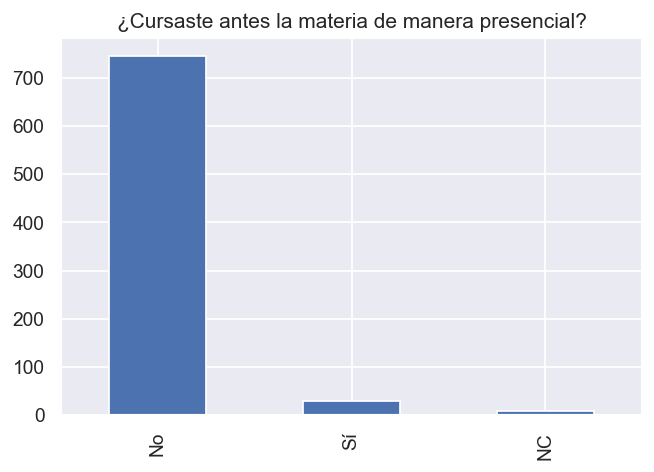

### Respuestas por curso

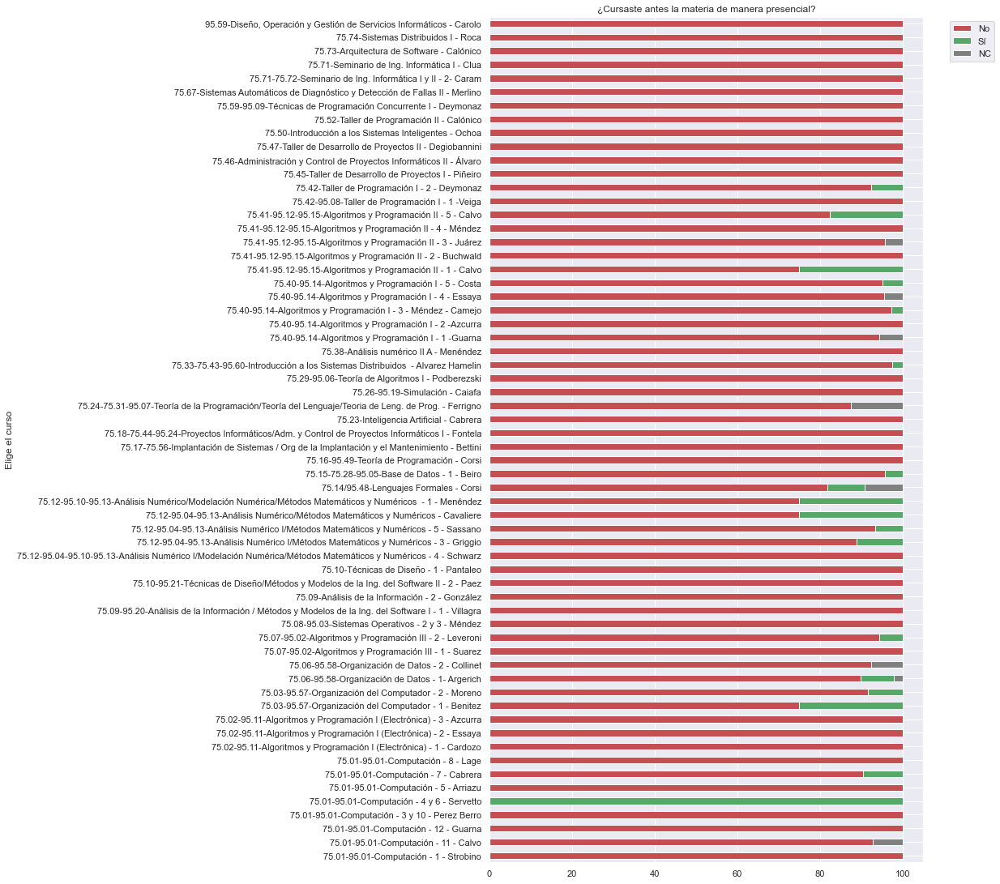

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Clases teóricas]

### Histograma por respuesta

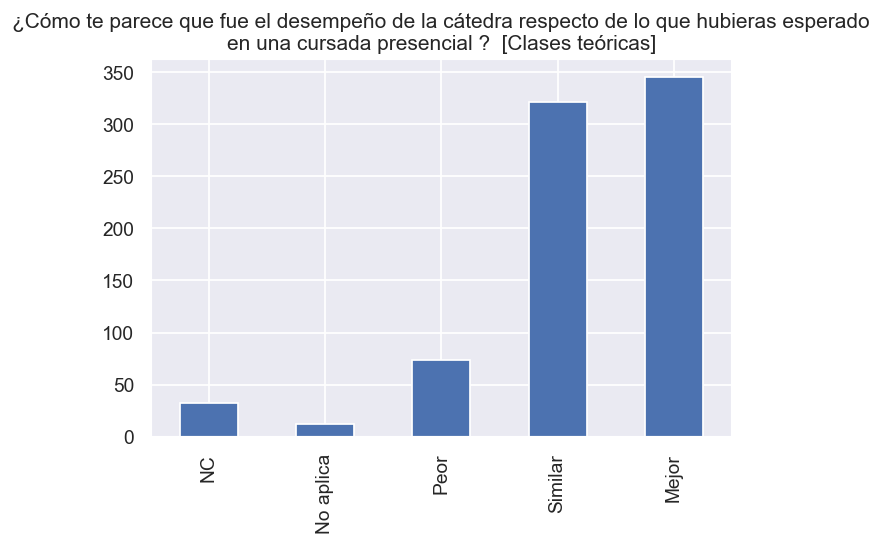

### Respuestas por curso

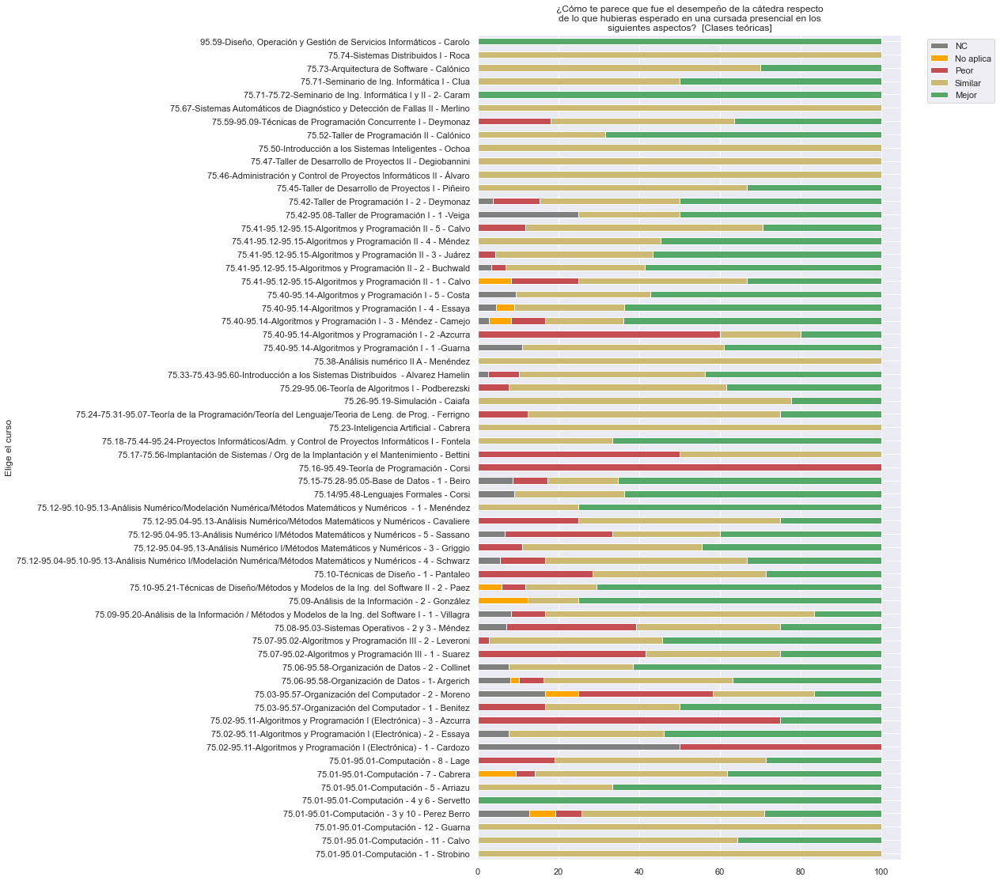

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Clases prácticas]

### Histograma por respuesta

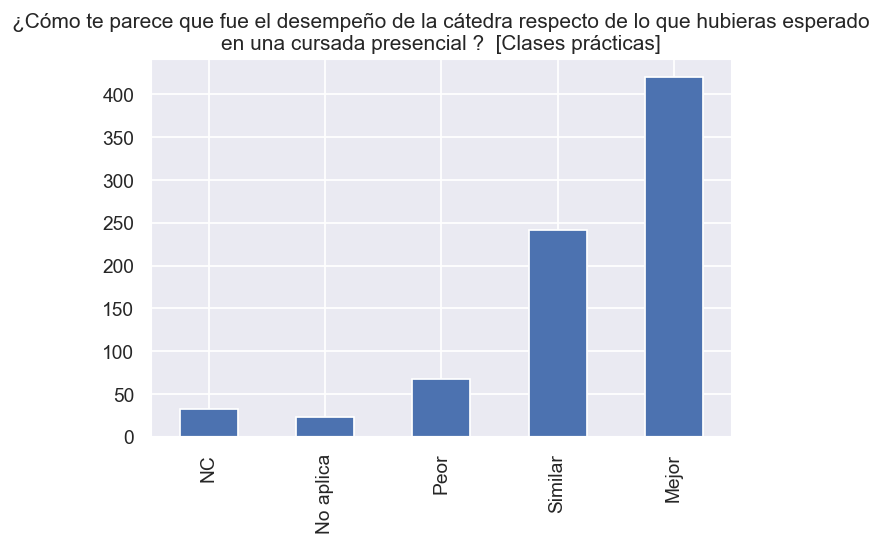

### Respuestas por curso

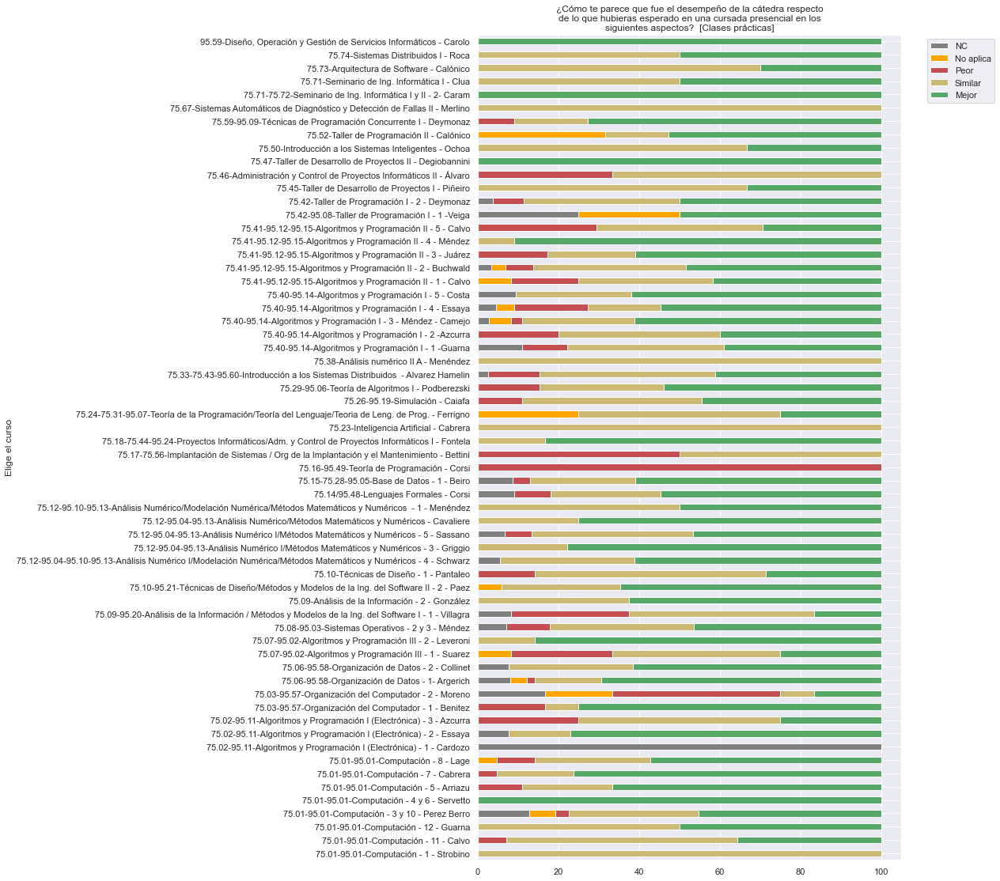

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Trabajos prácticos]

### Histograma por respuesta

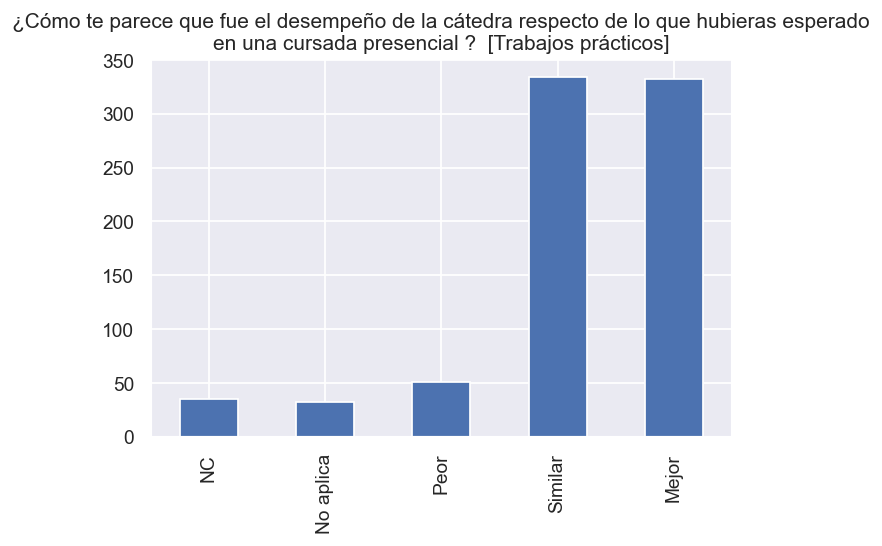

### Respuestas por curso

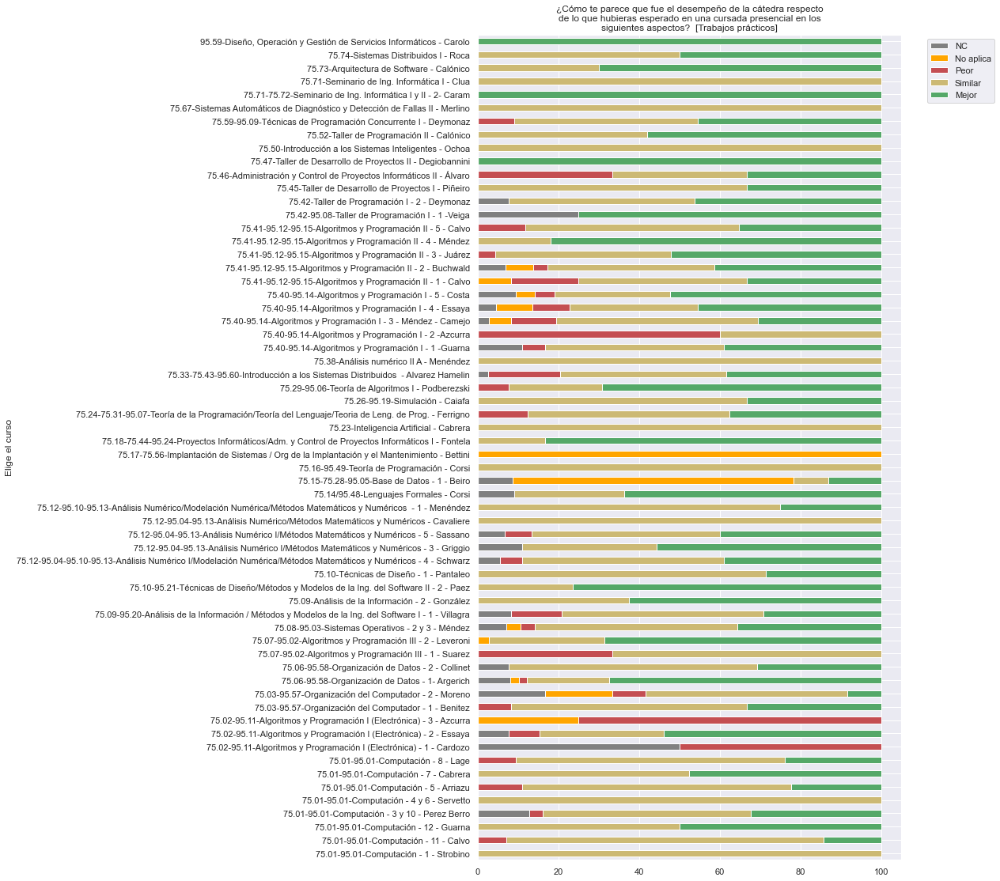

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Instancias de consulta]

### Histograma por respuesta

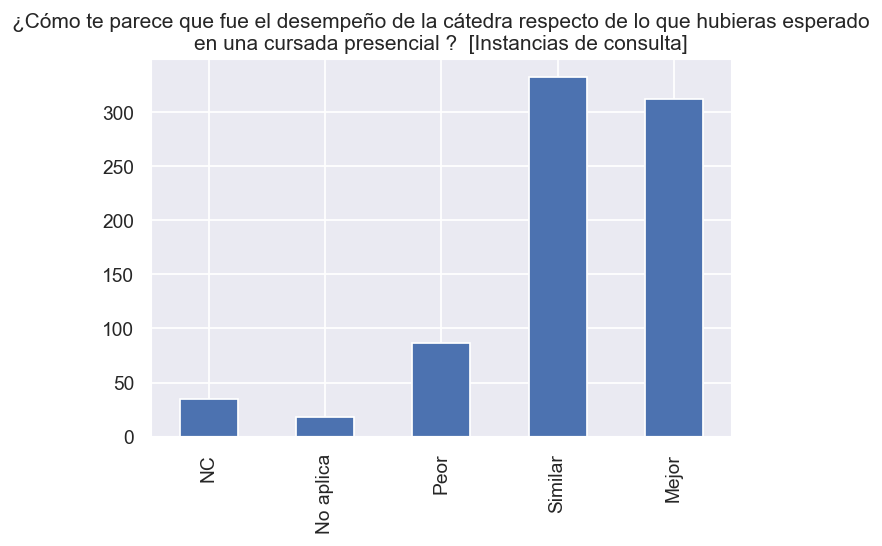

### Respuestas por curso

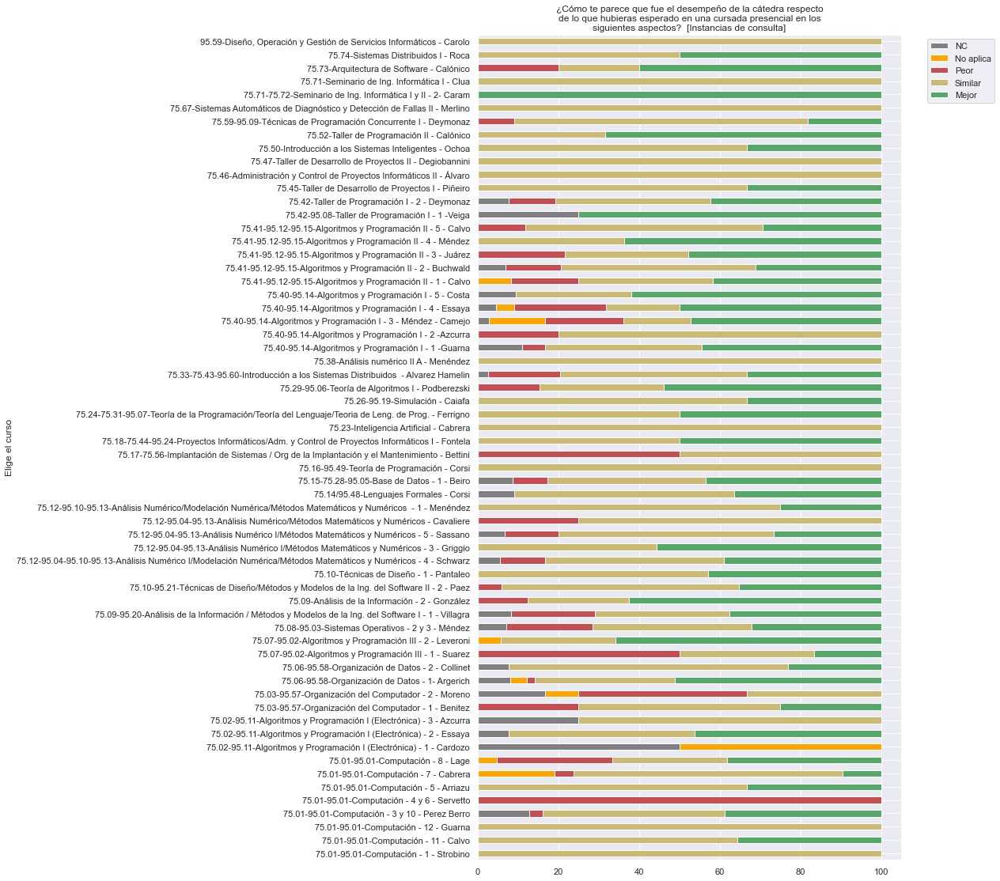

## ¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?  [Tiempos de respuesta ante consultas]

### Histograma por respuesta

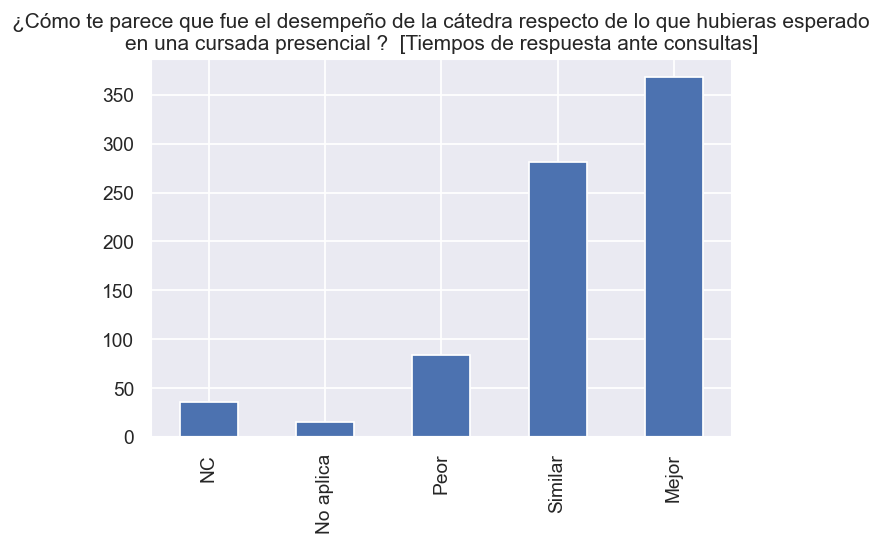

### Respuestas por curso

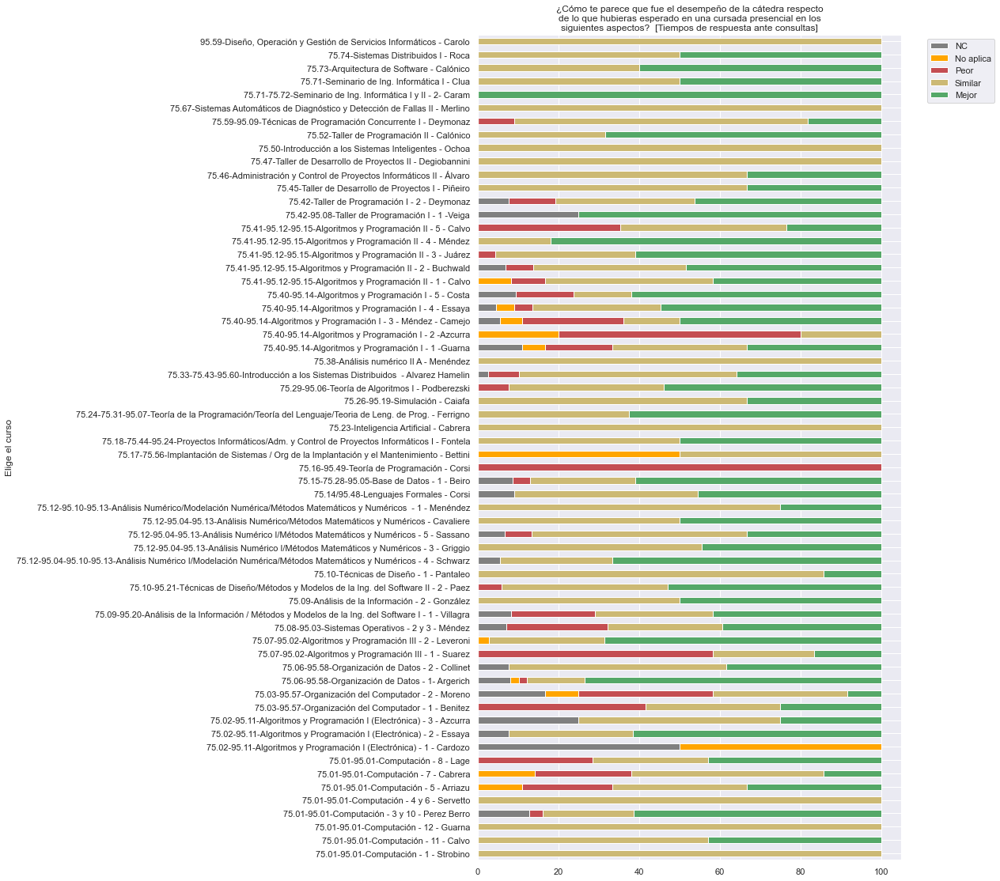

In [48]:
for col in columas_virtual:
    display(Markdown(f"## {col}"))
    display(Markdown(f"### Histograma por respuesta"))
    plt.figure(dpi=125)
    comp[col].replace(reemplazos_virtual, inplace=True)
    comp[col].fillna("NC", inplace=True)
    try:
        comp[col].value_counts()[orden_virtual].plot(kind="bar")
    except KeyError:
        comp[col].value_counts().plot(kind="bar")
    plt.title("\n".join(wrap(col.replace("en los siguientes aspectos",""), 88)), wrap=False)
    plt.show()
    
    display(Markdown(f"### Respuestas por curso"))
    newcol = col.replace("¿Cómo te parece que fue el desempeño de la cátedra respecto de lo que hubieras esperado en una cursada presencial en los siguientes aspectos?", "").strip(" []")  
    agg_col = comp.rename(columns={col:newcol}).groupby(['Elige el curso', newcol]).size().unstack(fill_value=0)
    try:
        agg_col_pcts = agg_col.div(agg_col.sum(axis=1).values, axis=0).mul(100)[orden_virtual]
        agg_col_pcts.plot.barh(stacked=True, figsize=(6.4*1.5, 4.8*4), color=["gray", "orange", "r", "y", "g"], title="\n".join(wrap(col, 60)), ylabel="%", legend=False)
    except KeyError:
        agg_col_pcts = agg_col.div(agg_col.sum(axis=1).values, axis=0).mul(100)[["No", "Sí", "NC"]]
        agg_col_pcts.plot.barh(stacked=True, figsize=(6.4*1.5, 4.8*4), color=["r", "g", "gray"], title="\n".join(wrap(col, 60)), ylabel="%", legend=False)

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

## ¿Qué aspectos valorás positivamente de la cursada remota?

Entendemos que estos aspectos no se corresponden con cada cátedra, si no en general.

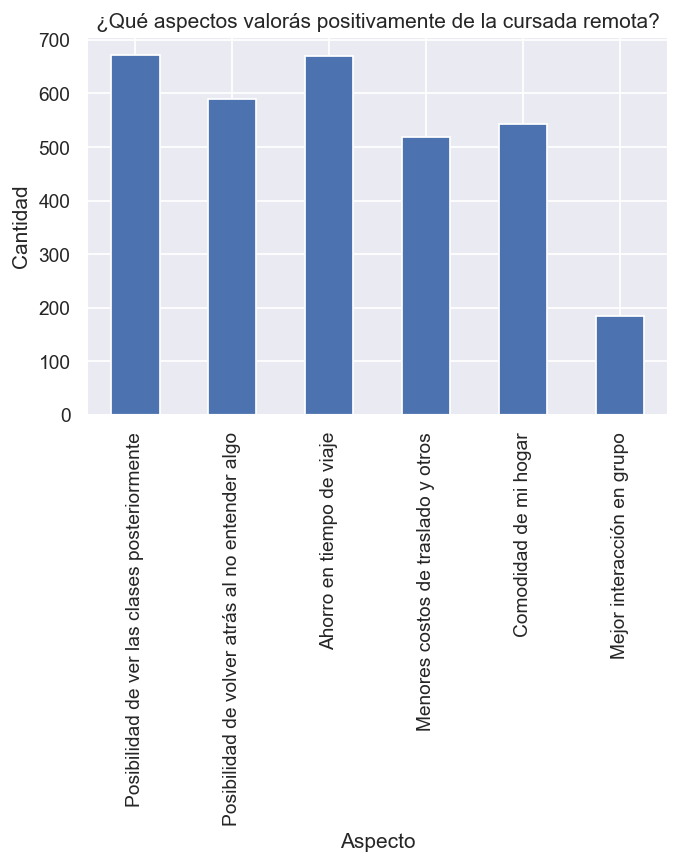

In [27]:
plt.figure(dpi=125)

aspectos = ["Posibilidad de ver las clases posteriormente",
            "Posibilidad de volver atrás al no entender algo",
            "Ahorro en tiempo de viaje",
            "Menores costos de traslado y otros",
            "Comodidad de mi hogar",
            "Mejor interacción en grupo",
            "Ahorro en tiempo de viaje"
]

df_aspectos_pos = pd.DataFrame()

column_text = comp['¿Qué aspectos valorás positivamente de la cursada remota? (elegí todas las que apliquen)'].dropna()

for aspecto in aspectos:
    df_aspectos_pos[aspecto] = column_text.str.contains(aspecto)

df_aspectos_pos.sum().plot(kind="bar")
plt.ylabel('Cantidad')
plt.xlabel('Aspecto')
plt.title('¿Qué aspectos valorás positivamente de la cursada remota?')
plt.show()

## ¿Qué aspectos valorás negativamente de la cursada remota?

Entendemos que estos aspectos no se corresponden con cada cátedra, si no en general.

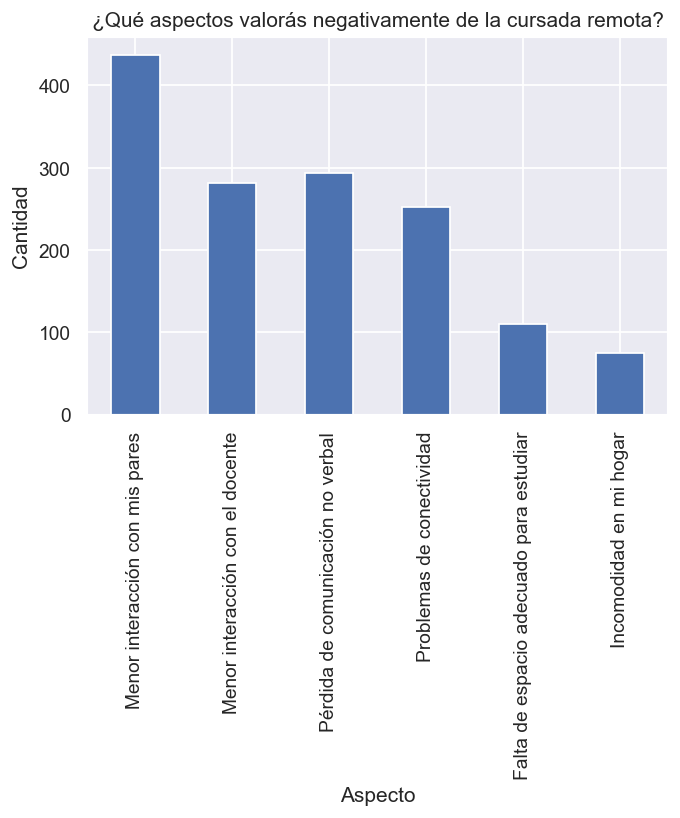

In [28]:
plt.figure(dpi=125)

aspectos = ["Menor interacción con mis pares",
            "Menor interacción con el docente",
            "Pérdida de comunicación no verbal",
            "Problemas de conectividad",
            "Falta de espacio adecuado para estudiar",
            "Incomodidad en mi hogar"
]

df_aspectos_neg = pd.DataFrame()

column_text = comp['¿Qué aspectos valorás negativamente de la cursada remota? (elegí todas las que apliquen)'].dropna()

for aspecto in aspectos:
    df_aspectos_neg[aspecto] = column_text.str.contains(aspecto)

df_aspectos_neg.sum().plot(kind="bar")
plt.ylabel('Cantidad')
plt.xlabel('Aspecto')
plt.title('¿Qué aspectos valorás negativamente de la cursada remota?')
plt.show()

## Correlación entre aspectos positivos y negativos

In [29]:
df_aspectos = df_aspectos_pos.join(df_aspectos_neg, how="outer").fillna(False).astype(int)
cooc = df_aspectos.T.dot(df_aspectos)
mask = np.zeros_like(cooc)
mask[np.triu_indices_from(mask)] = True

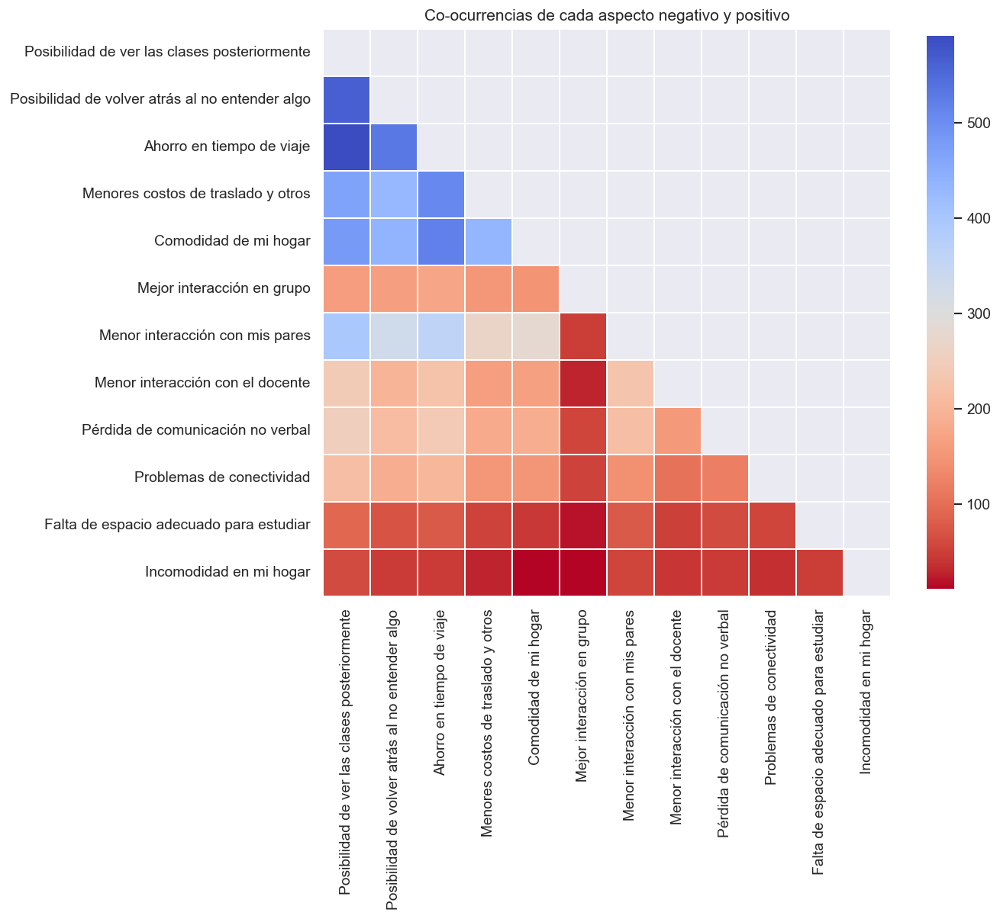

In [30]:
plt.figure(dpi=125, figsize=(6.4*1.5, 4.8*4))

sns.heatmap(data=cooc, cmap='coolwarm_r',linewidths=.2, square=True, cbar_kws={"shrink": .4}, mask=mask)
plt.ylabel("")
plt.title("Co-ocurrencias de cada aspecto negativo y positivo")
plt.show()

# ¿Creés que la cátedra estuvo a la altura de una cursada virtual? En cuanto a herramientas, comunicación, material, etc

In [31]:
def procesar_comentario(c):
    try:
        lineas = c.split("\n")
    except:
        print(c)
        raise
    return "\n".join([f"{l}" for l in lineas])

for curso in comp['Elige el curso'].unique():
    display(Markdown(f"## Curso {curso}"))
    com = comp[comp['Elige el curso'] == curso]['¿Creés que la cátedra estuvo a la altura de una cursada virtual? En cuanto a herramientas, comunicación, material, etc'].dropna()
    if com.empty:
        display(Markdown("_No hay comentarios_"))
    else:
        todos_los_comentarios = com.values.tolist()
        for comentario in todos_los_comentarios:
            try:
                if comentario == "":
                    continue
                display(Markdown(f"- {procesar_comentario(comentario)}\n\n"))
            except:
                print(todos_los_comentarios, curso)
                raise

## Curso 75.29-95.06-Teoría de Algoritmos I - Podberezski

- Sí, hicieron un gran trabajo desarrollando videos con los contenidos del curso.



- Si, el curso podria desarrollarse completamente virtual



- Los videos están bastante bien, se hacen un poco largos en general y algunos seguimientos un poco confusos. No fui a casi ninguna clase de consulta pero estaban disponibles las grabaciones. Pero igualmente con el material provisto de diapositivas, libros, videos, guías y ejercicios resueltos es suficiente para comprender los temas. Se pueden hacer consultas por slacks y se responden bastante rápido. 



- 100%



- Las clases teóricas son videos ya grabados que se encuentran en Youtube. Si bien esta idea es muy buena, la realidad es que al ser una materia tan grande, con tantos temas, por semana son muchos videos y son bastante largos, por lo que en algunos temas han llegado a ser más de 3 horas de videos. Si bien es cierto que son videos de aproximadamente media hora, se los puede ver en cualquier momento y no necesariamente todos juntos, son muchos videos donde son alternativas al video principal del tema y al fin y al cabo solo se toma un ejercicio de cierto tema en específico. Al ser tantos videos capaz se pierde el foco de lo importante sobre el tema, pero calculo que de forma presencial sucede lo mismo.
Las clases prácticas si son en vivo, duran 3 hs donde al principio se resuelven consultas y luego se hacen ejercicios de la guia en jamboard (son bastante prolijos tanto el profesor como los ayudantes)



- Sí, el material complementario ayudó a entender los temas.



- Totalmente



- Si



- Si



- Sí



- Si



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 5 - Calvo

- No



- Mas o menos



- Si, lo más destacable fueron los videos sobre explicaciones teóricas hechos por la profesora, que se habilitaban en el campus la semana anterior al inicio del correspondiente tema.



- si



- Sí



- Si



- Totalmente



- si



- La catedra ofrece mucho material teorico y practico



- Si creo que esta a la altura, tal vez sumaria un poco mas de material y ejercitacion mas adecuada.



- si



- Estuvo a la altura de las circunstancias que atravesamos



- si



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 3 - Juárez

- Si



- Tardan mil años en responder por Slack. Un desastre eso. Y además si te toca un corrector puede ser que apruebes pero si te toca otro no. Tiene que haber criterios unificados de corrección 



- si



- Si



- si, el sistema de que solo sea tp ayuda mucho y al ser virtual puedo usar mi pc siempre



- La catedra estubo a la altura de la cursada virtual-



- Si



- si



- La cátedra estuvo excelente. Todas las clases fueron grabadas. Los materiales mostrados durante las mismas se compartieron con el alumnado luego de terminar la clase. Toda la comunicación fuera del horario de clases se desarrolló mediante la plataforma slack, y siempre había algún profesor/ayudante para hacerle consultas.



- Si



- Tuvieron un slack muy activo y dieron la posibilidad de reever las clases. Dieron bastante material pero a mi parecer no es suficiente con el modo y la dificultad que evaluan.



- Si



- a nivel teorico estuvo a la altura, a nivel practico podria pulirse un poco mas




- Los temas, pdfs y diapositivas de la materia podrian ordenarse mejor en la pagina de la materia y bueno mejores resumenes acerca de los temas, los pdfs son muy extensos, las diapositivas muy escasas en informacion, si se puede re ver las clases pero eso involucra 2 hs unos resumenes que con verlos expliquen el tema sin la necesidad de necesitar el contexto de las grabaciones de las clases.



- La cursada virtual de algoritmos 2 fue excelente. ya que es una materia que NO TIENE SENTIDO cursar presencialmente y ayuda a aprender a trabajar virtualmente (lo cual sera muy comun entre los informaticos). 



- si



- Totalmente



- si



- Estuvo a la altura



- si



- Si



## Curso 75.42-Taller de Programación I - 2 - Deymonaz

- Faltó comunicación, lxs ayudantes no fueron suficientemente activxs



- Si, necesita mejorar igual, es una catedra nueva



- Sí.



- Excelente ! Creo que una cursada virtual es la mejor manera de hacerlo. En especial los dias de presentacion.



- Si. La materia perfectamente puede continuar siendo 100% virtual.



- Sí



- Super contento como se dictó la materia en forma virtual. Al ser una materia pura y exclusivamente práctica, creo que esta modalidad le viene perfecto; tanto por el tiempo ahorrado en viaje, como a la hora de hacer las reuniones semanales con los tutores de cada grupo.



- Estoy convencido de que esta materia es ideal para hacerse de forma virtual. Para este caso la cursada presencial no aporta ventajas



- Si



- Sí. El único detalle es que tardaron muchas semanas en subir el código que se veía en las prácticas.



- Si



- El material y las herramientas me parecieron adecuadas y suficientes (no sentí que haya nada de sobra).
La comunicación estuvo ok en cuanto a tiempos de respuesta en las consultas. Creo que las cuestiones que podría observar son más de gusto personal que un déficit del curso. Ej: me hubiese gustado que la devolución de los TPs quede asentada por escrito, pero entiendo que la información que preciso está disponible observando la grabación de la evaluación. 



- Sí, absolutamente.



- Si



- Sí, nada que envidiarle a una cursada presencial



- Si



- Si



- Sí, la verdad que se adaptaron perfectamente, 0 inconvenientes.



- Si



- Si, es mejor asi. Sobretodo poder codear en la propia computadora al ritmo de la clase 



- Si



## Curso 75.40-95.14-Algoritmos y Programación I - 4 - Essaya

- Si, la verdad que un lujo como organizaron todo, tanto los temas como las clases teoricas y practocas como tambien las maneras de evaluar, todo estuvo super bien planteado



- Si, mejor virtual que presencial al menos en cuanto a estas materias. 



- Si, totalmente.



- Si. La adaptación de la catedra a la virtualidad fue muy buena. 




- Si



- si, lo unco medio encontra es que dan super rapido las cosas, y algunos entramos con 0 conocimiento , en la practica y teórica paso eso



- La cátedra se adaptó muy bien a la virtualidad, todo el material se encontraba disponible en la página de la materia, y el formato de comunicación por Discord me pareció muy práctico, facilitaba mucho la comunicación con los docentes



- si



- Definitivamente, las herramientas como por ejemplo replit para poder ver y probar codigo en clase, los dibujos ilustrativos para temas un poco mas complejos (por ejemplo, introduccion a pilas y colas), la posibilidad de poder hablar con los profes no solo para consultas de algun ejercicio o clase sino otros temas y la bilbiografia que se da, todo sirve para no solo aprender sino que tambien incentivan a querer aprender mas



- Si



- Si, la cátedra supo adaptarse muy bien



- Totalmente, tanto Diego como los ayudantes facilitaron todo para nuestra cursada, ya sea en material como en estudio



- Totalmente. Antes de anotarme a la catedra he escuchado opiniones de otros alumnos que tambien cursaron en Essaya y dieron muy buenas opiniones respecto a todo lo relacionado con la conectividad. Ofrecen apuntes de estudio muy completos, y unos ejercicios practicos eficientes para el estudio



- Si



- si



- Si, excelente.



- Si



- No



## Curso 75.40-95.14-Algoritmos y Programación I - 3 - Méndez - Camejo

- Definitivamente



- Creo q la catedra se manejo exelentemente de manera virtual



- Si. 



- Si



- Si



- Estuvo muy a la altura, el equipo completo nos hizo una cursada muy linda



- Si



- Si, hasta siento que la virtualidad favorece a esta materia. Muy bien manejada la virtualidad por la cátedra, en todo sentido. 



- Si, slack fue una gran herramienta para la comunicación 



- SI, en todo.



- Si



- Mil veces mejor estudiar así.El poder ver una y otra ves si no entendés algo 



- Sí



- Si



- Absolutamente. La comunicación fue más eficiente en la cursada virtual y las herramientas virtuales para practicar fueron de mucha utilidad para mi caso especial. Además el material adicional como los apuntes de la cátedra son muy concisos y estuvieron disponibles toda la cursada.



- si, y mas también



- Excelente



- Sí.



- Si, creo que se adaptaron re bien a la virtualidad. El uso de chanutron, rpl y slack sumo un monton



- Mejor que una presencial incluso, las materias de programacion deberian tener la opcion de catedra virtual, se entiende mucho mejor



- Totalmente.



- Si obvio



- sep, se manejaron espectacular



- - Creo que se adaptaron muy bien a la cursada virtual, incluso tenian una plataforma para subir tps y tomar examenes. Se cayo mucho este cuatri en momentos vitales como el parcial o los cierres de tps, pero lo levantaban enseguida y  siempre lo tuvieron en consideracion agregando tiempo extra. Aun asi, me parece un detalle, ya que aunque hubiera sido presencial los tps se tendrian que haber entregado por ese medio tambien. Las clases por google meet nunca tuvieron problemas e incluso se grababan, asi que si uno no podia ir un dia o le surgio alguna duda podia volver a verlos en cualquier momento. Es un golazo esto y, si vuelven a presencial, sacarlo seria un ENORME retroceso. 
- Respondian bastante rapido por slack asi que no creo que haya habido problemas de comunicacion, al finalizar la cursada supongo estarian mas ocupados y se noto un poco.
- El material fue un poco pobre en cuanto a apuntes y ademas no se entendia bien, pero de ultima lo googleas. 



- Si estuvo a la altura



- Si, estuvo a la altura a pesar de las dificultades.



- Si



- Definitivamente si



- Si.



- Si



- Si y no. Creo que el segundo cuatrimestre fue algo muy particular. Después de la partida de Méndez la cátedra quedó a cargo prácticamente de los colaboradores. Este comentario lo hago sin desmerecer su conocimiento. Muchos estuvieron a la altura y otros la verdad no tenían buen desempeño. Creo que faltó más presencia de un titular.



- SI



- Totalmente



- La catedra cumplió con su programa, pero el profesor tenia el lema de "lo que yo digo, es lo correcto" tambien a los estudiantes que ya estábamos avanzados nos dejaba de lado.



- Si



## Curso 75.06-95.58-Organización de Datos - 1- Argerich

- Estuvo muy a la altura



- Si



- Totalmente, no creo que haya razón para que esta materia se tenga que dar sí o sí presencial.



- Si



- Totalmente, creo que es de las cátedras que mejor se adapto a la virtualidad y en general creo que es de las mejores cátedras que curse en todo fiuba. 



- Si, tener las clases grabadas y el Slack fue muy útil



- Definitivamente, los profesores se dedicaron a de la mejor mejor manera posible el de transmitir sus conocimientos y darse a entender, respondiendo dudas y ayudándonos en los desarrollos de los trabajos derivados de las clases. 



- Si



- Si



- Si, de hecho supero todas mis expectativas. Destaco mucho la comunicación, que siempre fue muy pero muy eficiente.



- Si, la catedra proveyó múltiples herramientas y opciones al momento de desarrollar los tps.



- Sí



- Si, fue una cursada bien organizada y adaptada a la virtualidad. Hubo buen uso de las herramientas virtuales para facilitar la comunicación



- Si



- Sí, estuvo muy bien organizado



- Si, muy.



- Si



- Si, bastante completo



- si 



- Si, muchas herramientas para la comunicación.



- SI



- Si. Me gusta la modalidad bastante aplicada en torno a la practica y no tanto a los examenes teoricos. 

La verdad es que probando en codigo me encontraba con muchas mas dudas que viendo los videos, y lo bueno es que luego buscando en internet o viendo los mensajes de Slack me ayudaba mucho en entender detalles que pasaba por alto.



- si



- Si



- si, creo que se pudieron adaptar muy bien



- Si



- Si, muy buena organizacion tanto para las clases como para las consultas



- Absolutamente



- si. La dinamica del slack, gradescope y piazza al principio es un poco caotico pero despues es muy organizada. me gusto



- La verdad que sí. Habían meets para las consultas, las clases teóricas estaban grabadas, los tps estaban publicados en una plataforma específica con toda la información disponible. No la cursé presencial, pero no me imagino que sea mejor que la opción virtual.



- A pesar de que me hubiera gustado tener algo presencial para poder intercambiar con mis compañeros y los profesores me pareció que se adaptaron muy bien con amplio material y canales de comunicación simples y claros



- Si la catedra estuvo a la altura.



- Si



- si



- Si



- Si



- La utilización de Slack permitió una comunicación alumno-docente de forma rapida y efectiva



- a la altura



- Sí, creo que se desempeñaron bien con la cursada remota.



- La cursada fue excelente. 
Clases teóricas grabadas las cuales se completan con clases de consulta despejando todas las dudas. 
Un grupo de slack separado por temas en los cuales los profesores responden rapido.
Los tp fueron de la dificultad justa, y las partes difíciles se aprendían con las ayuda de los profesores



- Si



- 100%



- Masomenos



## Curso 75.07-95.02-Algoritmos y Programación III - 2 - Leveroni

- Si, diría que estuvo bien a la altura



- Si, muy a la altura, los profesores y ayudantes respondían consultas mediante discord, herramienta que se utilizó de forma excelente y se aprovechó bastante bien. Este cuatrimestre tradujeron casi todo los papers que tenemos que leer a lo largo de la cursada, un esfuerzo muy grande de parte de ellos y la verdad que se aprecia mucho. 



- Si



- Totalmente sí, la mejor cátedra hasta ahora de forma virtual



- La cátedra aprovechó perfectamente todas las herramientas a su disposición para la cursada virtual



- Si



- Si



- Si



- Definitivamente manejaron muy bien la modalidad virtual. Canales de consulta, tiempos de respuesta, detalle en las respuestas, videollamadas para corregir cosas puntuales, clases pre-parcial, todo ofrecido y aplicado de forma ejemplar. Fue una de la cursadas virtuales más cómodas que tuve hasta ahora.



- Totalmente, la cateda Leveroni se adaptó a la virtualidad de manera exelente. Desconozco como eran las cosas antes, pero con el discord, su pagina web, el contacto constante por correo electronico,  lo dan todo para no dejar atras al alumno. 



- Se manejaron excelente. El discord es increíble. Con docentes respondiendo consultas por canales de voz casi las 24hrs del día, un lujo. Nunca me sentí tan acompañado en una materia



- Sí, demasiado. Utilizaron varias herramientas, como Discord, Quizzes y demás.



- Si, y no dudo que van a adaptarse bien también a la or esencialidad porque tienen conocimiento y predisposición 



- Si, estuvo a la altura. Nos comunicabamos a traves de discord y haciamos consultas por ahi ademas de en las clases y el material (apuntes, libros, links a ejercicios, links a tutoriales, etc) estaba disponible en la pagina de la catedra 



- Si



- Si



- SI



- Sí, estuvo a la altura de una cursada virtual. Siempre había algún docente disponible en Discord para hacer consultas por el canal de voz que era super últil además de las consultas regulares por el resto de canales



- si



- Ampliamente, la utilización de un discord facilitó mucho la comunicación



- Sí



- Si, muy completo. Incluso las dudas fueras del horario de clase eran respondidas casi inmediatamente.



- Si



- Si, incluso creo que el desempeño fue superior a si hubiera sido de manera presencial



- Si, muy a la altura



- Si



- Si,totalmente.



- Si



- Si



- Si



## Curso 75.03-95.57-Organización del Computador - 1 - Benitez

- Si



- Si. Excelentemente organizada. Solo diría q fueran un poco más rápidos para contestar dudas en el campus pero muy buena catedra



- Si



- Creo que tendrían que responder con mayor velocidad en el campus



- Si. Me parecio que estuvo mejor que presencial



- Realmente yo creo que si, fue una de las materias que mas se adapto y de muy buena manera, teníamos todo el material, no falta absolutamente nada, todo bien y explicado



- si, estuvieron atentos a adaptar rapidamente las necesidades. las clases grabadas fuerno fundamentales para repasar los temas y los encuentros de consulta para aclarar dudas.



- Si. Se adaptaron correctamente



## Curso 75.06-95.58-Organización de Datos - 2 - Collinet

- Si, fue excelente !



- Si



- Sí, totalmente. Incluso, considero que el hecho de que la cursada haya sido virtual ayudó bastante en este tipo de materias



- Totalmente



- Totalmente.



- Esta muy bien adaptada a la situación



- Si



- Si



- Sí, se adaptaron muy bien



- Sí 



## Curso 75.08-95.03-Sistemas Operativos - 2 y 3 - Méndez

- Si



- Si, siento que en cuanto a las herramientas estuvo bien



- Si, la adaptacion a la virtualidad fue excelete !



- Sí. No creo que la presencialidad pueda aportar algo extra, al contrario.



- No lo sé, prefiero la presencialidad.



- Si



- Si, la materia podria darse 100% virtual.



- Estuvo bien



- En ese sentido estuvo bien, contestan por Discord las dudas del TP siempre que pueden y rápidamente.



- Si



- Si



- Si. El formato por desgracia se presta mucho a no asistir a las teóricas y repasar, lo cual es una lástima porque me hubiera gustado haber podido aprovechar más tener un profesor como Mendez, pero llevar las teóricas al día no es fácil. La práctica es excelente y logra abarcar más de lo que creo que podría abarcarse de forma presencial.



- Si



- si



- Las clases teóricas podrían haber estado mejor. En vez de pasar las grabaciones del cuatri pasado se podrían haber dado las clases en vivo o haber preparado videos específicos de cada tema. No estaban mal las grabaciones, pero se pierde poder hacer las preguntas en vivo, aunque después haya clase de consultas no es lo mismo. 



- Hablando de la virtualidad, creo que se adecuó bastante bien. En la teórica se lee un apunte el cual está hecho por la cátedra y se detalla más. Luego en la práctica hay algunas que se ponen en practica conceptos que son útiles luego en los TPS, en otras clases simplemente se explican de forma conceptual para que se puedan aplicar en los TPs. El mismo contenido presencial sería igual o incluso peor ya que sería presentar con un proyector, lo cual siendo virtual es más cómodo de ambos lados.
Cada semana se manda un video con una clase teórica de un cuatri pasado, y luego la teoría de la semana es simplemente un repaso mas rápido sobre el mismo tema.
Tanto la teórica como la practica se graban.



- Si



- Si



- La catedra me manejo muy bien con el tema de materiales. este año la parte teórica lo que se hizo fue que se subían los videos de la teórica del cuatri pasado unos días antes y luego en la clase sincrónica se resolvían las dudas que uno tenia. Me pareció una buena forma de encarar la teórica ya que es una materia con mucho contenido teórico y de esta forma uno podía volver para atrás si no entendía o pausar el video. Para la comunicación entre los docentes y los alumnos se utilizo discord, lo cual me pareció un excelente canal de comunicación donde uno siempre estaba atento a lo que ponina y los docentes contestaban todas las dudas sobre los tps como sobre conceptos teóricos. 



- Si pusieron todas las herramientas a disposición pero la interacción y el uso no fue el esperado.



- Sí



- Totalmente a la altura. Debería quedarse como materia virtual por siempre en mi opinión. 



- Si



- No, lamentablemente la comunicacion fue nula en concepto de correcciones y respuestas administrativas de los docentes



- Si



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 4 - Méndez

- Sí, absolutamente.



- Si



- Sí, no tengo nada de lo que quejarme



- Estuvo muy bien.



- Fue excelente.



- Si, la catedra se adapto a la virtualidad completamente haciendo que la cursada sea muy buena



- totalmente



- No estuvo a la altura, estuvo mucho mejor.



- Muy a la altura. Excelente curso. Los profesores muy predispuestos. La comunicación entre la cátedra y los alumnos fue muy buena. El material de estudio fue brindado al inicio de cursada que sirvió mucho para las clases teóricas. Excelente curso!



- Si, impecable el uso de la pagina y RPL.



## Curso 75.07-95.02-Algoritmos y Programación III - 1 - Suarez

- El material y las herramientas dadas en la catedra fueron buenaz. La comunicación fue pésima y casi nula. El cronograma decía que ibamos a hacer una cosa y minutos antes de empezar la clase avisaban que iban a hacer otra.



- Se manejo de la mejor forma



- No



- Si, pero podrian intentar mejorar la comunicación 



- No, tardan 1 mes corregir parciales, en los trabajos prácticos no respondieron ninguna consulta, encima no tienen la capacidad de promocionar cuando en la otra catedra de la misma materia se puede



- si



- Me parece que hubo una falta de comunicación bastante grande, cuando hacíamos preguntas por slack muchas veces tardaban en contestar y hubo varias preguntas que hicimos en clase que por alguna razón no querían responder (preguntas sobre el parcial por ejemplo, hasta una semana antes del parcial no nos quisieron contar nada). Aparte de esto la cursada estuvo bien, las clases y el material previsto fueron suficientes. 



- Les faltaba gente para responder todas las consultas, fuera de eso perfecto



- Suárez es un ñoqui. Nunca da clases, solo deja unos videos grabados medio pelo y aparece cada tanto en clase para figurar.



## Curso 75.15-75.28-95.05-Base de Datos - 1 - Beiro

- A disposición todos los videos, documentos, notas, info, etc.



- Sí



- Si, estuvo a la altura



- Si, de todas las materias que cursé de forma virtual, esta es la que mejor parece haberse adaptado.



- la catedra se supo adaptar muy bien a la modalidad virtual



- Totalmente



- SI



- si



- Sí



- Si



- Fue la cátedra con la mejor organización de material y herramientas que cursé hasta el momento. Y si algo no se encontraba, siempre se podía consultar a los docentes.



- Si, se pudo aprovechar muy bien la virtualidad. Grababan las clases, daban espacios de consulta tanto en clase como en slack y siempre se notó buena voluntad



- Si!



- Si. Fue de los mejores cursos virtuales. La organización fue estupenda y ofrecen un curso con un nivel mucho mayor al promedio de la facultad.



- Si. Definitivamente.



- Si



- Si



- Excelente el manejo de la tecnología y herramientas para la enseñanza remota. Es una de las materias que se pueden dar remotamente, con el ahorro de tiempo y costo en translados, permitiendo a las personas que viven a 50 km de la facultad poder cursar la materia.



- Si, totalmente a la altura.



- Si. Creo que la modalidad virtual ayuda a que cada persona pueda realizar los talleres con sus propias computadoras. El material y las clases también están bien.



- Si, incluso superó la organización de la mayoría de las materías que cursé hasta ahora.



## Curso 75.52-Taller de Programación II - Calónico

- SI



- Si



- si



- Estuvo a la altura igual o mejor que en la presencialidad



- Sí



- Sí



- Si



- si



- Si



- Si.



- Si



- Totalmente. La materia es un TP grande que ocupa todo el cuatrimestre, separado en 4 instancias. Las clases teóricas son explicando por semana algún tema particular, mostrando ejemplos que luego sirven para aplicarlo en el TP, y en general tienen cierto orden con lo necesario para el TP.



- Si



- Si



- Si, totalmente



- Si



- Si



## Curso 75.50-Introducción a los Sistemas Inteligentes - Ochoa

- SI



- Si, se adapto muy bien



- Si



## Curso 75.24-75.31-95.07-Teoría de la Programación/Teoría del Lenguaje/Teoria de Leng. de Prog. - Ferrigno

- Sí



- Si, fueron clases que se entendían y el material estuvo bien.



- buena utilización de herramientas digitales



- Si



- Si



- Sí, la materia se adaptó muy bien a la modalidad virtual. Estoy muy conforme.



- Si, todo muy bien



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 2 - Buchwald

- Si



- si



- Si



- Si, la cursada fue excelente, lo único que se puede llegar a criticar es que las clases practicas a veces no aportan mucho. Había muchas veces que se mostraban ejercicios que la explicación no se terminaba de entender del todo, o simplemente se sentía que no aportaban mucho (Muchas veces se daban ejercicios o muy triviales o con un enunciado muy rebuscado, se tardaba mas en entender que se pedía que otra cosa). 
También la clase practica de puntos de articulación y CFC no me pareció que estuviese bien dada en lo absoluto, los ejemplos eran muy triviales, la explicación fue mala y no se dijeron cosas como la complejidad ni el nombre de los algoritmos; me parecieron muchísimo mejores los videos cortos que subió Martin pre-pandemia para entender los temas



- SI



- Si. Teníamos grupo de Slack para consultas, acceso a la página web con ejercicios, recursos y calendario completo y detallado. Buena organización en cuanto a entregas y exámenes, sistema de detección de copias y sistema de corrección automático de los TPs y entregas. También flexibilidad en las fechas y correcciones.



- Si, se manejaron muy bien y eso ayudo un monton a que la cursada sea mas llevadera



- Si, me parece que se adaptaron perfectamente.



- Si, definitivamente



- Totalmente, tanto las clases teóricas dictadas por Martín como las clases prácticas dadas mayoritariamente por ayudantes o profesores adjuntos fueron excelentes; de primer nivel.



- Si



- Sí, claro



- Si, se han adaptado de manera genial



- completamente, unos capos



- Si, realmente el curso está muy bien armado y adecuado a la virtualidad



- Si totalmente



- Poco  contenido



- Si, definitivamente. Se adaptaron muy bien y podrian mantenerse asi



- Si



- Si, totalmente a la altura. Clases con excelente calidad de sonido y video, canal de YouTube super completo(clases grabadas, repaso de temas teóricos, etc.), pagina de la materia completa e intuitiva. Grupo de Slack super activo, contestando todo super rápido. Incluso tuve inconvenientes con compañeros de grupo y se resolvió todo muy expeditivamente. Un 10!



- Se adaptaron bastante bien. Los parcialitos vinieron muy bien virtuales, y los talleres y videos pregrabados ayudaron mucho.



- Si



- Definitivamente.



- si, muy buena



- si, las clases me resultan claras al tener el código en pantalla y correrlo en clase, las consultas se responden rápido al contar con un canal se slack



- Si




- Si



- Sí. Aprovechó la virtualidad para tener contenido virtual, desde presentaciones hasta compartir pantalla para mostrar código, lo cual es considerablemente mejorque el código en pizarrón.



## Curso 75.10-95.21-Técnicas de Diseño/Métodos y Modelos de la Ing. del Software II - 2 - Paez

- Sí, en todo sentido. 



- Si, se adapto correctamente.



- Si



- Sí, estuvo a la altura.



- Si



- Altamente satisfecho



- Sí



- Si



- Si, sin duda. Es de esas materias que es incluso mejor que tengan cursada virtual.



- Si. Aunque no hubo muchas clases que fueron grabadas. Algunas no hacían falta grabarlas por los temas que se iban a ver, pero casi siempre se hacían consultas o aclaraciones que no quedaban registradas. De todas formas, en estos casos no hubo mucho problema porque se podía hacer consultas por otros medios, y la respuesta era rápida.



- Si



- Si, absolutamente



- Totalmente.



- Sí



- Si



## Curso 75.09-Análisis de la Información - 2 - González

- Estuvo a la altura para la virtualidad



- Si



- Si, podria ser 100% virtual.



- La práctica si. La teórica la metodologia del PPT podría ser un poco menos pesada



- Si. Gonzalez enviaba semana a semana las presentaciones de la clase y luego la clase era él leyendolas, detallando un poco más. Si las clases presenciales son iguales, sería más incómodo para todos ya que no hace falta estar presencial para poder dar este tipo de clases.
En la práctica se dieron pocas clases con ciertos temas que Gonzalez no daba, pero lo importante es que las clases prácticas eran de seguimiento de los distintos TPs con cada grupo, media hora cada uno. Ir presencial por solamente media hora es incomodo, ya que la virtualidad no perjudicaba en lo absoluto.



- Sí, quizás estaría bueno que se actualizaran algunos temas de la teorica.



- Sí



## Curso 75.09-95.20-Análisis de la Información / Métodos y Modelos de la Ing. del Software I - 1 - Villagra

- Si



- Si



- Bien logrado el uso de Classroom para tareas. Muy mala la atención de consultas por Slack.



- Con el cambio del plan de estudio en la carrera de ing. informática, no logró del todo adaptarse a la de alumnos inscritos en su curso.



- Totalmente, se manejaron perfecto



- Sin lugar a dudas



- si



- Sí.



- Si, la organización en principio era muy clara, cronograma marcado desde el día 1.



- Si



- Si



- Hasta cierto punto si pudieron integrar su cursada presencial a la virtualidad



- Herramientas, si. Voluntad, no.



- Si. Lo único que critico es que no graban las clases, sino que uno tiene que hacerlo con herramientas externas. 



- La catedra esta adaptada correctamnete a la virtualidad. No se adapta correctamente a los cambios de planes de estudio, ni a la cantidad de alumnos.



-  En cuestiones de materiales estaba bien organizada, se podía acceder desde un drive a todos los libros y actividades. También se utilizo classroom para la entrega de actividades lo cual me precio mejor que el uso del campus. Para vía de comunicación se utilizo slack, se tardaban su tiempo en contestar preguntas individuales pero contestaban



- si



- Si



- Sí



- Parcialmente estuvo a la altura. Todo el material y herramientas estaban disponibles totalmente actualizados, pero la comunicación con los docentes no era muy buena, se sentía un maltrato horrible hacia al alumnado. Siempre respondiendo la típica respuesta automática "En la resolución aclara por favor cuál es tu interpretación" o "La interpretación forma parte del ejercicio".

La ejercitación era muy pesada, el material era suficiente pero básicamente es una materia correlativa con Inglés. Acá sin Inglés la pasas muy mal.

Además no supieron reaccionar al pasar de 30 alumnos a 75. Quitaron la recuperación de ejercicios con la excusa que éramos muchos cuando estuvieron casi 1 mes y pico sin haber realizado ejercicios por culpa del TPG (tranquilamente ellos podrían haber dado recuperación en esas semanas).

Es decir, fue un cuatrimestre donde no existió recuperatorio alguno de nada.



- Si



- No, en lo mas minimo



- Si 



## Curso 75.03-95.57-Organización del Computador - 2 - Moreno

- No, lo mejor que había fue el libro de la materia porque básicamente todo lo que vimos estaba sacado de ese libro pero todo lo demás dejó que desear, el profe de la teórica le ponía onda pero todo lo demás tiraba abajo las ganas de estudiar la materia



- No



- No tengo dudas de que la cursada puede estar a la altura, el problema es que solo trabajaron durante el transcurso del cuatrimestre el profesor de la teórica y la ayudante de cátedra, en cuanto al profesor de la práctica no hay nada bueno para resaltar, sus clases comenzaban a las 19hs en lugar de 18hs y duraban a la sumo una hora , clases prácticas como tal quizás fueron 3 (las dos primeras y una dónde se presentó el tp2) ¿Por qué digo esto? En estas clases que comento se vieron filminas (por parte del profesor de la práctica) y algunos ejercicios (por parte de la ayudante de cátedra) luego de eso nunca más se dieron "clases prácticas" (remarco la buena actitud de la ayudante de cátedra todo el cuatrimestre). En cuanto a los profesores , sobre Patricio no me puedo quejar ya que explica bien pero creo que debería hallar la forma de hacer que sus clases sean más entretenidas, por parte de Pedro no hay nada bueno, repito, sus "clases" duraban una hora y habló más de su trabajo free lance (que no nos importa) más que de los temas de la materia, algunas "clases" ni las dió por este trabajo y me parece una falta de respeto total, priorizó siempre su otro trabajo, habló de que se necesitan profesionales y que "hay que recibirse rápido" esto no se vio reflejado en la pésima calidad de sus "clases", también debo agregar que según él dijo alguna clase, él es quien corrige los tps y habiendo hecho 5 tps en el cuatrimestre anunció hace unos días que la corrección de los mismos sería éste 31 de diciembre. Me gustaría que hablen con este docente para que realmente haga su trabajo y por ende mejore la cursada exponencialmente o en otro caso, cambiar al docente de la práctica por uno que sí haga lo que le corresponde, por lo tanto aún en estas fechas la aprobación de la cursada habiendo entregado todos los tps es un misterio.



- Yo considero que sí; es una materia que hay que dedicarle mucho tiempo y los temas dados fueron abordados en su justa medida y profundidad.



- Mas o menos



- no se 



- no



- Para nada, no hubo feedback en las correciones de los trabajos practicos a lo largo de la cursada, se daban muchas vueltas al momento de resolver consultas e inclusive a veces se equivocaban en las respuestas (aunque luego se corregian), las clases practicas despues del primer TP fueron pésimas, y en el ultimo cuarto de la materia directamente fueron inexistentes.
Las clases teóricas eran leer un power point en voz alta, agregando comentarios y dejando espacio para consultas.



- si



- No, en un principio la catedra pareciera no estar preparada ni para una cursada presencial, hay demasiado que dar y solo 1 o 2 docentes que no dan abasto y muchas veces no disponen del tiempo necesario para dedicarle a la materia, falta calidad en el material de explicacion del contenido y falta MUCHISIMA presencia de los profesores, practicamente no hubieron clases practicas y si bien habia un servidor de discord dedicado para la materia, el 90% del tiempo de la cursada de la materia no respondian consultas los profesores, y las pocas veces que lo hacian, era despues de multiples semanas con respuestas poco prometedoras. Personalmente da la impresion de que puede ser un problema de falta de inversion de recursos en la catedra, considerando que solo hay unos pocos docentes que de por si estan extremadamente ocupados con otros trabajos de entrada ya.



## Curso 75.67-Sistemas Automáticos de Diagnóstico y Detección de Fallas II - Merlino

- Sí



- Si



## Curso 75.33-75.43-95.60-Introducción a los Sistemas Distribuidos  - Alvarez Hamelin

- Sí, aunque podría haber estado mejor: Ej más material o modelos de examen.



- Las clases se extendian mas del horario, a veces hasta 30 minutos mas eso no esta bueno.



- Si



- En este cuatrimestre en particular, la parte práctica tuvo bastantes complicaciones de organización, corrección y cronograma, tanto para docentes como para alumnos, dada la inmensa cantidad de inscriptos al curso en relación con la escasa cantidad de docentes. Entiendo que esto es algo que sobrepasa a docentes y alumnos, quizás debería abrirse otro curso para absorber la demanda.
Respecto a la teórica, las clases cuentan con una agenda de temas bien programada, con puntos de vista alternativos al del libro, y se suben las grabaciones y apuntes.



- Parcialmente.
La asistencia obligatoria me pareció innecesaria.
La corrección del TP1 estuvo muy mal organizada y hubo grupos que se tuvieron que conectar 3 clases prácticas seguidas para quedarse esperando en el meet sin que les corrigieran.
Aparte, no sé si fue por la modalidad virtual, pero la cursada sigue durante enero porque nos pusieron una entrega de tp para el 31 de enero. La justificación de Hamelin fue "no necesitan tantas vacaciones, con 3 semanas les alcanza y sobra".



- No, la teórica es pésima. Tres horas de clase teorica con solo una de contenido real (efectivo) de la materia, lo demás se desperdicia en cosas relacionadas al trabajo del profesor y en su lentitud para explicar las cosas. Adicionalmente no entiende que un estudiante no aguanta tres horas prestando atención a una clase sin tiempo de receso cuando la dinámica es tan lenta y aburrida.



- Sí, creo que estuvo a la altura



- si



- Si



- mas o menos



- Respecto a la teórica sí, la práctica a pesar de contar con muchos alumnos, no supo llevar l materia a lo largo de todo el cuatrimestre.



- Si



- Hubo muchos alumnos para la cantidad de profesores que había. Esto hizo que en la práctica se complique a la hora de corregir los TPs y en la modalidad de evaluación, aunque se pudo resolver. Este problema también afectaría negativamente a una cursada presencial.



- No, la comunicación fue pésima y hubo muchísimas irregularidades como cambiar el criterio de corrección del parcial de una semana para la otra o poner un trabajo práctico en el verano como parte de la cursada. Una vergüenza



- sí, las clases fueron grabadas, todo el material siempre estuvo disponible en el campus



- Pasable pero no a gusto. Se aprovecharon mucho de la virtualidad para hacer cualquier cosa con las fechas. Tuvimos tps en enero y una desorganizacion total del cronograma al punto que no sabiamos la fecha de parcial hasta una semana y media antes (semana 12).



- Si



- Totalmente



- si



- Si.



- Si



- Si, estuvo a la altura de las circunstancias, sobre todo teniendo en cuenta la gran cantidad de alumnos que fuimos en este cuatrimestre (seguramente a causa de la eliminación de correlativas que hubo en la modificación del plan 1986).



- Si, muy buena



- Si, habia multiples canales de comunicación como Slack, Mail, las clases y a veces el campos. Asimismo, el material fue bueno (videos y ppts)



- Sí



- Sí, el curso se dió bien en modalidad virtual, pero fue bastante desorganizado. Recién el 2 de febrero se liberaron las notas de cursada.
Me pareció acertado que se grabasen las clases teóricas y prácticas ya que resultan muy útiles para repasar conceptos.
Me pareció ordenado el material brindado en el campus y muy buenas las diapositivas de las prácticas.




- Si. Las clases fueron grabadas y todo el material estuvo en el campus



- Si



- Creo que los problemas que tuvo el curso, a excepción del parcial, habrían sido iguales o peores en la presencialidad.



- No, este cuatrimestre hubo mucha desorganización y problemas, especialmente en la práctica por la gran cantidad de alumnos y evaluación/corrección de TP/parcial.



- Esta materia en particular si



- Si



## Curso 75.10-Técnicas de Diseño - 1 - Pantaleo

- En cuanto a herramientas/comunicación esta bien el curso. Se uso meet para las clases, slack y el campus.

Habría que actualizar el material que se usa en las teóricas. Son presentaciones de por lo menos 20 años que hasta tienen errores todavía.



- Si



- Normal. No grababan las clases.



- Si



- Si



## Curso 75.73-Arquitectura de Software - Calónico

- tremenda comunicación, con mucho material y explicaciones excelentes



- Si, todo el material de las clases, lecturas y ejercicios se fue subiendo a medida se iban dando. La organización y lineamientos del curso estaban claros desde el día 1. Comunicación fluída y rápida por los canales de la cátedra. Los TP muy claros y actualizados.



- Si, sin duda.



- Si



- Creo que la catedra esta a la altura de la cursada virtual. Tenemos un grupo de slack en el cual se comunican todas las novedades y podemos hacer consultas. Tenemos und rive con las diapositivas de las clases y la guia de ejercicios.



- Sí, totalmente



- Creo que estuvo muy a la altura de la cursada virtual pero hay mucho debate dónde la comunicación por fuera de la virtualidad es muy rica y hay mucha gente con distintas experiencias que vale la pena escuchar.
Haría un punto intermedio entre que algunas clases como la de TPs sean virtuales y grabadas para poder verlas después



- Si, totalmente



- Si, perfecto.



## Curso 75.59-95.09-Técnicas de Programación Concurrente I - Deymonaz

- Totalmente, el discord esta muy bueno



- Si



- Totalmente



- Si, lo estuvo.



- Estuvo a la altura. 




- Si



- Si



- Sí, estuvo a la altura



- Se adaptó decentemente, solo que compartían una única cuenta de google para grabar las clases, asique a veces tenían que esperar a que llegara el otro docente para empezar cualquier actividad



- Sí, totalmente.



## Curso 75.46-Administración y Control de Proyectos Informáticos II - Álvaro

- Si



- Si



- Si



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 2 - Essaya

- Si



- Si, se adapto muy bien.



- Si



- Completamente



- Excelente desempeño y acompañamiento por arte del cuerpo docente, tanto de la práctica como de la teórica.



- Si, se adapto perfectamente



- Muy a la altura, sinceramente no me la imagino siendo presencial. Impecable.



- Completamente. Seguro tenga que ver con que es una materia muy "informática", por lo que los docentes siempre supieron qué herramientas utilizar para transmitir sus ideas.



- Si,  tuvo los problemas típicos de la cursada virtual pero pese a todo pudieron dar la cursada a la altura.



## Curso 75.14/95.48-Lenguajes Formales - Corsi

- Se podría mejorar la forma en que se comparten las soluciones de las practicas. Estas suelen ser dinámicas, cada uno realiza los ejercicios y después se selecciona a uno para que lo comparta. Esto se viene haciendo en el chat del meet cuando se podría utilizar alguna otra herramienta y compartirla ahi mismo (Por ejemplo un docs/miro)



- Si, estuvo a la altura. Resolvieron muy bien la cursada usando Meet y el Campus.



- Si



- Totalmente, la programación funcional esta tomando cada día más protagonismo y poder ver una materia que muestre tanto las bases del paradigma como un lenguaje actualizado con un proyecto serio está totalmente a la altura de lo esperado.



- Si



- si



- Sí



- Estuvo a la altura. Es una materia ideal para la cursada virtual. Dieron todas las herramientas/apuntes necesarios para la cursada. 



- Muy



- Si



- Si, ya que fue virtual y el curso requeria programar me resulto mas facil ya que no poseo una maquina portatil para llevar a la facultad.



## Curso 75.40-95.14-Algoritmos y Programación I - 2 -Azcurra

- La cursada virtual fue ok. Había material audiovisual, tal vez se podrían haber aprovechado mejor los recursos digitales.  Poder trabajar con mí máquina en la parte práctica es extremadamente valioso.



- Si



- Regular, usualmente no respondían algunas consultas en el campus o respondían demasiado tarde 



- no



- si



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 3 - Azcurra

- Falta de comunicación 



- La catedra pudo haber aprovechado otras herramientas para hacer la cursada mas interactiva, pero dentro de todo estuvo bien



- Estuvo muy bien. Me gustaron especialmente las clases de Gustavo que veíamos los videos y luego se profundizaba sobre los temas o sobre lo que no entendimos. Además están buenos sus videos, y los ejercicios prácticos que los acompañan. El resto de los profes también estan muy bien.



- Cumplio



## Curso 75.47-Taller de Desarrollo de Proyectos II - Degiobannini

- Si, la organización de la materia fue muy buena.



## Curso 75.18-75.44-95.24-Proyectos Informáticos/Adm. y Control de Proyectos Informáticos I - Fontela

- Si



- Si



- si



- Si



## Curso 75.45-Taller de Desarrollo de Proyectos I - Piñeiro

_No hay comentarios_

## Curso 75.40-95.14-Algoritmos y Programación I - 5 - Costa

- si, creo que estuvo a la altura y pienso que esta muy bien adaptada para la cursada de forma virtual



- Si.



- Si



- Si, si bien la materia se presta mejor que otras a la virtualidad, se brindaron herramientas para apoyar la cursada y clases grabadas que ayudaron mucho durante la cursada.



- Sí, estuvo a la altura de una cursada virtual



- La cátedra supero mis expectativas, la mejor materia que cursé hasta ahora en la facu



- Si



- Si



- Definitivamente si



- Sí, completamente



- perfectamente 



- La cátedra se acomodo completamente a la nueva modalidad, desde la interacción virtual hasta los métodos de evaluación. 



- si



- Si la verdad que si 




- Si



- Si



- Sí.



- Si



- Si



## Curso 75.01-95.01-Computación - 8 - Lage

- Si



- No. Considero que siendo la materia computación debería ser la que mejor se adapte y fue un desastre. Decepcionada 



- No



- Si



- Si, si bien hubo cambios a principio de cuatrimestre, estuvieron a la altura



- Si, a partir de que Bruno, Guido y Franco se hicieron cargo de las clases todo se hizo más fácil.



- si



- Si



- La verdad no parecio que estuviera a la altura ya que de parte de los alumnos vimos muchas fallas e inconsisten



- Muy buena organización de parte de la cátedra, lograron resolver  bien las cosas a pesar de la virtualidad.



- si



- Si, totalmente. Quizás justo computación es una materia que se lleva particularmente bien con la virtualidad, pero me pareció muy bueno todo.



- Totalmente, excelentemente organizada



- si



- Se pudo desempeñar perfectamente, tanto asi que no entiendo como se puede dar la materia de manera presencial.



- De las mejores cursadas virtuales que tuve siendo honesto



- Si, pero le falto compromiso por parte de los docentes a la hora de las consultas



- Creo que esta cátedra estuvo y está muy a la altura de la cursada virtual, de hecho creo que podría ser una materia adecuada para dar completamente de manera virtual 



- si,  estuvo a la atura



- Si, posiblemente mas completo que lo que podría haber resultado en comparación con una cursada presencial



## Curso 75.26-95.19-Simulación - Caiafa

- De las mejores materias que hice, comparada con virtuales y presenciales.



- Sí



- Si



- SI, completamente



- si, perfectamente



- Si, lo estuvo.



- Si!



- Si



## Curso 75.01-95.01-Computación - 12 - Guarna

- Si, perfectamente a la altura. Muy bien el uso de meets y las diapositivas eran claras. Las clases fueron grabadas y eran fáciles de acceder. Lo único que no funcionó del todo bien fue el sistema de asistencias en el campus, pero la verdad que es un detalle menor. 



- Más o menos 



## Curso 75.23-Inteligencia Artificial - Cabrera

_No hay comentarios_

## Curso 75.01-95.01-Computación - 3 y 10 - Perez Berro

- En cuanto a mi curso estuvo muy bien organizado. Todo muy prolijo 



- Sí



- Si



- La cátedra estuvo a la altura de una cursada virtual. En mi opinión fue muy buena. Los videos de la teoría muy buenos y entendibles. La profe siempre atenta a los mails. La recomiendo 



- Si, tuve todas las herramientas para entender el material



- Sí



- Si



- Si



- Si, las profesoras son excelentes



- Si, muy buena cátedra. La recomiendo



- si



- Si, las profesoras siempre estuvieron a disposición y brindaban todos los elementos para poder entender los temas.



- Si



- sí



- si



- Totalmente.



- Si



- Si, la organización del curso en el campus semana a semana era muy buena y colaboraba con la organización de cada uno, haciéndose mucho mas llevadera la cursada



- Si



- la cursada estuvo a la altura 



- Fui muy escéptico al principio de la cursada con lo de las presentaciones para reemplazar las clases pero luego de leer las primeras clases me di cuenta de lo fácil que estaba explicado todo y me pude llevar muy bien con los temas, ademas luego, al tener la clase de consultas por grupo y lo fácil que fue sacar las dudas me tranquilizó para encara el resto de la cursada.



- Si



- si



- Sí, definitivamente.



- Lo resaltante fue la responsabilidad de la profesora al responder muy rapido y con mucho detalle, lo unico a mejorar seria dar una clase en vivo a parte de las grabadas



## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 1 - Calvo

- Si



- Si.



- si



- Sí, superó mis expectativas incluso



- Si. Tuvimos las herramientas y material suficientes para entender los temas



- Si



- Catedra muy recomendable



- Muy buena predisposicion de los docentes mucho material con youtube, videos y clases grabadas



- Si, estuvo muy bien



- la verdad que si , por que tambien dejaron muchos pdfs y clases viejas para ver



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 3 - Griggio

- Tanto Fabián como Silvana estuvieron super predispuesto durante en cuatrimestre para consultas de ejercicios y para consultas sobre los tps.



- Si, estuvieron pendientes de que sigamos la materia, dudas y que tengamos las herramientas y el material utilizado en clase



- La cátedra me pareció muy buena. Las clases están bien dadas, está bueno que dejen las clases grabadas. Los temas evaluados en el parcial son los dados en clase. En cuanto a los TP`s, está bueno que sean tres tps de dificultad media, y no uno largo. En cuanto a Silvana Cerrutti, siempre estuvo dispuesta a contestar consultas. El cuerpo docente de está cátedra me resulto excelente.



- Si



- si



- si, esta buenisimo que se pueda utilizar herramientas de simulacion y que lo puedas probar en tu compu en el mimso momento. Es muhco mas fructifero hacerla virtual 





- si me gusto la buena predisposición de los docentes, sobre todo por parte de Fabian y Silvana



- Si



## Curso 75.40-95.14-Algoritmos y Programación I - 1 -Guarna

- No lo creo, existen muchísimas herramientas que con la virtualidad tenemos a nuestro alcance, no hubo prácticamente ninguna. La página que se utiliza para subir ejercicios que se autocorrigen muchas veces falla en instancias que no debería, y en el resto de la cursada se hizo prácticamente lo mismo que se haría en el salón de clases.



- Si



- Sí



- Creo que estaba bastante a la altura



- No del todo, le faltaba una vuelta de tuerca



- si pero lastima que me dejaron entras un mes despues  manmde mail a todo el mundo y ni bola me dieron cuando me habilitaron ya tenia elprimer paracial que dar y perdi esa chanse



- Estuvo a la altura



- En cuanto a comunicación tanto hacia los alumnos como entre los docentes de la cátedra considero que tienen bastante que mejorar



- Sí, hay mucho material en el campus. Hay videos de las clases, y sobre todo hay videos cortos muy buenos hechos por Bianchi. Todos los profes son muy buenos, a mi en especial me gustaron las clases de Ezequiel y Gustavo.



- Si



- Si. Hay clases grabadas y documentos de todos los temas, tambien bastantes ejercicios. Pablo, Gustavo, Andrés, todos muy buenos profes; responden a las consultas.



- si



- Si, me parece una materia para ser cursada totalmente de manera virtual. Me parece mas productivo estar en el hogar y poder ver las clases grabadas.La mayoria de los estudiantes trabaja y siempre llegan tarde a la cursada presencial o tienen que irse temprano para no perder el ultimo transporte



- Sí, considero que la virtualidad fue más un plus que una modalidad de cursada.



- Si 



- Si



## Curso 75.12-95.04-95.10-95.13-Análisis Numérico I/Modelación Numérica/Métodos Matemáticos y Numéricos - 4 - Schwarz

- Si



- si, estuvo a la altura



- Si, de las mejores que curse (contando materias que no son del depto de computacion), el agregado de telegram y uso constante del mismo de los docentes hizo que el campus sea algo que se pueda evitar y como consecuencia mucha mejor comunicacion en general que otras materias.



- si, totalmente



- Sí, creo que el curso es bastante organizado. Las prácticas son excelentes, el profesor contesta dudas por el grupo de Telegram prácticamente al instante.



- si, salvo problemas de conectividad 



- Si



- si



- Muy a la altura. Nos brindaron todo el material necesario y utilizaron las herramientas tecnologicas disponibles para facilitar el entendimiento de los temas, volviendo la cursada virtual aún más rica que una presencial. 



- Si, siempre estuvieron pendientes de las consultas que surgían.



- si



- Si, se adecuó bien.




- Si




- Totalmente, desde mi experiencia fue de las que mejor se adaptó. Evidentemente incide el hecho de que sea computación y la posibilidad de estar en tu casa con tu computadora es una gran ventaja, pero además, la modalidad de clases prácticas fue muy buena.



- Totalmente. Tanto el Ing Schwarz como todo el equipo docente de la práctica siempre estuvieron muy atentos a dudas y consultas de los alumnos y contestaban muy rápido. El material estuvo muy bien, especialmente el Resumen de Clases Teóricas y los videos prácticos, excelentes. 



- si



## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 5 - Sassano

- Si, la cátedra se adaptó muy bien



- Falto un medio de comunicación claro y bueno. El foro del campus no sirve por qué no avisa cuando se mandan y por ahí tenías que mandarles un mail por consultas del tp y tardaban días en contestar. Además no hay un medio para consultar dudas simples más q esperar a la siguiente clase. 



- Siento que hicieron uso de las mejoras herramientas disponibles para dar la clase excepto usar el foro del campus que es muy lento. Entiendo que queda registrado para un futuro pero se pierde el hilo de la pregunta



- Si



- No



- Si, muy bien organizado, mucho material a disposición y de manera efectiva. Todas las plataformas utilizadas (youtube, google meet, etc) son las que considero más efectivas y adecuadas



- Si



- Sí



- Sí



- Sí



- Totalmente



- Si



- Si



## Curso 75.71-Seminario de Ing. Informática I - Clua

- Si.



- Si, al ser pocos alumnos había buena interacción entre el docente y los alumnos.



## Curso 75.12-95.10-95.13-Análisis Numérico/Modelación Numérica/Métodos Matemáticos y Numéricos  - 1 - Menéndez

- Si



- Sí, debe ser una de las materias que mejor se adapto a la virtualidad. Esta materia en forma virtual me encantó. Lo único que critico es que a veces los docentes tardan mucho o no contestan las consultas en el campus.



- Si



- Si



## Curso 75.12-95.04-95.13-Análisis Numérico/Métodos Matemáticos y Numéricos - Cavaliere

- Si



- creo que se debería dar más material práctico



- si



- La cátedra estuvo a la altura



## Curso 75.42-95.08-Taller de Programación I - 1 -Veiga

- Si, sin duda.



- Si



- Totalmente



## Curso 75.01-95.01-Computación - 11 - Calvo

- Si



- Si



- Si, todo muy completo. Aprendí un montón de programación. Lo cual puede abrirme nuevas puertas en el futuro.



- Fue muy buena cátedra en todo sentido, la cursada fue adecuada



- Si , tuvimos muchas herramientas y la profe busco formas para que podamos tener la mejor cursada considerando la pandemia 



- Dada la naturaleza de la materia como lo es computación, me pareció que si estuvo a la altura ya que la materia principalmente se trata de usar una computadora hablando de rasgos mas generales



- Sí



- si



- si



- Si, muy buenas las clases teóricas y practicas y muy interesantes todos los temas.



- Creo que si, estuvo excelente la cursada



- Si, creo que estuvo a la altura.



## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 2- Caram

- Sí, absolutamente. Se notó un gran profesionalismo en la preparación y el dictado.



- Si



- Sì



## Curso 75.01-95.01-Computación - 5 - Arriazu

- Si



- Si, el curso en el que estuve pudo adaptarse muy bien y darnos las herramientas para poder hacer todo lo pedido. Y el hecho de que haya sido virtual facilitó mucho las cosas ya que es una materia puramente virtual y es más llevadero de esta manera.



- Totalmente



- Si, fue una cursada muy dinámica y al ser virtual las profes podían ir mostrando paso a paso cómo usar aplicar lo diferentes temas dados en python. 



- Si, habia bastante material para consultar



- Este es un caso en el que la modalidad virtual favoreció a la cursada. Poder ver en tiempo real lo que las profes escribían en su computadora resultó de gran ayuda. Además las profes fueron siempre muy atentas a nuestras dudas y lograron que los temas se fueran entendiendo de forma clara, interconectándolos y poniendo muchos ejemplos. Excelentes docentes Alejandra y Karen!



- Si.



- Yo creo que sí estuvo a la altura. En el campus contábamos con mucho material para poder entender mejor los temas dados



- Si



## Curso 75.74-Sistemas Distribuidos I - Roca

- Si



- Sí



## Curso 75.01-95.01-Computación - 1 - Strobino

_No hay comentarios_

## Curso 75.16-95.49-Teoría de Programación - Corsi

_No hay comentarios_

## Curso 75.01-95.01-Computación - 4 y 6 - Servetto

_No hay comentarios_

## Curso 75.17-75.56-Implantación de Sistemas / Org de la Implantación y el Mantenimiento - Bettini

- En cuanto a herramientas, si, comunicación en líneas generales también, pero el material tiene telas de araña. También estaría bueno tener algún ejemplo resuelto como guía, para entender los criterios de corrección. 
Y lo otro, es que las clases de consulta previo a los parciales y recuperatorios, se cancelaron sin aviso (nos enteramos sobre la hora). Y el parcial tenía contenidos de un tema que aún no habíamos visto (auditoría, 2da parte de la materia).




- No, para nada. No querian grabar las clases para verlas luego.



## Curso 75.38-Análisis numérico II A - Menéndez

- si



## Curso 75.01-95.01-Computación - 7 - Cabrera

- Si



- si, estuvo a la altura



- si



- Si



- Si



- Si



- Si



- La cátedra estuvo muy a la altura de las condiciones para esta cursada



- Hicieron lo mejor posible y todo lo que estuvo en su alcance para hacer la cursada de una manera prolija. Quizas necesitaban mas instruccion en el manejo de la tecnología pero es algo normal en docentes cuya generación no nació con un dispositivo bajo el brazo



- En mi opinión si. Al ser una materia donde la tecnología y todo lo que eso conlleva van de la mano, fue más comprensible cada tema, el manejo con mis compañeros para hacer el tp depende de la onda que cada uno ponga para el armado del programa pero en mi caso eso no fue un problema, hubo una buena comunicación. Los profesores dieron muy bien la materia, eran dinámicos y no fue aburrido ver los videos.



- La verdad que no tengo ninguna queja alguna.



- si



- Si



- Si



## Curso 95.59-Diseño, Operación y Gestión de Servicios Informáticos - Carolo

- si



## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 1 - Cardozo

- No



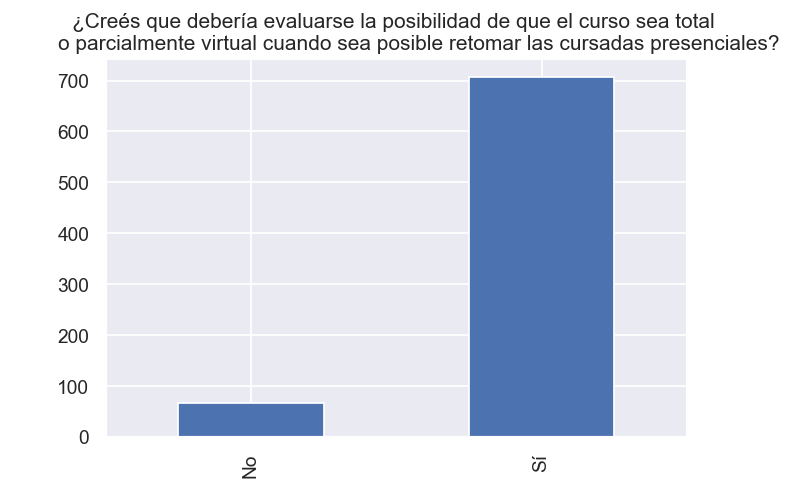

In [32]:
comp['¿Creés que debería evaluarse la posibilidad de que el curso sea total o parcialmente virtual cuando sea posible retomar las cursadas presenciales?'].replace({'Si' : 'Sí'}, inplace=True)

plt.figure(dpi=125)
ax = comp['¿Creés que debería evaluarse la posibilidad de que el curso sea total o parcialmente virtual cuando sea posible retomar las cursadas presenciales?'].value_counts().sort_index().plot(
        kind='bar', 
        title='''¿Creés que debería evaluarse la posibilidad de que el curso sea total 
        o parcialmente virtual cuando sea posible retomar las cursadas presenciales?''')

## ¿Estás conforme con la forma en que el curso evaluó sus contenidos? ¿Te sentiste cómodo/a?

In [33]:
for curso in comp['Elige el curso'].unique():
    display(Markdown(f"## Curso {curso}"))
    com = comp[comp['Elige el curso'] == curso]['¿Estás conforme con la forma en que el curso evaluó sus contenidos? ¿Te sentiste cómodo/a?'].dropna().drop_duplicates()
    if com.empty:
        display(Markdown("_No hay comentarios_"))
    else:
        display(Markdown("\n\n".join(f"- {x}" for x in com.values.tolist() if x != "")))

## Curso 75.29-95.06-Teoría de Algoritmos I - Podberezski

- Sí, las instancias de evaluación fueron bastante justas. Se utilizan como aprendizaje y no para castigar a los alumnos.

- Si, la dificultad de los tps y los parcialitos fue acorde. La defensa del tp me pareció demasiado complicada, mas difícil incluso que los parcialitos, pareció mas un parcial que una defensa.

- Los parcialitos están bien, y el final reducido/promoción es alcanzable. Los tps no fueron complejos, la verdad que bastante justo y conforme con la experiencia.

- no, los parciales fueron muy dificiles/complejos, muy vuelteros. por mas "optativos" que fueran. los mismo la "defensa de tp" que fue un cuestionario sobre los temas de la materia, nada q ver con defender el tp ni evaluar quien trabajo y quien no. creemos q hay uno que es mas grato corrigiendo, y solo por eso aprobaron varios (para promocionar, ya q los parciales eran optativos). Temo q el final sea igual. Los tps son cargados de mucha teoria innecesaria (aunq alguna esta bien). NO la recomiendo, capaz ni rindo el final. Los temas creo q ya los aprendi, y esos es lo q importa. Por mas q estudies en unos meses te olvidaste todo. el truco es aprenderlo de una forma amena y divertida para que te quede. El alumno recuerda mejor una buena experiencia que un parcial

- Si. De forma obligatoria son 3 TPs (1 individual y 2 en grupo de a 4) donde se piden cosas que se ven en los videos, sobre cierto tema o 2/3 temas en especifico. No tienen mucha dificultad, pero si hay que dedicarles tiempo.
Luego se toma una defensa de los TPs (fueron 2 instancias de multiple choice y luego un oral en caso de desaprobar ambas instancias) donde se toman temas de los TPs pero también sobre el tema en particular de forma teórica. 
Luego hubieron 2 parciales optativos con 3 temas cada uno, en caso de aprobar 4 o más se promociona la materia ya que es prácticamente el final dividido en 2 parciales. Creo que es una idea interesante pero cursando más materias y con la cantidad de videos que tienen cada tema llevaba mucho trabajo estar al dia y poder rendir bien estos ejercicios. Si bien obviamente había relación con los ejercicios que se daban en clase, eran más difíciles y complejos.

- La verdad la forma de evaluación me pareció de las mejores que tuve hasta ahora

- Fue de los mejores

- Si

- Sí

## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 5 - Calvo

- No

- No me pareció buena. No daban devoluciones.

- Si 

- Sí, creo que lo que se evaluó estuvo acorde al contenido dado, y no hubo exigencias de más.

- si

- Sí

- Si

- Totalmente

- creo que la instancia de evaluacion no tiene mucho sentido realizar un examen en pepel teniendo la posiblidad de realizarlo en computadora. Obviamente esta medidad viene acompañada de una mayor exigencia para la correccion, como un minimo piso de que el programa compile, por ejemplo.

- totalmente

## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 3 - Juárez

- Si

- Si, muy bueno el contenido

- creo que seria mejor tener un tp de grafos para verlos mejor

- Me siento comodo con la manera en el curso evaluo sus contenidos

- si

- Me sentí cómodo con el sistema particular que tiene esta cátedra para evaluar.

- Si, el sistema de puntos es muy bueno

- En absoluto, Aunque haya desaprobado no siento remordimiento y probablemente la curse de nuevo aca porque me parecian interesantes los temas. Aun asi me parece que el nivel de las clases es muy muy flojo y los tp desde el segundo en adelante son muy muy dificiles y cuesta mucho hacerlos entendiendo todo a conciencia y en profundidad. Senti que para el tp2 las clases no estuvieron a la altura de lo que se pidio en el trabajo.

- No

- me siento conforme

- Seria interesante que nos permitieran usar librerias y que por ende tengamos que hacer TPs mas complejos pero a su vez mas interesantes, entiendo que el implementar de cero una estructura de datos lo lleva a uno a entenderla mejor, pero quiza con hacer una version basica c/u cuando se introduce el tema para entender el transfondo de como esta hecha y luego usar las misma estructura importada desde una libreria para entender la funcionalidad y aplicarla en los TPs haciendo que nos podamos enfocar en otros aspectos del TP seria mejor, mas cercano a como se trabaja en el mundo real.

- Me senti sumamente comodo la cursada irtual de este curso.

- contenido muy dificil en poco tiempo hizo que cueste mas, pero dentro de todo si

- Si. Muy conforme

- Muy cómodo con la forma de evaluar los contenidos

## Curso 75.42-Taller de Programación I - 2 - Deymonaz

- No, no fueron justos y las veces que pedimos ayuda no fueron resueltas.

- Necesita un poco de trabajo pero viene bien, y es mucho mas razonable comparado a la otra catedra

- Sí.

- Muy conforme ! El Tp es una buena puesta en practica integradora

- Si, la dificultad del tp me parece acorde a los temas y a la importancia de la materia. Las reuniones semanales con el profesor encargado del tp fueron claras y productivas. Siempre se resolvieron las dudas planteadas tanto en vivo como por el grupo de discord.

- Si. Totalmente.

- La evaluación consistió en un TP grupal durante el cuatrimestre y reuniones semanales con un corrector donde le mostrabamos lo que habíamos avanzado y nos poníamos objetivos para la siguiente semana. Me pareció buena la modalidad, algunas semanas se hizo muy pesado lograr los objetivos pero al final fue muy gratificante.

- Muy conforme con cómo se evaluó y cómo fueron los seguimientos semanales. La idea de que no haya parcial, y el final sea una extension/agregado del TP, es excelente ya que permite integrar lo hecho durante todo el cuatrimestre. 

- Tener un seguimiento semanal con evaluación constante me parece un excelente enfoque. Es mas efectivo y menos estresante que una gran evaluación final

- Si

- Luego de un TP que duró prácticamente todo el cuatrimestre, y que tuvo seguimiento semana a semana, me parece innecesario tomar un agregado extra al TP como examen final.

- Si, me parecio bien

- Si. Destaco la relación carga de trabajo - carga horaria de la materia y la periodicidad de las instancias de seguimiento.

- Con respecto tengo algunas críticas (siempre con el propósito de mejorar). Creo que se dieron temas muy interesantes y se explicaron muy bien. Ahora, la verdad es que la materia se dio practicamente entera en 6 clases y hay muchos temas nuevos (al menos para mí). Creo que hay que trabajar en más prácticas con más ejemplos, hubiese estado buenísimo ver algunas implementaciones de los docentes de los ejercicios de las guías (que por cierto los hice todos) y no vimos ninguno. Por ejemplo, el de ThreadPool me parece un ejercicio clave, y la verdad era bastante dificil si nunca viste Threads. Lo mejor de la cursada es la predisposición de los ayudantes siempre dispuestos a responder todo y en cualquier horario (en mi caso lo tuve a Mati y a Maxi que eran altos genios.

- Sí

- Parcialmente

- Para nada, la forma de evaluación fue en una sola instancia, en la cual expusimos nuestro TP, y del cual, al día de hoy, a 3 semanas de haber terminado las clases, no tuvimos ninguna devolución ni evaluación de nuestro trabajo ni nada. Solo asumo que estoy aprobado porque le pregunte por privado a un ayudante, el cual me contesto positivamente.

## Curso 75.40-95.14-Algoritmos y Programación I - 4 - Essaya

- Todo perfecto

- Si

- Muy conforme y cómodo. 

- Si. Quizas la ultima parte de la materia fue extremadamente dificil en los parciales. Se podria haber evaluado pero no con tanta exigencia. El primer y segundo parcial si me parecio correcto.

- los parcialitos algunos era super raros y no me salian, los tps. largos complejos, y el ayudante no respondia 

- Si, estoy conforme

- si

- Lo manejaron muy bien, aunque tambien se podria, en vez de que el programa o funcion tenga que pasar por unas pruebas simples, evaluar como esta hecho el codigo mas alla de si pasa las pruebas o no (como podria pasar en presencialidad donde obviamente no se puede probar codigo en una hoja).
Aunque habria que ver realmente como influye (o si importa siquiera) pero bueno para eso se necesitaria seguramente algun estudio o algo en lo que no me voy a meter porque no tengo idea

- Los contenidos que se evaluaron estuvieron a la altura.

- La verdad que bastante conforme, tanto TPs como parciales estuvieron muy buenas sus modalidades

- Muy comodo me senti, los docentes en todo momento atienden tus consultas sin dejarte solo, son muy rapidos respondiendo.

- Si.

## Curso 75.40-95.14-Algoritmos y Programación I - 3 - Méndez - Camejo

- Si

- Si, completamente

- Si. 

- Meteria mas cursadas practicas o ejercicios con mas dificultad para que a la hora de llegar a realizar el tp no nos cueste tanto. Las explicaciones del uno a uno siempre se entienden mejor en persona y al no tener esto estaria bueno que capaz den ejemplos mas complejos y largos para poder reemplazar eso que nos saca la virtualidad 

- Me sentí cómodo, en mí caso particular me jugó una mala pasada el tiempo que disponía para dedicarle a la cursada, pero en si la cursada de parte de ustedes fue de 10 puntos, el próximo cuatri espero poder inscribirme nuevamente en su curso

- Si, correcta evaluacion de contenidos.

- Si, estoy conforme. Me sentí muy acompañada y eso ayudo a que me sienta cómoda en las instancias de evaluación. 

- Si a ambas.

- Si, totalmente

- Sí

- Muy conforme, los tres trabajos prácticos de la cátedra se complementaron. También distribuyeron muy bien los ejes del programa.
Por otro lado, tomé el exámen parcial como una autodemostración del nivel de aprendizaje de todos los temas vistos en el curso.

- super comoda

- Me sentí bien

- Sí.

- Si, estoy conforme. Creo que los contenidos que se evaluan son acordes a lo que se da en clases ademas de que te proporcionan examenes anteriores para que te prepares 

- Totalmente.

- si

- La cursada es muy llevadera y en general no toman cosas complicadas. Si nunca programaron requiere más esfuerzo obviamente, pero son temas fáciles dentro de todo. En los parciales se toman cosas similares a las dadas en la materia. Los ejercicios de RPL te ayudan mucho.  

- Si me senti muy conforme

- Si, estoy conforme con la forma de tomar la evaluación parcial (en la pagina del curso) y me sentí muy cómodo.

- El tp2 fue bastante difícil. Creo que hubiese sido más cómodo realizarlo en presencialidad ya que capaz uno se traba con cosas que simplemente requieren un ida y vuelta más fluido con un profesor o con algún compañero. De ultima agregaría mas clases prácticas que tengan ejercicios con el mismo nivel de dificultad que el tp. Después los parciales estuvieron acorde a lo que nos enseñaban.

- Si y no. Creo quealgunos de los ayudantes podrian estar mas pendientes de preguntas de los alumnos en cuanto a tps.

- Creo que siempre el segundo trabajo práctico es mucho más complejo que el primero. Y los temas después de punteros vuelan y no llegas a implementar el conocimiento para aplicarlo. Creo que estaría bueno implementar otro lenguaje para enseñar.

- Si me sentí cómoda

- Muy

- Estuve comoda con la cursada virtual, vivo lejos y fue de gran ayuda

- totalmente conforme, me sentí cómodo

## Curso 75.06-95.58-Organización de Datos - 1- Argerich

- Si, a mi criterio esta materia no es para un examen final, aunque haberlo preparado me fijo algunos conceptos. Durante los 4 tps yo aprendi MUCHISIMO y fue una manera excelente de evaluar.

- Si

- Sí.

- Sí, me gustó la idea de reemplazar parciales por trabajos prácticos. Obviamente esto implica que sean más difíciles, pero aprendí un montón haciéndolos.

- Considero que la forma de evaluar fue muy correcta

- Si, fueron muy justos.

- Si, lo único que resulto impráctico fue el feedback de las correcciones.
Reducir un error a una oración simple que se enfoca en el punto principal como "Falta titulo" no habla de los otros problemas claramente presentes y no me permite reflejar en los otros errores presentes.
Seria mas didáctico explayar los errores cometidos incluso en los ejercicios aprobados.

- Si, estuve comodo 

- Si, me gustó la modalidad de aprobar la cursada con trabajos prácticos. Me parece una buena forma de evaluar los contenidos y poder aprenderlos a fondo de manera práctica.

- Sí, los criterios de evaluación fueron claros y respetados.

- Si. Muy cómodo.

- Muy conforme.

- si

- No

- Si, Absolutamente

- Si, corresponden a lo visto en clase.

- me gusto la forma de los tps. Resolver consultas que van aumentando de nivel me parecio la mas divertida y didactica.

- El haber implementado los tos y dejar de lado los parciales me pareció una muy buena idea. Al tener que yo programar con Pandas, Spark y los modelos de ML, siento que aprendí mucho más que solamente leyendo los temas de un apunte o viendo un video. Creo que me voy de la materia con una buena base de ML y Big Data. 

- Sisi

- Si, me hubiera gustado aprender mas pero para eso debería ser anual y no cuatrimestral

- si. muy buena evaluacion

- Si, muy

- Si, excelente todo

- conforme y comodo

- Creo que eliminar el parcial y realizar 4 tps en su lugar fue un éxito y mejoro la cursada

- No, en los parciales siempre evaluaban algo que no se vio en las clases

## Curso 75.07-95.02-Algoritmos y Programación III - 2 - Leveroni

- Si

- Si, muy comodo a lo largo de la cursada.

- Sí, todo era gradual y se hacían los tps mientras se veían los temas, muy muy bien organizado.

- Si!

- Si, todo fue perfecto.

- Sí, la evaluación de lo visto en clase cumplió muy correctamente. Mucha bola a entender realmente bien el paradigma, adquirir las buenas prácticas (y aplicando correctamente los algoritmos para llevarlas a cabo), comprender la naturaleza de los problemas y los orígenes a atacar de las soluciones existentes, etc. 
No pierden el tiempo con giladas que exceden al programa ni herramientas innecesarias ni cosas agile y demás; se enfocan con fuerza en que aprendas correctamente y sepas aplicar lo que se espera que adquieras en la materia. Si seguís las clases, hacés los ejercicios (muy necesarios) y estudiás bien salís de acá sabiendo POO de verdad y dándote cuenta de lo desastrozo que es el código en la industria.

- Sí, los temas de los parciales eran equivalentes a los dados en los trabajos practiccos como las practicas de clase de como enfrentarlos y resolverlos. 

- Sí. las evaluaciones fueron un poco largas pero siempre se tomó y se evaluó lo que se vio en clase, si llevas la materia al día la promoción es casi segura

- Me sentí muy cómodo; los parciales pueden resultar un poco largos, pero siempre se evalúa lo que se ve en clase.

- Me sentí cómodo y me impulsó a aprender bien los temas

- Hubo 2 parciales con tematica de NPCs que compartian el dominio. Mucho no me gusto pero esta bueno que te manden el código o parte del enunciado antes del parcial para tenerlo visto y no perder tiempo el cual es valioso

- Si, se evaluaron todos los temas dados. Estoy muy conforme 

- Sí, estoy conforme, me pareció que sus evaluaciones fueron acordes a lo dado en clase.

- si

- Los parciales abarcaron de manera adecuada los contenidos y se complementaron con los trabajos prácticos, que quizás fueron una cantidad un tanto excesiva pero funcionaron muy bien para entender los conceptos de la materia

- Sí, mucho

- Si, me pareció muy justo. Las devoluciones en cuanto a lo trabajado, y en especial los errores, fueron muy claras y ayudaron aún mas a entender todo.

- Si, 

- Si muy bueno

- Sí, son muy justos para todo lo relacionado a evaluar al alumno. Considero que esto es muy importante y si se lleva al día la materia se facilita obtener buena nota gracias al buen seguimiento de los ejercicios.

- Si, muy conforme. La cantidad de trabajos prácticos que tiene la materia y la rápida corrección ayuda a tener la materia al día.

- En general si 

- Fue un trámite. Se aprueba fácil sin aprender mucho. Las teóricas son para dormir.

## Curso 75.03-95.57-Organización del Computador - 1 - Benitez

- Si

- Si, tanto el parcial como el TP fueron juston en cuanto a contenido y dificultad

- si

- si, me senti muy comoda con la evaluacion del parcial y con la exposicion del trabajo practico

## Curso 75.06-95.58-Organización de Datos - 2 - Collinet

- Muy conforme ! Se evaluo lo que se dio, los TPs integraron muy bien los contenidos y la puesta en practica, excelente la instancia oral !

- Si

- Sí, especialmente los TPs creo que integran muy bien la mayoría de los temas vistos y permiten lograr un grado de entendimiento superior

- Si. Los docentes son muy buenos explicando y nos dan todas las herramientas necesarias para aprender.

- Me sentí cómodo, me pareció correcta su forma de evaluar.

- Me pareció muy justa la manera de evaluar (hasta se brindó una posibilidad de promocionarla).
Los docentes en general me parecieron que tenían muy buena predisposición a la hora de explicar.
Las clases de Jorge me parecieron muy buenas, ya que logra explicar todos los temas con mucha sencillez y claridad. Además, el buen humor y excelente predisposición que siempre le puso a las clases y las consultas (me llegó a contestar consultas en el momento a las 12 de la noche) hace que sea todo mucho más ameno.

- la forma de evaluar fue una cacería de brujas y todos los que se presentaron al final promocional dijeron que fue un exceso tambien, es muy dificil aprobar la cursada cursando mas materias en simultaneo

- Sí a ambas

## Curso 75.08-95.03-Sistemas Operativos - 2 y 3 - Méndez

- Para nada. Hubo 4 tps grupales en los cuales cada uno era la continuación del anterior, al dia de la entrega del tp4 todavía no teniamos corregido el tp1 (ni el 2 y 3) por lo cual era difícil saber si las cosas estaban bien o no. Ademas, el cuatrimestre ya finalizó y seguimos sin correcciones lo cual implica que en vacaciones vamos a tener que estar arreglando los tps para reentrgarlos de ser necesario. Lo mismo está pasando con los tps individuales y los parciales. 

- Creo que a nivel contenidos la materia fue un tanto rara, porque los parcialitos que tuvimos tenían ejercicios prácticos que era algo que no veíamos en clase, sólo se daba la parte teórica, entonces a la hora de rendir no me sentía a la altura aún habiendo estudiado todo lo que se dio en clase. 

- Bastante conforme, hay ciertos contenidos que me parecieron confusos y las correcciones tardaron mucho.
Las evaluaciones en general estuvieron bien y los tps fueron excelentes

- Sí.

- No, no tuve nada de feedback ni pude conocer mis notas.

- Estoy conforme con lo aprendido y también con la dificultad de la materia. Tanto las teóricas como las prácticas son muy entendibles, me parece genial que tengan toda la información subida para poder leer cuando quiero. Todos los profesores están respondiendo dudas tanto para los exámenes como para los tps. El gran tp de la materia me parece interesante y muy bien guiado por las clases. Dicho esto, me cuesta mucho omitir la tardanza en la devolución de notas. Entiendo que somos muchos alumnos y hay pocos profesores corrigiendo pero literalmente termine el cuatrimestre sin ninguna nota tanto en los tps como en los exámenes. Las notas es para muchos alumnos LO mas importante, mas si tenemos en cuenta que para promocionar la materia se debe tener aprobadas ciertas cosas y tener por arriba de un cierto promedio. La verdad que esta parte la cátedra no cumplió mis expectativas y me parece un error bastante grave.

- Los primeros dos labs me parecieron sumamente interesantes, después los tps de JOS fueron de mejor a peor, a medida que avanzo la cursada creo que fueron perdiendo algo de interés a medida que aumentaba la dificultad y tiempo que habia que dedicarles, por lo que terminaba haciendo cualquier cosa con tal de que funcione y poder avanzar a a la siguiente parte, muchas veces sin entender realmente porque funciona o no funciona alguna cosa. De todas formas la dificultad de tps y labs me parece adecuada. Se ofrecian challengues opcionales para el régimen de promocion que si bien eran bastante complejos era entretenido e interesante resolverlos.

Ademas hubo 3 parcialitos, diría que tuvieron su complejidad por lo que mas que parcialitos los llamaría parciales, algunos ejercicios de dichos parciales se podían resolver con el apunte o con el material dado en clase pero algunos otros no, por ejemplo el ejercicio 2 de FileSystem fue un ejercicio que nunca habíamos visto, aunque por otra parte podia salir sabiendo bien la parte teórica.


- No. Tuvimos 3 parciales + 2 labs individuales + 4 TPs en grupo + desafíos que servían para la promoción. Se hizo muy pesado además de que no recibí nota o corrección de ninguno de estos durante la cursada, por lo que no sabía si estaba en condiciones de promocionar y qué notas necesitaba en los siguientes parciales/tps en ese caso, o si intentar o no los desafíos que consumen bastante tiempo. Además de que cada tp depende de los anteriores por lo que un error en el tp1 puede significar horas de debuggeo en el tp4 sin encontrar el problema ya que el tp1 aún no fue corregido. 
Terminó la cursada y todavía no sé si tengo que recuperar el primer parcial o reentregar los primeros tps.

- No. Primero, el hecho de tener 3 parcialitos + 2 labs (individuales) + 4 TPs (de a 2) + 3 desafíos hace que se terminen acumulando un montón de cosas para hacer. Por ejemplo, los TPs, que constan en "armar tu propio sistema operativo (JOS)", tienen preguntas teóricas que veo completamente innecesarias, ya que se eso se evalúa en los parcialitos, y consume tiempo.

Segundo, el régimen de promoción es sencillamente malo, porque no te informan todo como se debe al inicio de la cursada, donde te dicen que tenés que hacer 3 desafíos (cosas extras a los labs o TPs, donde prácticamente no podés preguntar nada), pero lo que no te dicen es que por lo menos 1 tiene que ser de los labs. Además, dicen que todos los TPs tendrán desafíos, cuando realmente eso no termina pasando. Este cuatrimestre medio que se vieron forzados a permitir que los desafíos se puedan hacer una vez terminado el lab o TP, porque no informaron bien al principio. También para promocionar se pide un promedio >= 8 entre las notas de parcialitos y labs/TPs, cuando en cualquier cursada se pide >= 7. 

Por último, y lo que creo que es el peor aspecto, es que no corrigen nada, literalmente nada, en un tiempo razonable. La excusa es que este cuatrimestre es cátedra única y recibieron muchos alumnos, que es verdad, ya que había más de 100. Sin embargo, es una falta de respeto que haya terminado el cuatrimestre (29 de diciembre) y NO HAYA RECIBIDO NI UNA NOTA. No se si tengo posibilidad de promocionar, tampoco se si tengo posibilidad de aprobar siquiera. No tengo ni la más mínima idea de cuál es mi situación de cursada. Y no es que solamente tuvimos una instancia de evaluación, tuvimos 3 parcialitos, 2 labs y 4 TPs grupales, como si fuera poco. Otro problema es que los TPs de JOS, que es realmente un gran TP con 4 partes, pueden tener errores en partes anteriores que causen problemas en las últimas partes. Por ejemplo, podés estar haciendo el TP3 y tener un error en el TP1, pero no podés saberlo porque no te corrigieron nada. Esto puede consumir mucho tiempo hasta encontrarlo, y quizás podés tener un simple error en el TP3 pero instantáneamente pensás que es un error de un TP anterior. Acá puedo rescatar que podés hacer preguntas por el Discord y los de la práctica te contestan bastante rápido.


- Si

- Si. De todas formas me corrigieron solo el 20% de los trabajos prácticos y parciales que tuve que hacer debido a que somos más de 100 y solo hay 3 profesores.

- En general si, pero fué incómodo tener mucho tiempo entre corrección de las instancias de evaluación y trabajo práctico, además de que era difícil preparar los parcialitos sin una referencia sobre lo que se iba a tomar.

- Este debe ser el único punto flojo, lo que tardaron en corregir. Entendible por la cantidad de alumnos que eramos pero no deja de ser un aspecto negativo (minimo)

- No. Se tomaron 3 parciales y 6 tps de los cuales al dia 30/12 no tengo ninguno corregido. Todavia no se si aprobe o no la cursada y nunca tuve feedback de todo lo que hice a lo largo del cuatrimestre. No tiene sentido evaluar sino se da un feedback al alumno de lo que hizo

- Los parcialitos estaban bien, los tps también. Un gran problema fueron las correcciones, al día de hoy todavía no recibí ninguna devolución de los parciales y solamente 2 correcciones de las 6 entregas. Teóricamente se puede promocionar pero nunca quedo muy en claro cuales eran los requisitos. No se sabe como serian los recuperatorios y si se aprobó o no la cursada. 

- No. Son 2 TPs individuales (llamados Labs) y 4 TPs grupales (1 TP grande, dividido en 4 instancias). Del lado de los labs, son un desafío, son interesantes, y la verdad es que si se termina aprendiendo algo. Por otro lado, si bien fue un cuatri distinto por la cantidad de alumnos que se anotaron, el TP grupal (de a dos en cuatris anteriores) siguió siendo de a dos, y a dia de hoy, finalizado el cuatrimestre solo tengo la nota de 1 TP (teniendo en cuenta que en total son 6). Una buena idea sería replantear el TP grupal, o la cantidad de alumnos por TP para que no suceda esto de no tener correcciones hasta último momento.
Además de esto hubieron 3 instancias de parciales con 1/2 temas por cada uno, estuvieron bien planteadas pero se toman cosas prácticas sobre los temas que se ven en la teórica de forma teórica, estaría bueno un poco más de práctica ya que vas a rendir sin saber que se puede llegar a evaluar o cómo. Tampoco tengo ninguna corrección a dia de hoy.

- Al no tener feedback de los tps se dificulta encarar los siguientes temas. 

- Un excelente curso, se nota que los docentes le gusta explicar y saben mucho sobre el tema. Siempre están predispuestos a ayudar y responder consultas. Las clases estaban bien organizadas. Esta bueno que se graben las clases ya que es mucho contenido y uno a veces se pierde. Este cuatri se implemento como una forma de evaluación los parcialitos, por un lado esta bueno ya que obliga a uno a tener los conceptos al día y se toma por tema pero por el otro al ser tanto alumnos en el curso no se llego a entregar a tiempo pero es entendible, como sugerencia tomaría menos parcialitos o un solo parcial.

- No el profesor Mendez nos dijo que los parcialitos iban a ser dos ejercicios cortos de cortos no tenían nada pero al estar en la uba no me tomo por sorpresa la dificultad y la extensión de los mismos, lo que si me sorprendio fueron los ejercicios prácticos del parcialito, nosotros tuvimos que realizar 2 trabajos practicos individuales y 4 grupales larguísimos. Los tps eran puro codigo que mezclaban contenido teórico semiexplicado en las practicas. Pero en el parcialito se nos tomo ejercicios teóricos que iban de la mano con las clase dadas por Mendez asi como el apunte pero los ejercicios prácticos eran totalmente desconcertante creo que se nos tendría que haber brindado alguna especie de guía practica donde se nos mostraran ejercicios similares a los que iban a ser evaluados, ya que no hicimos nada parecido y en el parcial teníamos que inventar una resolución que escapaba a nuestros conocimiento haciendo que de las 2 horas prácticamente 1 hora 45 minutos fueran consumidas en el item practico de uno de los ejercicios. Y luego debíamos hacer los restante, creo que no pude terminar un parcial en forma completa.
Con respecto a la practica creo era innecesario tomarnos trabajos prácticos tan largos, el JOS del MIT me parecio una exageración o por lo menos debieron remover el segundo tp individual de consola que fue hiper complejo, y llevo bastante tiempo creo no estuvo bien planeado el calendario ya que la ultima entrega del trabajo practico grupal estaba pactada para el 26 de diciembre, junto a mi compañero nos pasamos parte del 24 y 25 de diciembre buscando los errores del tp, siento que no pensaron en los alumnos ni en la carga que esto conllevaba ni en la carga que arrastramos luego de estos dos años virtuales. 

- En general, sí.

- Muy conforme por el trato general durante la cursada. La forma de evaluar aún es discutible.

- No, no sirve tomar 6 trabajos practicos si la correccion la voy a tener despues de que se termine la cursada

- No

- Para nada, se corrigió para fines de febrero, nunca se tuvo feedback sobre los tps hasta el final. No se puede pretender que un alumno siga avanzando sobre un tp que se construye en base a instancias previas que no estan corregidas, todo el tiempo adivinando que puede llegar a estar mal. Desastre

## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 4 - Méndez

- No llegué a rendir parcial/final por problemas personales.

- Si

- Sí

- Si, muy bueno.

- Si, super cómoda

- Si siempre.

- Si, las devoluciones fueron muy detallas para los tps. Ayudó a la mejora de cada uno. 

## Curso 75.07-95.02-Algoritmos y Programación III - 1 - Suarez

- Si, estoy conforme

- Si

- Pienso que no se evaluaron bien porque no se enseñaron bien

- No estoy para nada conforme. Las clases no están a la altura de lo que despues se evalúa 

- Incómodo esperar tanto por una corrección

- Si, creo que la forma de evaluación estuvo bien. 

- Tal vez tendrían que haber dado más tiempo para el TP2

## Curso 75.15-75.28-95.05-Base de Datos - 1 - Beiro

- Sí, correcciones correctas.

- Sí excepto que me parece que se le da poca importancia a los parcialitos, no me gusta eso.

- Si, muy comodo con la forma en que se evaluó.

- Si

- Se evaluó correctamente con parcialitos que ayudaron a preparar el parcial. Lo unico que no estoy muy conforme es con la duración del examen con respecto a lo largo que era.

- Extremadamente. El curso es riguroso y demandante pero perfectamente seguible.

- SI

- si

- Sí

- Salvo el primer parcialito (para el que no hay un método de resolución estandar), todas las instancias evaluativas me parecieron acordes a lo enseñado y con una corrección justa.

- Muy conforme

- Si!

- Sí. No es fácil, pero sabés perfectamente qué esperar sobre el nivel de dificultad y es completamente razonable.

- Si, principalmente el final es muy interesante y positiva la modalidad

- Si, totalmente cómodo.

- si.

## Curso 75.52-Taller de Programación II - Calónico

- SI

- Si

- Se evaluo por el trabajo práctico y el seguimiento semanal y por "checkpoints" (entregas parciales) del mismo. El trabajo práctico requirió mucha dedicación, demasiada para una materia.

- Sí

- si

- Mucho que hacer

- Si.

- No, el volumen de trabajo fue totalmente desmedido y no hay formas de control para regularlo ante contratiempos

- Si. Es un TP grupal de a 4, que ocupa todo el cuatrimestre y básicamente es un proyecto Full stack basado en microservicios, con tecnologías nuevas, que realmente se usan en un trabajo de hoy en dia, por lo que es muy útil y además hay libre elección sobre cierta tecnología a utilizar si se propone una alternativa que sea similar y cumpla con lo necesario.
Tiene una cierta cantidad de objetivos obligatorios a realizar, y luego una cantidad de puntos obligatorios pero que se sacan de objetivos optativos, por lo que se puede elegir varias de las tareas a hacer, enfocándose en lo que al grupo le gusta más.
Cabe aclarar que el TP es muy grande y a medida que se avanza requiere mucho tiempo, es muy demandante para cumplir con todas las tareas que se piden y al final del cuatrimestre con el resto de materias se volvió muy difícil para completar todo y cerrarlo bien.

- Totalmente

- No, para nada. 
Alguien que no hace NADA puede tranquilamente pasar (o en este caso ROBAR) la materia ya que no evaluan la contribución individual del TP individual, por lo que alguien que le dedico muchas horas al TP saca la misma nota que alguien que no le dedico ni 10 horas al TP en toda la cursada. Esto es aterrador ya que en algún momento las personas que cursan esta materia van a ser Ingenieros, y no realizaron en la universidad ningun proyecto bastante grande. 

## Curso 75.50-Introducción a los Sistemas Inteligentes - Ochoa

- SI

- Si, me parece acertado la forma de evaluar los TPs

- Si

## Curso 75.24-75.31-95.07-Teoría de la Programación/Teoría del Lenguaje/Teoria de Leng. de Prog. - Ferrigno

- Sí, considero que se evalúan de una forma adecuada los contenidos.

- Si, me gustó la parte del video al final de la materia y el hecho de investigar un lenguaje. Al principio suena raro, pero después uno entiende las investigaciones que debe hacer a la hora de enfrentarse a algo nuevo y no tan conocido. Me pareció interesante.

Lo que si todavía no se en que estado esta la materia en términos de aprobada o no, me gustaría saber, igual entiendo que las fechas de navidad y año nuevo y los muchos videos que tiene que ver el profesor puedan demorar un poco el fin de la cursada.



- maso

- Si

- Si, fue a través de un TP final

- Me pareció buena la forma de evaluación.

- Si, una forma diferente a otras materias que llama la atencion, en el buen sentido

## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 2 - Buchwald

- En algunos exámenes pedían hacer seguimiento de algoritmos y en ciertos casos puede llegar a ser incómodo tener que exponer el algoritmo en su totalidad en papel de una forma que se comprenda 

- todas las instancias de evaluacion me parecieron razonables, podias dentro de todo predecir que te iban a tomar

- Si

- Me gusta que hayan sido "parcialitos" (3ejs cortos, 2hs para hacerlo), pero creo que tienen dos problemas importantes. Primero, hay enunciados realmente confusos (EJ: ejs1, 2, 5 y 6 de 2do parcialito 2ndo cuatri 2021), se tarda muchísimo mas en entender lo que se pide que en hacerlos por lo general, y acá al ser reducidos los parcialitos, un error en entender lo que se pide es la diferencia entre un 10 y un 4 o un 2 y un 4, no esta bueno que la dificultad este en interpretar enunciados en parciales así de cortos.
El segundo problema que hay es la diferencia entre los correctores a la hora de corregir, es entendible que las haya, pero es demasiado marcada, hay ciertas personas que te corrigen y te restan puntos en cosas bastante discutibles, o que corrigen realmente muy pesado, y otros que son todo lo contrario. Esto, sumado a que los parcialitos son reducidos, es realmente molesto, porque pocos errores implican una diferencia realmente grande en la nota.

- Si. Quizás ciertos correctores se tomaban su tiempo para la devolución de notas, pero esto suele suceder en otras cátedras de otras materias también.

- Si, tuvimos varias instancias de recuperación y hubo mucha interacción con los docentes así que sé exactamente porque pusieron las notas que pusieron, nada me pareció injusto. 

- Sí, estoy conforme, a pesar de haber sido la cursada más intensa hasta ahora en lo que llevo en FIUBA considero que los conocimientos eran evaluados constantemente, y de correcta manera, a través de los trabajos prácticos y TDAs que se daban de forma semanal e ininterrumpida. Las correcciones fueron justas, tanto de los parcialitos como de las entregas semanales.

- Me parece que fue bastante correcto todo

- Totalmente

- Si, sentí que aprendí mucho.

- Sí 

- Fue difícil pero fue una evaluación correcta

- si, mucho 

- si, los ejercicios son acordes a los temas dados en clases con una dificultad desafiante que permite entender aun mas los temas

- Sí. Fueron muchos parciales pero se repartieron los temas, evaluando temas específicos por parcial, así evitando que los alumnos tengan que estudiar media materia para un examen.

## Curso 75.10-95.21-Técnicas de Diseño/Métodos y Modelos de la Ing. del Software II - 2 - Paez

- Sí, me sentí comodo, de hecho siento que es de los mejores cursos en cuanto a métodos de evaluación. Es una evaluación contínua y multidisciplinaria.

- Si, recibimos mucho feedback.

- Si

- Sí, estoy conforme y me sentí cómodo.

- Sí

- Sí estoy conforme con la mayor parte de las correcciones salvo en el ultimo TP grupal. La corrección se daba por varios "ítems", y en mi opinión no fue clara la explicación del puntaje de algunos ítems. 
Por ejemplo, el grado de participación individual en el TP grupal, si bien hay métricas que miden esto, en mi opinión no reflejan la realidad. Tampoco se comunica al alumno su nota individual sobre el trabajo grupal de forma concreta

- No realmente

- Si, muy comodo

## Curso 75.09-Análisis de la Información - 2 - González

- Si, me gustó la forma de tomar con trabajos en grupo, aprendí mucho. También son cosas que, cuando comencé a trabajar unos meses después de iniciar la cursada, se tenían que saber para estar al tanto de todo, y me vino muy bien la práctica que hacíamos con el profesor Turri. Me gustó mucho esa parte de la materia, por eso la recomiendo.

- Si

- Si, me pareció novedosa y muy piola la forma de evaluar y fomentar la participacion en equipo

- Si. Son 3 TPs donde a medida que se van avanzando con las teóricas se van pidiendo más cosas en cada TP. Como fue un cuatrimestre distinto, los grupos eran de a 8, por lo que a medida que se avanzaba con lo que se pedía y era cada vez más nos separabamos en pequeños grupos para ir resolviendo más rápido lo pedido. Turri estaba siempre presente y ayudaba en lo que haga falta o corregía las entregas para mejorarlo, siempre con muy buena onda

- La forma de evaluar es muy buena, clase a clase el profesor Alejandro Turri evalúa el avance de los trabajos que se van realizando y asi se logra un feedback constante que permite ir aprendiendo y corrigiendo errores, muy recomendado.

- Sí

## Curso 75.09-95.20-Análisis de la Información / Métodos y Modelos de la Ing. del Software I - 1 - Villagra

- Me parece que está bien la forma en la que evalúan, pero siento que las actividades individuales deberían tener alguna opción de reentrega ya que sino tenés una sola oportunidad de hacer un trabajo sobre un tema que viste recién esa semana y capaz no se tienen los conceptos tan solidos

- No

- No, en absoluto. Me parece muy mala leche la forma de evaluar y de calificar. Cambian las reglas y los criterios de aprobación y acreditación de la materia sobre la marcha, a cada rato, y cuando surge un reclamo (porque son cambios que nos perjudicaron) Sergio Villagra miente, niega haber dicho cosas que dijo en clase, y edita las diapositivas de la clase introductoria donde estaban explicadas estas reglas y criterios, como si uno no pudiera ver el historial de ediciones de ese documento compartido. Convenientemente, tampoco graban las clases.

- No del todo, muchos tps individuales, o sin la posibilidad de una re-entrega. 

- Parcialmente, la materia tiene entrega de trabajos individuales todas las semanas de los cuales se dividen en tres, cuestionarios ,los cuales son multiple choice y leyendo los textos en cuestión es suficiente; de texto, los cuales tienen enunciados bastantes ambiguos y las correcciones son en dos oraciones con suerte; y los de desarrollo, los cuales son los más importantes y los que en la cursada se practican poco y nada, y, dependiendo de quien te corrige, te puede bajar puntos por el mínimo error o que lo pasen por alto. Cabe aclarar que son muchisimos ejercicios y no hay posibilidad de reentrega porque como sacaron taller de correlativa, éramos muchos y no querían hacer reentrega, lo cual fue una desventaja porque las actividades eran hacer el ejercicio sin haber practicado o haber hecho un ejercicio en clase, solamente apoyándose en los videos, en los que se explica el marco teórico pero no el detalle de como se usa. Una sola vez hicimos un ejercicio en clase y resulta que todos en la actividad hicimos lo mismo que en clase y a la gran mayoría nos pusieron una nota demasiado baja. 
También quiero recalcar lo del TP Grupal, quieren que no le demos importancia a la parte de desarrollo pero uno necesita hacer una página web y, como mínimo, saber que es una API y como se desarrolla, y como usar REACT, por lo que le agrega una complejidad extra, así mismo, para la parte de documentación, depende de que ayudante le preguntes, te contesta algo distinto y siempre parece que te quedas con la duda.

- No. Usan una metodología que aplicaban cuando tenían menos alumnos. Cuando desaprobas una entrega, en otros cuatrimestres tenias las chances de reentrega para mejorar tu calificación en este caso, no estaba permitida la entrega (cosa que es entendible cuando es una materia que pasó de 20 personas a casi 80).
En un principio, esta modalidad no me parece mal, pero lo que sí me parece mal es que se mantenga la exigencia de aprobación de otros cuatrimestres cuando no tenes la chance de reentregar por lo tanto la promoción se te hace bastante díficil si no te va bien en las entregas.

- La verdad que no, hubo muchos cambios sobre la marcha que no quedaban claros. La falta de reentregas y que varios temas se expliquen después de ser evaluados fue bastante molesto. La evaluación se convierte mas en poner lo que quieren leer que realmente comprender los conceptos, y al no tener reentregas se pierde el sentido de la corrección, para que me voy a gastar en corregirlo si ya no tengo otra entrega. 
Los cuestionarios se resolvían buscando en el pdf las palabras claves o haciendo una lectura superficial del mismo, no sentí que aportaran conocimientos realmente, eran tediosos nada mas. Muchas correcciones que parecen arbitrarias, con un par de errores que realmente no hacen a los conceptos terminas con una nota pésima, y esto se nota mas dependiendo de quien te corrige. Por suerte los requisitos para promocionar no eran TAN estrictos, pero esto no quita a la mala experiencia vivida.  15/100

- Sí, estoy conforme, aunque siento que no ayuda demasiado a aprender (la evaluación mediante cuestionarios motiva a que uno haga Ctrl + F en los artículos cuando está corto de tiempo).

- No, sobre todo los trabajos individuales. No entiendo el sentido de ser tan estricto con las notas de los TPI cuando no se pueden corregir.

- No. El TP era de a grupos de 5, y nosotros fuimos 2 desde el inicio. Pedimos tres veces que evalúen cuál sería el nuevo alcance del TP y pasamos toda la cursada sin tener respuesta. Por lo que avanzamos como pudimos, pero perdimos tiempo esperando, tras que íbamos atrasados.

He escuchado la frase "el TP se puede hacer de a 2 igual", pero no es así,. Los otros squads de nuestra tribu llegaron re justos al último día con 5 personas, y dividiéndose todo el trabajo. Además, tuve que ponerme al hombro todo el desarrollo del TP yo solo, tanto backend como frontend, la coordinación con la tribu y parte de la documentación. También cuando aparecía mi compañero, le tenia que estar diciendo que había que hacer, y explicar. Nunca pude tener compañeros para discutir ideas, puntos de vista de lo que había que hacer y trabajar juntos. Siempre tuve que trabajar yo, y decir que hacer cuando tenia ganas de aparecer mi otro compañero.

Aún así, todo esto no me desmotivo a ser colaborativo con la tribu y juntarme a ayudarlos a integrar heroku, entre otras cosas. Lamentablemente todo el esfuerzo que he puesto no se refleja para nada en la nota. Pero bueno, es un poco lo que pasa en el día a día laboral, se presentan inconvenientes como dijeron. Es una lastima que pase tan seguido esto en la UBA.

Por último, los comprendo totalmente en que pasar de 20 alumnos a 80 debe ser abrumador, y pensándolo así han sabido responder sobre la marcha. Por ello mi opinión del curso sigue siendo buena.

Mi consejo es, detecten estas situaciones la próxima cuando quedan grupos de pocas personas. El tiempo disponible es muy poco como para que de pronto el trabajo recaiga en 2 o 1 persona.

- La forma de evaluacion de la catedra era un quilombo inentendible, al menos como programaron el classroom para que nos diera el promedio fue ligeramente mas facil saber que nota teniamos, no solo que el promedio ponderado era dificil de seguir si no que ademas teniamos varias notas diferentes que teniamos que tener por ensima de un numero. Ademas habia correcciones muy arbitrarias un error de un comentario podia desde quitarte 20 puntos de 100 a quitarte 50 o mas. El echo que quitaran la reentrega y esperaran que entendiaramos todo de una fue muy molesto como dijo un compañero durante la cursada "no tendrian que haber explicado eso antes de la entrega?, medio que eso no nos sirve si no hay reentrega". No me senti comodo, mi conformidad con la evaluacion de los contenidos podria haber sido mejor pero tampoco es mala le pusieron onda para tratar de que sea buena y su sistema aunque inentendible es bastante ameno asiq eu estoy ligeramente conforme ¡pero podria ser mejor!.

- Para nada, los temas no se explican, se da un link a alguna documentacion o paper al azar y se te evalua al respecto de la forma mas rebuscada con preguntas innecesariamente capciosas. Pasas todo el curso dudando de todo lo que entendes porque se esmeran en que te equivoques por un tecnicismo y despues no dan feedback alguno sobre las actividades. Solo explican algunos temas DESPUES de evaluarte al respecto haciendo comentarios pasivos agresivos de que estan "muy preocupados" de que no le fue bien en el tema al curso.

- No. 

- Si, tienen un sistema muy organizado de cursada y aprobación.

- No estoy conforme con como evaluaron ya que quitaron reentregas por la cantidad de alumnos, cambiaban los criterios de la cursada cuando se les ocurria. No daban feedback correcto a la hora de corregir los tps individuales. 

- No estoy para nada conforme en como se evaluó el curso. Por un lado hay un conjunto de actividades individuales a entregar donde si uno tiene una duda o  consulta sobre la actividad ellos responden " la interpretación del enunciado forma parte del ejercicio", esto genero que uno no se podía sacar las dudas correspondientes. A su vez, en este cuatrimestre dada la cantidad de alumnos que hubo decidieron  sacar las reentregas de estas actividades( las reentregas estaban pautadas como opción en el curso ya que no hay parcial, por ende una forma de evaluación es por medio de estas actividades y por lo tanto se debería tener instancia de reentrega como lo hay en caso de desaprobar un examen que uno puede ir a recuperatorio).Además el feedback de estas actividades era prácticamente nulo, se daba a entender que a los docentes no les importaba que el alumno aprenda sino el hecho de poner solo una nota sin saber en que se equivoco. 
  Otra forma de evaluar es el tp grupal, nunca se tuvo feedback del tp, solo la nota al final del cuatrimestre por lo que uno no sabe en que se equivoco, tampoco había una interacción semanal para ir viendo como estaba el tp, sino que un grupo hablaba y le daban correcciones en el aire y uno tenia que ver como aplicaban a su tp. 
En cuanto  a las clases aprendí mas de los libros  que de las clases de "dictaban" ellos, no era necesario ir a sus clases ya que no se aprendía ahí pero igual se tenia que ir porque tomaban asistencia.

- si

- Si

- En general, sí.
Con lo único que no me sentí cómodo es con el feedback de algunas actividades y las aclaraciones que hacieron luego de entregar algunas actividades.

- En absoluto. Totalmente incómodo.

Vivías haciendo actividades por classroom de manera exigente durante los primeros 3 meses. Lo peor, que al no haber posibilidad de recuperar, no podías darte lujo de errores en los ejercicios lo cual implicaba una mayor carga horaria para la materia.

Te vendían el humo de que se necesita dedicar 6 horas por semana a la materia y nada que ver. Entre 12hs ~ 15hs por semana le terminé dedicando por mi parte para lograr la promoción. 

El último mes con el TPG fue lo mismo, demasiado intenso fueron esas semanas. Y lo mas bronca te daba es que durante esas últimas intensas se viven poniendo el traje de "acting laboral" cuando vos preguntabas algo que necesitabas una respuesta rápida por el TPG. Se toman muy en serio ese acting que te da demasiado cringe.

La constante reiteración de las cámaras encendidas también era demasiado incómodo. Hubo una situación donde agarraron a 10 personas sin cámara y las nombraron para que las enciendan. 

- No, se evaluo como si fuera que hubieran dado clases practicas cuando no fue asi

## Curso 75.03-95.57-Organización del Computador - 2 - Moreno

- Más o menos, porque los tps eran sacados de otros lados lo cual está perfecto pero para varias cosas estaban en inglés, que en mi caso no me afecta pero a varios compañeres le afectó esto y más allá de eso se perdía el hilo de lo que veníamos viendo en clase porque no se presentaban los tps de forma correcta y al no tener casi clase práctica era difícil encontrar apoyo en les docentes. Y además al ser tps que son públicos en internet cuando investigaba una parte en la que me trababa lo buscaba por internet y de una forma u otra siempre encontraba la respuesta en internet, cosa que se hubiera evitado si al menos modifican los tps un poco.

- No

- Los finales son extremadamente difíciles y largos. Yo no sé ni cómo prepararme. Patricio es exigente al pedo con cosas que no tienen sentido, y este cuatrimestre subieron la cantidad de trabajos prácticos. No hay manera de hacer esta materia, llevarla al día, y cursar otra cosa o trabajar.
Además, durante todo el cuatri me quise comunicar con Patricio por temas de la cursada y me fue imposible, no hay manera de contactarse con ese hombre.

- Hubiese sido mil veces mejor si hubiésemos tenido clases prácticas y en esa situación si estaría conforme, por lo tanto tampoco me sentí cómodo.

- Sí, totalmente, aunque este último tramo de la materia haya sido un poco exigente dada la dificultad de los TPs 4 y 5. Sin embargo, el hecho que no haya instancias de evaluaciones parciales alivianó un poco la carga.

- Si

- si

- no. creo que fueron exesivamente estrictos y irrespetuosos con los que teniamos consultas puntuales o requerimos revisiones.

- No.

- No, para nada, fui de los pocos que lograron aprobar la cursada, y solo gracias al gigantezco trabajo en equipo que tuve que hacer con el resto de mis compañeros de catedra, ya que practicamente la cursada entera los docentes casi no tuvieron presencia y era casi imposible encontrar ayuda o material bueno, ademas de que son temas sobre los cuales no hay demasiada informacion en internet de por si. A todo esto se le suma que los trabajos practicos eran ridiculamente dificiles, y los requisitos de aprobacion de los mismos no eran para nada lenientes. Mas de la mitad del trabajo lo pudimos resolver con ayuda de informacion del unico libro de la materia (el cual no esta nisiquiera proporcionado por la catedra en formato accesible), realmente se podria haber cursado la materia con solo el libro y habiendo faltado a todas las clases, cuando se llega a este punto uno se cuestiona por que se puede resolver todo con el libro pero no asistiendo a todas las clases e intentando consultar a los docentes y demas, a esa altura los docentes proveen menos a la catedra que la bibliografia misma...

## Curso 75.67-Sistemas Automáticos de Diagnóstico y Detección de Fallas II - Merlino

- Sí

- Si

## Curso 75.33-75.43-95.60-Introducción a los Sistemas Distribuidos  - Alvarez Hamelin

- No, el choice sin volver atrás no está bueno (tuve la suerte que me vaya bien, pero igual). Entiendo que lo hagan para materias como AM2, pero ya a esta altura deberían hacer algo distinto.

- Nos mandaron un TP para cerrar la cursada en enero, y encima despues el final. Por falta de organizacion de los docente, MALISIMO! los profesores tardan un monton de tiempo en entregar la nota. La primera instancia de parcial fue un descontrol de preguntas que no te dejaban concentrar por el meet

- No del todo. La práctica ofusca lo buena que es la teórica de Hamelin y el esfuerzo que hace para que sus alumnos se interesen por la misma. Las clases prácticas son extremadamente cortas, la mitad de las mismas las da un ayudante/colaborador que no está a la altura de las consultas que los alumnos le hacen (claramente no es su culpa, sino del titular de la practica, Pecora). Se nota que este último no tiene muchas ganas de dar las clases ni de evaluar de manera justa a los alumnos, metiendo demasiada presión a ejercicios en donde es muy sencillo equivocarse en un mínimo dígito, lo cual no refleja el conocimiento que el alumno pueda llegar a tener sobre un tema. Para no tomarse el tiempo de corregir los exámenes de manera acorde, simplemente tacha el ejercicio (cualquier error equivale a 0 puntos), equiparando a un alumno que estudió pero legítimamente tuvo un error pequeño contra otro alumno que no lo hizo. Dicho sea de paso, su actitud es agravada por haber entregado a los alumnos una nota que a la semana decidió bajar rotundamente, justificándose con que el campus había corregido mal. Se sabe que los mismos profesores configuran al campus para evaluar, de modo que esto da la pauta de que tampoco se hizo cargo de realizar la configuración para el examen...

- Los TP son muy útiles para asentar los conceptos. Considero que el parcial podría abarcar un poco más de temas que son importantes del libro y no tantos puntos de TCP.

- No. El profesor de la teórica otorga una nota secreta de concepto a partir de la cual se reserva para sí la posibilidad de promocionar alumnos. Estaría bueno darle más transparencia a esta nota y dejar de jugar con las expectativas de los alumnos.
Por otra parte, nunca recibimos feedback de los TPs, nos pusieron una nota mágica a cada uno sin saber en qué nos confundimos.
Finalmente, nos pusieron un TP3 de entrega para el 31 de enero, lo cual me parece terrible. No sólo porque queda fuera del calendario de cursada, sino también porque ya estamos avisados de que puede que nos perdamos 1 o 2 fechas de final por la corrección de ese TP.

- Hubo poca organización, tampoco considero que sea lo mejor enseñar los contenidos de una materia haciendo a los estudiantes leer 700 páginas de un libro de referencia sin preparar un material propio que ayude a entender lo que se lee

- Sí, creo que las instancias de evaluación estuvieron bien. Pero hubo dos problemas.
Un problema tiene que ver con los trabajos prácticos. El primero fue excesivamente largo, y hubo una disparidad en el grupo lo cual generó un esfuerzo muy grande para algunos integrantes. El segundo fue opcional, y el tercero fue dado muy tarde. Para paliar esta problemática tenemos todo enero para entregar un TP que necesitamos para aprobar la cursada. Si bien acabo de clickear más arriba que aprobe la cursada, aun no lo se, y esto es un problema y no deberia suceder mas.
El segundo problema radica en la forma en que se decide la promocion y esta es una opinion completamente personal y adonde usted y yo, quien quiera que sea el lector, podemos estar completamente en desacuerdo. Los docentes esperan de los alumnos que participemos en clase y a partir de eso poner una "nota de concepto". Honestamente creo que esto es bastante infantil y me remonta a etapas anteriores de la escolaridad formal adonde quizá estos mecanismos surten efecto pero acá no lo hacen. En la facultad deberia evaluarse a un alumno por como le fue en el parcial, como le fue en el TP, y si se quiere una nota de ejercicios extra se pide, si se quiere una exposición se pide, etc. La "nota de concepto" es demasiado laxa y ademas no contempla que cada alumno elige su propia experiencia en el aula: algunos gustan de participar mucho y otros gustan de participar menos o nada. Entiendo que se busque maximizar la participación, pero ésta no puede ser condición necesaria para promocionar porque hay cosas mucho, mucho más importantes.

- No. Hubo mala organización de los docentes respecto a la cantidad de alumnos. Los trabajos prácticos requerían una demo en vivo que en algunos casos tomó mas de 40 minutos, haciendo que los demás grupos se retrasen hasta más de un mes para presentarlo; tampoco habia un orden establecido para hacer la demo, entonces todos tenían que estar preparados todas las clases. En el parcial se evalúa el resultado, no la comprensión de los temas. Hacia el final de la cursada, el profesor de la teórica agregó un "TP3" con fecha de entrega a finales de Enero. Esto para la mayoría implicó tener que dedicarle tiempo a la materia en el período de receso. Se insistió mucho con la participación de todos los alumnos durante las clases pero en un curso de +50 personas es muy díficil que todas puedan participar y también se hace dificil poder seguir una clase cuando hay tanta participación.

- No

- No. El examen fue un multiple choice donde algunos de los ejercicios tenían mas de un item. Como el examen se realizo a través s del campus, el mismo corrigió  los exámenes  de forma automática, otorgando puntajes parciales en aquellos ejercicios donde se tenían items mal y bien. Una semana más tarde el profesor decidió que el criterio de corrección no iba a ser ese y que tener un item mal en un ejercicio lo invalidaba por completo. Es decir, un error de cuentas podia valerte 30 puntos de 100 del examen. Es decir que a algunos nos paso de creer que habíamos aprobado el examen(y con buena nota) y a la semana enterarnos que no fue así

- Respecto a la teórica sí, la práctica a pesar de contar con muchos alumnos, no supo llevar la materia a lo largo de todo el cuatrimestre. La evaluación fue multiple choice, con errores en la carga, en mi caso tuve TRES notas distintas en distintas instancias de corrección y fuí a una revisión y por 1 bit me desaprobaron el parcial pasando de un 88 a desaprobado.

- No, no estoy conforme, me parece que realizar preguntas y ejercicios practicos que se tienen que responder en un promedio de 7 minutos y que el resultado tiene que ser perfecto sino el ejercicio se pone mal no es una buena forma de evaluar. 

- Sí, como comenté anteriormente, creo que se resolvió bastante bien dada la relación desproporcionada de alumnos/profesores.

- No, fue horrible. Para el primer trabajo teníamos que dar una defensa oral y en vez de citar nos por turnos, todos nos teníamos que conectar e ir esperando siendo que por ahí ni te llamaban ese día. Hubo grupos a los que tardaron un mes en corregirles. En el parcial se anunciaron las notas en el campus al terminarlo y una semana después, se dieron cuenta de que el criterio del campus no era el que ellos querían así que cambiaron las notas empeorandolas una semana después de haberlas entregado. La teórica y la práctica estaban súper desconectadas al punto de que el segundo tp se puso como opcional y el docente de la teórica ni estaba enterado (se enteró por nosotros, los alumnos) Finalmente, el profesor nos puso un tp para hacer en el verano con el argumento de que "nadie se toma 5 semanas de vacaciones" y que lo ponía en verano porque sabía que en diciembre no íbamos a llegar y era por nuestro bien. Cuando le reclamamos que no está bien poner un tp como parte de la cursada en vacaciones, nos dijo que si nosotros queríamos podía ponerlo en diciembre pero que no íbamos a llegar (o sea, las opciones eran tener el tp en enero o desaprobar, básicamente) Cerró con un broche de oro diciendo que él por 3 semanas no iba a contestar dudas porque se iba de vacaciones, como si él mereciera tener vacaciones y nosotros, no. Jamás cursé una materia tan mal organizada y con tan poca consideración por los alumnos y me apena mucho porque los ayudantes realmente dieron buenas clases prácticas y los temas me resultan interesantes. Pero la desorganización y la testarudez del docente de las teóricas realmente hizo que esta cursada fuera un infierno

- Si y no. El parcial tuvo varias desventajas. No se podía volver hacia atrás y no se puede saber qué es lo que sigue, con lo cual uno no puede elegir hacer los ejercicios que más le tomen tiempo de primero o que sean más importantes y luego dejar los menos importantes al final en caso de que no pueda alcanzar el tiempo. Es una gran desventaja que a pesar de haber sido virtual pudo haberse manejado de otra manera. Además hubo errores en las correcciones, preguntas ambiguas que habia que discutir con el corrector.

Pidieron un TP fuera de cursada y que es obligatorio para aprobar la materia. Me parece desconsiderado para quienes estamos todo el año trabajando, estudiando y que además no se puede tener un descanso en el verano. La respuesta del profesor fue "pero quien se toma 5 semanas de vacaciones?". Primero, no son 5 semanas de vacaciones, porque en febrero hay finales y hay que ir estudiando para esos finales, asi que parte de ese tiempo se le dedica a estudiar. Y en caso de que si fueran 5 semanas de vacaciones, con qué criterio le da la autoridad al profesor para sacar tiempo de esas semanas para algo que no es legal? Las cursadas ya tendrían que haber estado cerradas en diciembre y todos los estudiantes ya deberían saber si están en condiciones de rendir final o no. Esto me pareció bastante egoista de parte del curso. Si bien es un buen TP para hacer, es culpa del curso no haber preparado el tiempo de cursada para realizar el TP DENTRO DE LA CURSADA, y no por fuera.

Todavía no di el final, pero hacer un final de manera presencial donde lo que se evalua es de manera oral me parece totalmente innecesario sabiendo la cantidad de casos de COVID que hay y el riesgo (pensar que el riesgo no es sólo del estudiante sino también de sus familiares, no todas las personas se pueden vacunar). FIUBA deja tomar finales presenciales, pero en esta materia, no cambia nada hacer un oral de manera virtual con cámara y micrófono.

- No. Muy desorganizado e improvisado, de la nada sacaron un tp, despues otro tp para entregar en vacaciones. El parcial fue totalmente una prueba con nosotros que no fue mas que descontrol y ruido en el examen ademas de que las notas se cambiaron 2 o 3 veces y nunca estabas seguro de si esa era tu nota o no. Ademas el examen fue secuencial y con cero tolerancia a errores (incluso de tipeo) lo cual me parece injusto.

- No, la forma de evaluar me resulto un poco injusta. En especial en el parcial ya que los ejercicios tenian asignados puntajes muy distintos, un error en un ejercicio significaba que ese ejercicio se anulaba y si era de los ejercicios con más valor (30 puntos) podia reducir significativamente las chances de aprobar incluso si la mayoria de los ejercicios restantes estaban bien.  

- Se evaluó correctamente, todos los temas evaluados habían sido dados y practicados.


- si

- No. El parcial se hizo en el campus con un meet dónde todos consultaban todo el tiempo lo mismo por altavoz y los profesores también se comunicaban por voz, dificultando mucho la concentración y motivo por el cual pasé mal los cálculos hechos en lápiz al cuadro de respuesta.

- No, el parcial era poner solo el resultado por campus de ejercicios practicos en donde el resultado deberia estar perfecto para que el ejercicio cuente como bien, caso contrario no habia puntaje parcial. Y cabe destacar que no habia mucho tiempo, era 1 hora y media para 14 preguntas de las cuales no habia orden y una vez contestada no se podia volver para atras, por lo tanto la probabilidad de cometer errores era alta y dado el sistema de calificacion que tiene era facil desaprobar o perder puntos apesar de que los ejercicios no fueran muy dificiles. No se entiende que querian evaluar si la rapidez de hacer calculos sin equivocarse o los conceptos de la materia. Espero que mejoren esto para futuros cuatris porque la verdad no tiene sentido

- ai

- Si, creo que los contenidos fueron evaluados en forma justa, aunque prefiero un examen presencial ante un multiple choice por campus en el que por razones entendibles a no poder controlarnos quizás terminen teniendo mecanismos que nos dificultan.

- Si

- Sí, el parcial fue lo que vimos en clase, y los TPs eran sobre temas relacionados. 

- Sí

- La modalidad del parcial me pareció terrible, básicamente ena un multiple choice sin justificación (al menos así lo recuerdo) por el campus, en donde había 20 ejercicios elegidos aleatoriamente por la máquina. Para hacerlo peor, una vez que realizabas un ejercicio y avanzabas al siguiente ya no podías volver. Entonces estabas en la situación en la que si no te salía en 5-10 minutos o no estabas del todo seguro tenías que hacer TaTeTi o responder con el item que te pareciera más probable. Esto porque no sabías qué tipo de ejercicios te podían llegar a faltar, entonces no podías estimar el tiempo.
Me sucedió que tuve que sacrificar tiempo en algunos ejercicios y al llegar al último de ellos lo resolví en 2 minutos, quedandome bastante tiempo que podría haber empleado en revisar los anteriores.
Más allá de eso, creo que los profesores de la práctica se encargaron de resolver los posibles malentendidos en las consignas de cada ejercicio y las respuestas de los alumnos (que hubo muchos) para bien, así que no tengo quejas en ese sentido.

- No. No hay claridad en los criterios que se utilizaron para sacar la nota de cursada. Se nota una gran inclinación  del profesor hacia quienes participaron en clases y no tiene en cuenta que hay quienes no tenemos un ambiente adecuado de estudio para estar participando. En mi caso particular me sirvieron bastante las grabaciones  de las clases para repasar luego porque el ambiente en mi casa no me permite estar al 100% en la clase durante el horario, y a pesar de eso me fue bien, siempre vi las grabaciones, tuve una buena nota en el parcial (9) y eso no se valoró para la promoción. Me parece discriminatorio tener en cuenta solo los que participan, y quienes se esfuerzan por el estudio en sus casas no. Hay distintas formas de estudiar y obtener conocimiento, y no todo es sólo participando. Me pareció bastante injusto. 

Aparte mi nota de cursada fue 6, cuando me saqué 9 en el parcial y 7 y 8 en los TPs.

Sumado a lo injusto que me parece mandar un TP para las vacaciones cuando fue el curso el que no pudo coordinarse para tomar todo dentro de cursada. Esto no está  permitido en la facultad, la cursada se debe terminar dentro del periodo de cursada como lo indica el calendario de la facultad (para que existe este calendario si no lo vamos a respetar?). Hay quienes planifican sus vacaciones  para otros temas, aprender de otra cosa, tomar cursos, o mismo descansar y tomar el tiempo con su familia. O mejor aun, estudiar para los finales en febrero. 

- No, el parcial me resultó bastante malo. Fue un multiple choice en el campus con ~15 preguntas aleatorias sobre las cuales no podías moverte libremente (una vez que contestabas no podías volver hacia atras).
Nos enteramos justo antes de iniciar el examen como iba a ser la modalidad.
Algunos enunciados estaban mal hechos y/o eran confusos.
Algunas respuestas eran erroneas.
El tiempo era justo.
Las correcciones fueron un tanto agresivas, restando muchos puntos en cosas que no tenían mucho sentido o dandole mucho peso a algunos ejercicios por sobre otros.

- No. Criterios arbitrarios, sin sentido (todo un ejercicio mal por un número equivocado) y poco homogéneos para TP's, parcial, TP3 y el cierre de notas. Gente que no sólo que promocionó (nota >= 8), sino que lo hizo con nota 10 y no se le conocía la voz en las clases, cuando un requisito cuasi obligatorio para promocionar (recién un 8) era participar en clase. O gente con baja nota en parcial promocionando con 10. Al inicio del cuatrimestre se comunicó una fórmula para las calificaciones pero parece que no se aplicó y se decidió un método de caja negra.

## Curso 75.10-Técnicas de Diseño - 1 - Pantaleo

- Los temas de la materia parecen estar disociados entre sí. Las cláses prácticas en general intentan introducir a herramientas modernas mientras la teórica definitivamente no acompaña.

- Si

- Hubo muy poco tiempo para los ultimos 2 TPs. El TP de implementar una API rest no era dificil, pero era algo laborioso, y hubo poco tiempo. 

- Si, fueron justos en las correcciones y evaluaciones.

## Curso 75.73-Arquitectura de Software - Calónico

- Perfecto. Realmente te sacás la nota en función del tiempo que le dedicaste y lo que aprendiste. Sin vueltas.

- Si, considero que se fomenta el pensamiento crítico, en donde la mayoría de las situaciones requieren un análisis y en general no hay respuestas 100% seguras. Se trata de inculcar esta forman de encarar las cosas en donde todo tiene sus ventajas y desventajas, y en base a eso formar un criterio según el contexto del problema.
Los TP también van de la mano de esto, donde se promueve el análisis de métricas para sacar conclusiones sobre lo que estemos estudiando.

- Si, sun duda

- Si

- Estoy conforme. El examen se tomo por campus en el cual habia preguntas a desarrollar. La extension del examen me parecio adecuada y la forma de evaluacion tambien. Las notas se entregaron en tiempo y forma y se puede ver el examen y sus corecciones.

- Sí, me sentí cómodo y me pareció correcta

- Muy conforme, la materia me encantó y los contenidos son muy entretenidos

- Si, totalmente

## Curso 75.59-95.09-Técnicas de Programación Concurrente I - Deymonaz

- Muy buena

- Si

- Estuvo cómodo, aunque Pablo nos pidió que agregáramos algo al ultimo TP y lo volviéramos a presentar la semana siguiente, lo cual fue poco práctico. Los grupos asignados al otro docente no pasaron por lo mismo, por lo que no hay tanta homogenización de criterios en los TPs. 

- Sí, estoy conforme

- La materia no tiene parciales, solo trabajos prácticos, lo cual me parece bien, contrasta un poco con el final, que consiste más que nada en preguntas teóricas, siendo algunas muy particulares y que preguntan cosas no importantes.

- Sí, me pareció acorde a lo dictado en clases.

## Curso 75.46-Administración y Control de Proyectos Informáticos II - Álvaro

- Si

## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 2 - Essaya

- Si

- Completamente

- Absolutamente conforme

- Si, muy conforme

- Sí, bien segmentados y distribuidos en los parciales.

- Noté que algún parcial fue muy fácil a comparación con los demás, siendo que involucraba los temas más difíciles de la materia (según el punto de vista mío y de varios compañeros)

- No del todo, terminaba una prueba o tp y venia otro, no había respiro para digerir los temas, yo reduciría la cantidad no se necesitan tantos. Por lo demás me parecieron interesantes los tp y las pruebas evaluaban los contenidos dados de forma correcta.

## Curso 75.14/95.48-Lenguajes Formales - Corsi

- Si

- Estuvo bien. En mi caso particular me faltó tiempo para concluir el TP, pero creo que tanto el parcial como el TP estuvieron muy bien.

- Si, muy conforme.

- Tanto las evaluaciones prácticas como el tp fueron totalmente justas con lo enseñado en clase.

Cuando el tp se volvió por demás díficil y algunos alumnos no llegamos, el profesor no tuvo problema en extender la fecha de entrega

- si

- Sí

- Conforme. Super comodo.

- Totalmente

- Si y si

## Curso 75.40-95.14-Algoritmos y Programación I - 2 -Azcurra

- La verdad que no. Yo ya tenía algo de práctica con C y programación en general, y siento que esta materia fue una oportunidad perdida de profundizar y mejorar mis conocimientos. Hubiera preferido mucho más que se evalúe con tps intensos en lugar de hacer tps demasiado fáciles y luego un parcial demasiado exigente en cuanto a la distribución del tiempo permitido. Estaba esperando una barra alta y mucha exigencia, pero dentro de un marco más realista como son los tps en los cuales uno tiene tiempo para pensar, probar e iterar. Lo peor de todo es que ya nos avisaron que los finales serán en papel, cosa que me parece terrible tanto a nivel práctico como pedagógico. Ahora tengo que dedicarme a desarrollar destreza en escribir rápido con papel en lugar de profundizar los contenidos. El papel no va en mí opinión, sobre todo si jamás se usó en la cursada.

 Me gusta mucho que se vea con cierta profundidad el lenguaje C, el temario está muy bien a mí parecer.

- Si

- Conforme , en la correción hicieron una buena devolución de los parciales 

- si

- Si, estuve bastante cómodo en los parciales dieron lo que se vio en la cursada, sin sorpresas.

## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 3 - Azcurra

- No

- Los trabajos practicos eran demasiado faciles, los pude resolver con facilidad, con mucho tiempo para resolverlo teniendo en cuenta que los temas que evaluaban con los tps eran muy basicos.
El parcial por el otro lado, a comparacion de los tps eran lo contrario. Para una persona que esta aprendiendo el lenguaje por primera vez, el tiempo en el parcial se me hizo muy poco, los temas a evaluar eran mucho mas dificiles y el hecho de no poder volver a corregir un ejercicio anterior o seguir con el ejercicio que seguia me hizo sentir que los tps eran un chiste.
Y como ultimo, por lo que tengo entendido el final va a ser en papel, que vamos a ser sinceros, nadie en la cursada uso papel para resolver algo, osea que si llego al final voy a tener que practicar en papel para tener alguna chance de aprobarlo.

- Si

- La evaluación no tuvo una dificultad muy elevada, La mayor dificultad fue la incertidumbre de no saber bien como serian evaluados los temas.

## Curso 75.47-Taller de Desarrollo de Proyectos II - Degiobannini

- Si, aunque siento que cerca de la entrega final del tp se sintió un aumento en la exigencia del tp que no habíamos tenido a lo largo de la cursada.

## Curso 75.18-75.44-95.24-Proyectos Informáticos/Adm. y Control de Proyectos Informáticos I - Fontela

- Si

- si

## Curso 75.45-Taller de Desarrollo de Proyectos I - Piñeiro

_No hay comentarios_

## Curso 75.40-95.14-Algoritmos y Programación I - 5 - Costa

- si, muy comodo

- Si.

- Si

- si

- Sí, me hubiese gustado aprender frameworks pero con haber visto librerías es más que suficiente. Buenísimos los contenidos

- si , fueron exigentes pero es necesario para ser un buen profesional 

- Muy conforme

- Si, no tengo quejas.

- Sí, y me sentí comodo

- Sí, todo fue acorde a lo esperado. Corrigieron todo a tiempo y sus devoluciones ayudaron mucho.

- Si 

- Sí.

- Si, contenidos muy claros y exigencia alta, lo cual hace que uno se esfuerce por mejorar

## Curso 75.01-95.01-Computación - 8 - Lage

- Si

- No, pase un mal momento en la forma de evaluar mi parcial 

- No

- Los trabajos prácticos  me parecieron adecuados y acorde a lo que se dió en la materia. En cuanto a los parciales y recuperatorio, mi impresión es qué en el parcial capaz me faltó un poco de tiempo.

- si

- No, para nada.

- Si, completamente

- Muy conforme

- Si, la manera de evaluar fue correcta

- Si, capaz al no aprobar el primer parcial sentí que fueron muy estrictos pero eso me motivó  a incorporar mejor los contenidos y a practicar mucho mas al punto que me di cuenta que me gusto mucho la materia

- Si, me encuentro conforme

## Curso 75.26-95.19-Simulación - Caiafa

- totalmente, el examen fue adecuado a los temas que vimos. Pero tampoco fue facil, fue perfectamente adecuado

- Sí

- Si

- Si, en vez de MC haria los  mismos ejs del parcial pero a desarrollar. Me parecieron bárbaros los tps

- si, si

- Estoy conforme, aunque el primer TP fue excesivamente dificil para lo que es la materia. Muy largo.

## Curso 75.01-95.01-Computación - 12 - Guarna

- Si, muy conforme. Mejor que otras materias. Capaz hacer parciales y finales mega complicados hacen perderle el gusto a la cursada y no demuestran al 100% lo que uno sabe. Me pareció muy acorde la evaluación. El TP final no fue fácil, pero sí entretenido de resolver, y me sirvió estar en grupos para tener gente con quien consultar, que me corrijan y también practicar encontrar errores. 

- Más o menos 

## Curso 75.23-Inteligencia Artificial - Cabrera

_No hay comentarios_

## Curso 75.01-95.01-Computación - 3 y 10 - Perez Berro

- Si, estuve muy conforme. Excelente, aprendí mucho en comparación de una vez que vi la materia en otro curso 

- Si mucho

- Si, completamente conforme

- Si me siento conforme.

- Si

- No me gustó que un programa de Python se hiciera escrito a mano, me parece obsoleto

- Si 

- Muy conforme, siento que las formas de evaluación me permitieron terminar de entender los temas

- si

- Estoy conforme

- sí a ambas preguntas

- Me gusto la forma como evaluaron 

- Si.

- Si! tal vez me resultó raro pasar el programa a una hoja pero como habia sido aclarado previamente no hubo inconvenientes

- si me gusto la forma en que se dictaron los contenidos

- Si, perfecto.

- Si, solo cambiaria que el programa se pueda entregar en forma de archivo .py en vez de tener que hacerlo escrito 

- Sí. Fue una forma cómoda y práctica.

- Si me sentí comodo con la forma de evaluar los contenidos

## Curso 75.41-95.12-95.15-Algoritmos y Programación II - 1 - Calvo

- Si

- Si muy bien.

- si

- Sí, considero que las evaluaciones fueron criteriosas

- Si. El tp fue una buena experiencia para aprender. No rendi los parcialitos

- Si y si

- Si estuvo bien organizado, y se dio oportunidades de rendir todo despacio

## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 3 - Griggio

- Si, totalmente conforme en cómo se evaluaron los contenidos en los TPs y el parcial. Se evaluó de forma similar a los ejercicios dado en clase. 

- Si absolutamente

- Muy conforme con como evaluó el curso 

- Si

- si muy comodo

- si, pero creo que en caso de que se pueda volver a la presencialidad, la evaluacion debe ser presencial. En si es lo unico que no se puede reemplazar con la virutulaidad.

- Sí

- Si, los trabajos prácticos fueron muy adecuados, ayudan a llevar la materia al día y son interesantes. Preparación para el parcial.

## Curso 75.40-95.14-Algoritmos y Programación I - 1 -Guarna

- si, estoy conforme. A pesar de no haber programado antes, pude estar al ritmo

- No, los temas están muy desactualizados y desorganizados, personalmente no seguí cursando porque no me resultaba interesante. Antes de siquiera empezara a ver Python creo que sería mejor hablar de algoritmos, bucles, funciones, qué son, qué hacen, por qué, patrones y buenas prácticas, comentar el código, objetos, instancias; claro, uno puede objetar que eso se ve a medida que se avanza en el lenguaje, pero hay 2 problemas aquí: para una persona que no entiende absolutamente nada de informática cómo se supone que va a entender el concepto de un bucle? Siquiera va a saber esa persona que el código se ejecuta secuencialmente, que existen limitaciones de memoria en la RAM, lo que es un proceso? Claro que no, y el segundo problema es que, si enseñas a alguien conceptos de algoritmos DENTRO de un lenguaje de programación, probablemente le cueste un riñón y medio pasarse a otro. Cosa que me lleva al siguiente punto, personalmente creo que se debe empezar con C y luego pasar a Python, que sí, C es más difícil y tienes que tener en cuenta otras cosas, pero eso es precisamente lo interesante, una vez el alumno aprenda lo que es siquiera el manejo de la memoria de una computadora podemos agarrar y decirle "Bueno, C es un lenguaje viejo, existen lenguajes más modernos que nos facilitan la vida, como Python, que se encarga de manejar la memoria por su cuenta". Y eso es sólo un ejemplo de cientos, porque así nos aseguramos que si el alumno el día de mañana necesita trabajar en Java o C++ no sea básicamente un queso. Además, esto ya es cognitivo, pero cómo se supone que escupir un ejercicio a grupos de 6 personas que no se conocen de nada y que tienen niveles extremadamente disparejos de conocimiento es "beneficioso" para reforzar lo visto en la clase? En plan, entiendo que haya trabajos prácticos grupales, pero esas tareas grupales de todas las clases me resultan extremadamente innecesarias, en especial en una materia de estudio que se caracterizó por décadas por ser hecha individualmente o en pareja si al caso. No opino más respecto de los trabajos en equipo porque no soy psicólogo, pero vamos, que cómodo no me hacen sentir y lo que menos logran es que se me quede algo de lo teórico.

- Si

- Sí

- en el rpl me paracio muy bueno pero tendrian que mejorarlo 

- Si, en los parciales están buenos ejercicios prácticos y con respecto al TP (depende que profe te toco en la corrección) es muy interesante y en la defensa oral me sentí muy cómodo con el profesor. 

- si

- Si. Me sirivió mucho el trabajo práctico grupal, y como lo organizaron y fueron siguiendo como lo ibamos resolviendo.

- Si, las notas se dieron en un excel, quizas estaria bueno que se suban las notas en la solapa de calificaciones.

- Sí, estoy conforme

- SI

- Sí 

## Curso 75.12-95.04-95.10-95.13-Análisis Numérico I/Modelación Numérica/Métodos Matemáticos y Numéricos - 4 - Schwarz

- Si

- si

- si exelente

- Muy conforme.

- Si


- Si, me pareció que la modalidad de evaluación estuvo muy bien. Tanto el parcial como el trabajo práctico. Mi correctora (Agustina Grün) fue muy atenta y me ayudó a comprender mejor los temas de la materia. 

## Curso 75.12-95.04-95.13-Análisis Numérico I/Métodos Matemáticos y Numéricos - 5 - Sassano

- Si

- Si, un parcial de la primera mitad y 2 trabajos prácticos claros que se hacen con lo que se ve

- No

- El parcial estuvo bien y era acordé a lo que se vio hasta ese momento. Los tps resultaron muy difíciles teniendo en cuenta a lo visto en clase.

- En el parcial, al momento de practicar me resultaba que la modalidad de ejercicios a desarrollar (de cuatrimestres pasados) era buena ya que los ejercicios eran acordes a la cursada y era bastante manejable. La modalidad de multiple choice tampoco es mala, puede que sea un poco más fácil pero en lo personal me pasó que el único error que tuve fue de cuentas y tal vez en la otra modalidad no hubiese restado tanto.
Además creo que se evalúa más el conocimiento adquirido en la modalidad de ejercicios a desarrollar

- Si, el parcial me pareció demasiado sencillo.

- Sí

- Sí, bastante.

- Muy comodo. Se le dio el espacio al alumno para que pueda desenvolverse y se lo asistio correctamente

- Absolutamente. Se evaluaron ejercicios similares a los vistos en las prácticas, y me gustó la modalidad de poder ver nuestros apuntes, ya que en mi opinión no tiene mucho sentido memorizar fórmulas que olvidaremos después de rendir. Espero que continúen con esta modalidad en los finales.

## Curso 75.71-Seminario de Ing. Informática I - Clua

-  Si.

- Si, la modalidad del curso y su forma de aprobación fue mencionada desde un comienzo y se cumplió.

## Curso 75.12-95.10-95.13-Análisis Numérico/Modelación Numérica/Métodos Matemáticos y Numéricos  - 1 - Menéndez

- Si

- Sí, estoy conforme y me sentí cómodo.

## Curso 75.12-95.04-95.13-Análisis Numérico/Métodos Matemáticos y Numéricos - Cavaliere

- Sí

- si

- El curso se evaluó acorde a lo que aprendimos en clase. Estuve muy cómodo

## Curso 75.42-95.08-Taller de Programación I - 1 -Veiga

- Estoy conforme

- Si

- Sí

## Curso 75.01-95.01-Computación - 11 - Calvo

- Si, excepto en la parte de los trabajos prácticos

- Si

- Estoy conforme y me sentí cómodo. Aunque también se que faltan muchos temas por dar que no se pueden por el tiempo.

- Si, fue muy bueno el tiempo dado para resolver los ejercicios 

- Si estoy conforme , a pesar de no saber nada de programación pude estar al día , muy buen curso 

- Sí, bastante cómodo

- si

- Creo que las evaluaciones estuvieron perfectas, pero creo que la diferencia de dificultad entre los TPs es demasiado grande. El primer TP se puede hacer en una tarde, mientras que los 2 Proyectos se tarda mínimo 10 días (de solo trabajar en el TP) por cada uno. Creo además que la dificultad es innecesaria, ya que los temas dados se podrían evaluar con proyectos mas sencillos. Por ejemplo, con un juego de 4 en ralla en vez de una batalla naval. La batalla naval requiere una complicación gigante, mientras que 4 en ralla utiliza los mismos conceptos, pero no requiere tanto tiempo invertido en su realización.

- Si, me senti comodo.

## Curso 75.71-75.72-Seminario de Ing. Informática I y II - 2- Caram

- Sí, muy cómodo.

- Si

- Los contenidos evaluados corresponden completamente con lo visto en clase y lo ejercitado con las guías, no hay nada raro.

## Curso 75.01-95.01-Computación - 5 - Arriazu

- Si

- Si, muy, todo al nivel de lo explicado

- Sisi, todo muy practico. Me pareció genial

- Muy conforme

- Sí, los parciales y TP tenían consignas claras y el tiempo era más que suficiente para poder completar lo pedido

- Si. Muy cómoda

- Me sentí conforme

## Curso 75.74-Sistemas Distribuidos I - Roca

- Si

- Sí

## Curso 75.01-95.01-Computación - 1 - Strobino

_No hay comentarios_

## Curso 75.16-95.49-Teoría de Programación - Corsi

_No hay comentarios_

## Curso 75.01-95.01-Computación - 4 y 6 - Servetto

_No hay comentarios_

## Curso 75.17-75.56-Implantación de Sistemas / Org de la Implantación y el Mantenimiento - Bettini

- Si, aunque por momentos no queda claro el criterio, o marcan muchas cosas chiquitas, pero tampoco te matan con la nota. Lo incómodo fue esperar 3 semanas para tener la nota del recuperatorio (como estudiante te mata la incertidumbre de no saber si llegaste a final y tenés que preparar de nuevo el recu).

- No,las correcciones resultan aleatorias. Los tiempos de correccion para 3 examenes fueron de 3 semanas.

## Curso 75.38-Análisis numérico II A - Menéndez

- si

## Curso 75.01-95.01-Computación - 7 - Cabrera

- Si

- si

- Si, totalmente

- Si me pareció correcta

- Si, muy comodo

- Me sentí muy cómodo ya que en el tp pudimos ver en qué temas estábamos capacitados 

- En mi opinión fue muy positivo que el proyecto final sea a libre elección, pudiendo así investigar más sobre nuestras carreras y crear algo de manera grupal que pueda tener algún uso en el futuro. 

- Si, me sentí cómoda. Con respecto a la teórica era fluída, mucha participación, comentarios de contenidos actuales y con respecto a la práctica, me gustó que al final de cada explicación, se definían las variables con sus funciones.

- Si, perfectamente comoda y conforme

- Si, estuvo bueno el trabajo que hicimos, pudimos aplicar todo a hacer una aplicacion y fue interesante

## Curso 95.59-Diseño, Operación y Gestión de Servicios Informáticos - Carolo

- si

## Curso 75.02-95.11-Algoritmos y Programación I (Electrónica) - 1 - Cardozo

- No 